In [ ]:
import pandas as pd
import torch
from torch.utils.data import Dataset, TensorDataset, DataLoader
from torch.nn.utils.rnn import pad_sequence
import pickle
import os
import random
from sklearn.utils import resample

Download the qnli.tsv from https://drive.google.com/drive/folders/1RaNjBd180MtEzXSAMYsJzRMuB9ZBX1Z7?usp=sharing 

In [ ]:
data=pd.read_csv('qnli.tsv',sep='\t',header=None)

In [ ]:
data=data.rename(columns={0: "id", 1: "premise", 2: "entailment", 3: "target"})

In [ ]:
value = data['target'].value_counts()
print(value)

0    27040
1     5127
Name: target, dtype: int64


In [ ]:
df_majority = data[data['target']==0]
df_minority = data[data['target']==1]
 
# Downsample majority class
df_majority_downsampled = resample(df_majority, 
                                 replace=False,    
                                 n_samples=value[1])
data = pd.concat([df_majority_downsampled,df_minority])

In [ ]:
target=data['target']
data = data.drop(['id'],axis=1)

In [ ]:
import torch

# Confirm that the GPU is detected

assert torch.cuda.is_available()

# Get the GPU device name.
device_name = torch.cuda.get_device_name()
n_gpu = torch.cuda.device_count()
print(f"Found device: {device_name}, n_gpu: {n_gpu}")
device = torch.device("cuda")

Found device: Tesla P100-PCIE-16GB, n_gpu: 1


In [ ]:
!pip install transformers
!pip install -U -q PyDrive

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)
print('success!')

import os
import zipfile

# Download helper functions file
helper_file = drive.CreateFile({'id': '16HW-z9Y1tM3gZ_vFpJAuwUDohz91Aac-'})
helper_file.GetContentFile('helpers.py')
print('helper file downloaded! (helpers.py)')


     |████████████████████████████████| 3.4 MB 8.0 MB/s 
     |████████████████████████████████| 596 kB 41.2 MB/s 
     |████████████████████████████████| 895 kB 27.1 MB/s 
     |████████████████████████████████| 3.3 MB 25.3 MB/s 
     |████████████████████████████████| 61 kB 536 kB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
success!
helper file downloaded! (helpers.py)


In [ ]:
from transformers import BertTokenizer
def load_data(df):
  MAX_LEN = 512
  tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)
  token_ids = []
  mask_ids = []
  seg_ids = []
  y = []

  premise_list = df['premise'].to_list()
  entailment_list = df['entailment'].to_list()
  label_list = df['target'].to_list()

  for (premise, hypothesis, label) in zip(premise_list, entailment_list, label_list):
    premise=premise[:MAX_LEN]
    hypothesis=hypothesis[:MAX_LEN]
    premise_id = tokenizer.encode(premise, add_special_tokens = False)
    hypothesis_id = tokenizer.encode(hypothesis, add_special_tokens = False)
    pair_token_ids = [tokenizer.cls_token_id] + premise_id + [tokenizer.sep_token_id] + hypothesis_id + [tokenizer.sep_token_id]
    premise_len = len(premise_id)
    hypothesis_len = len(hypothesis_id)

    segment_ids = torch.tensor([0] * (premise_len + 2) + [1] * (hypothesis_len + 1))  # sentence 0 and sentence 1
    attention_mask_ids = torch.tensor([1] * (premise_len + hypothesis_len + 3))  # mask padded values

    token_ids.append(torch.tensor(pair_token_ids))
    seg_ids.append(segment_ids)
    mask_ids.append(attention_mask_ids)
    y.append(label)
    
  token_ids = pad_sequence(token_ids, batch_first=True)
  mask_ids = pad_sequence(mask_ids, batch_first=True)
  seg_ids = pad_sequence(seg_ids, batch_first=True)
  y = torch.tensor(y)
  dataset = TensorDataset(token_ids, mask_ids, seg_ids, y)
  print(len(dataset))
  return dataset


In [ ]:
def get_data_loaders(batch_size=32, shuffle=True):
  train_loader = DataLoader(
    train_data,
    shuffle=shuffle,
    batch_size=batch_size
  )

  val_loader = DataLoader(
    val_data,
    shuffle=shuffle,
    batch_size=batch_size
  )

  return train_loader, val_loader

In [ ]:
 from sklearn.model_selection import train_test_split

 X_train, X_val = train_test_split(data,test_size=0.2, random_state=1)

In [ ]:
train_data = load_data(X_train)
val_data = load_data(X_val)

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

8203
2051


In [ ]:
from transformers import BertForSequenceClassification, AdamW, BertConfig

model = BertForSequenceClassification.from_pretrained(
    "bert-base-uncased", # Use the 12-layer BERT model, with an uncased vocab.
    num_labels = 2, # The number of output labels.   
    output_attentions = False, # Whether the model returns attentions weights.
    output_hidden_states = False, # Whether the model returns all hidden-states.
)

# Tell pytorch to run this model on the GPU.
model.cuda()

Downloading:   0%|          | 0.00/420M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, element

In [ ]:
batch_size = 32
optimizer = AdamW(model.parameters(),
                  lr = 2e-5, # args.learning_rate - default is 5e-5
                  eps = 2e-8 # args.adam_epsilon  - default is 1e-8
                )
epochs = 5

In [ ]:
from sklearn.metrics import f1_score
def multi_acc(y_pred, y_test):
  pred = torch.log_softmax(y_pred, dim=1).argmax(dim=1)
  acc = (pred == y_test).sum().float() / float(y_test.size(0))
  #print(f1_score(y_test.cpu().numpy(),pred.cpu().numpy()))
  return acc

import time

EPOCHS = 5

def train(model, train_loader, val_loader, optimizer):  
  total_step = len(train_loader)

  for epoch in range(EPOCHS):
    start = time.time()
    model.train()
    total_train_loss = 0
    total_train_acc  = 0
    for batch_idx, (pair_token_ids, mask_ids, seg_ids, y) in enumerate(train_loader):
      optimizer.zero_grad()
      pair_token_ids = pair_token_ids.to(device)
      mask_ids = mask_ids.to(device)
      seg_ids = seg_ids.to(device)
      labels = y.to(device)

      loss, prediction = model(pair_token_ids, 
                             token_type_ids=seg_ids, 
                             attention_mask=mask_ids, 
                             labels=labels).values()

      acc = multi_acc(prediction, labels)

      loss.backward()
      optimizer.step()
      
      total_train_loss += loss.item()
      total_train_acc  += acc.item()

    train_acc  = total_train_acc/len(train_loader)
    train_loss = total_train_loss/len(train_loader)
    model.eval()
    total_val_acc  = 0
    total_val_loss = 0
    with torch.no_grad():
      for batch_idx, (pair_token_ids, mask_ids, seg_ids, y) in enumerate(val_loader):
        optimizer.zero_grad()
        pair_token_ids = pair_token_ids.to(device)
        mask_ids = mask_ids.to(device)
        seg_ids = seg_ids.to(device)
        labels = y.to(device)
        
        loss, prediction = model(pair_token_ids, 
                             token_type_ids=seg_ids, 
                             attention_mask=mask_ids, 
                             labels=labels).values()
        
        acc = multi_acc(prediction, labels)

        total_val_loss += loss.item()
        total_val_acc  += acc.item()

    val_acc  = total_val_acc/len(val_loader)
    val_loss = total_val_loss/len(val_loader)
    end = time.time()
    hours, rem = divmod(end-start, 3600)
    minutes, seconds = divmod(rem, 60)

    print(f'Epoch {epoch+1}: train_loss: {train_loss:.4f} train_acc: {train_acc:.4f} | val_loss: {val_loss:.4f} val_acc: {val_acc:.4f}')
    print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

In [ ]:
train_loader = DataLoader(train_data,shuffle=True,batch_size=16)
val_loader = DataLoader(val_data,shuffle=True,batch_size=16)

In [ ]:
train(model, train_loader, val_loader, optimizer)

Epoch 1: train_loss: 0.6982 train_acc: 0.5083 | val_loss: 0.6931 val_acc: 0.5061
00:03:08.12
Epoch 2: train_loss: 0.6957 train_acc: 0.4984 | val_loss: 0.6979 val_acc: 0.4892
00:03:07.81
Epoch 3: train_loss: 0.6923 train_acc: 0.5291 | val_loss: 0.6997 val_acc: 0.4847
00:03:07.80
Epoch 4: train_loss: 0.6529 train_acc: 0.6123 | val_loss: 0.7381 val_acc: 0.4911
00:03:08.16
Epoch 5: train_loss: 0.3963 train_acc: 0.8295 | val_loss: 1.0681 val_acc: 0.5018
00:03:07.88


In [ ]:
import numpy as np
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from matplotlib import pyplot
import sklearn
from sklearn.metrics import roc_auc_score

from sklearn.metrics import f1_score
def multi_acc(y_pred, y_test):
  
  pred = torch.log_softmax(y_pred, dim=1).argmax(dim=1)
  probs = torch.argmax(y_pred,axis=1)
  
  print('pred',pred)
  acc = (pred == y_test).sum().float() / float(y_test.size(0))
  print('prob',probs)
  
  fpr, tpr, thresholds = roc_curve(y_test.cpu().numpy(), probs.cpu().numpy())
  roc_auc= roc_auc_score(y_test.cpu().numpy(), probs.cpu().numpy())
  pyplot.plot([0, 1], [0, 1], linestyle='--')
  pyplot.plot(fpr, tpr)
  pyplot.show()
  #roc_acc = roc_auc_score(y_test.cpu().numpy(),probs.cpu().numpy())
  #print(f1_score(y_test.cpu().numpy(),pred.cpu().numpy()))
  print('roc',roc_auc)
  return acc

import time

EPOCHS = 1

def train(model, train_loader, val_loader, optimizer):  
  total_step = len(train_loader)

  for epoch in range(EPOCHS):
    start = time.time()
    model.train()
    total_train_loss = 0
    total_train_acc  = 0
    for batch_idx, (pair_token_ids, mask_ids, seg_ids, y) in enumerate(train_loader):
      optimizer.zero_grad()
      pair_token_ids = pair_token_ids.to(device)
      mask_ids = mask_ids.to(device)
      seg_ids = seg_ids.to(device)
      labels = y.to(device)

      loss, prediction = model(pair_token_ids, 
                             token_type_ids=seg_ids, 
                             attention_mask=mask_ids, 
                             labels=labels).values()

      acc = multi_acc(prediction, labels)
      #roc_acc = roc_auc_score(labels,prediction,multi_class='ovr')
      #acc = sklearn.accuracy_score(labels,prediction)
      print('acc1',acc)
      loss.backward()
      optimizer.step()
      
      total_train_loss += loss.item()
      total_train_acc  += acc.item()

    train_acc  = total_train_acc/len(train_loader)
    train_loss = total_train_loss/len(train_loader)
    model.eval()
    total_val_acc  = 0
    total_val_loss = 0
    with torch.no_grad():
      for batch_idx, (pair_token_ids, mask_ids, seg_ids, y) in enumerate(val_loader):
        optimizer.zero_grad()
        pair_token_ids = pair_token_ids.to(device)
        mask_ids = mask_ids.to(device)
        seg_ids = seg_ids.to(device)
        labels = y.to(device)
        
        loss, prediction = model(pair_token_ids, 
                             token_type_ids=seg_ids, 
                             attention_mask=mask_ids, 
                             labels=labels).values()
        
        acc = multi_acc(prediction, labels)
        #acc = sklearn.accuracy_score(labels,prediction)
        total_val_loss += loss.item()
        total_val_acc  += acc.item()

    val_acc  = total_val_acc/len(val_loader)
    val_loss = total_val_loss/len(val_loader)
    end = time.time()
    hours, rem = divmod(end-start, 3600)
    minutes, seconds = divmod(rem, 60)

    print(f'Epoch {epoch+1}: train_loss: {train_loss:.4f} train_acc: {train_acc:.4f} | val_loss: {val_loss:.4f} val_acc: {val_acc:.4f}')
    print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

pred tensor([0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')


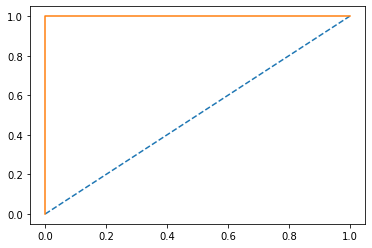

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')


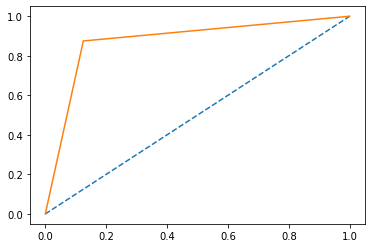

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')


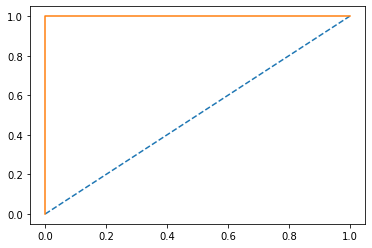

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')


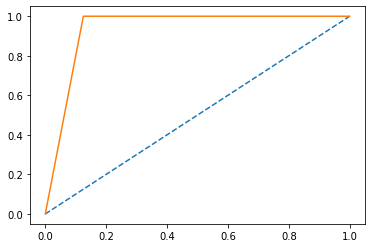

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')


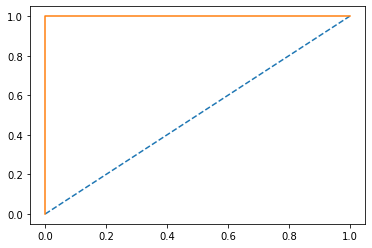

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


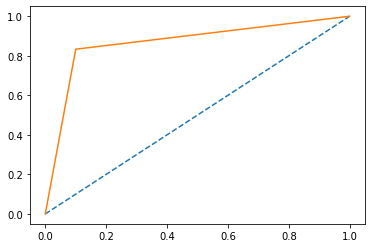

roc 0.8666666666666667
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')


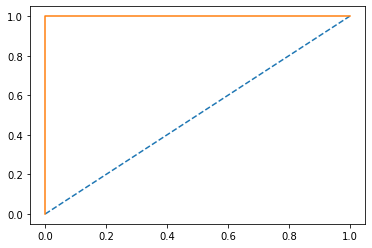

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')


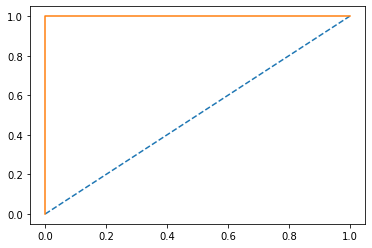

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')


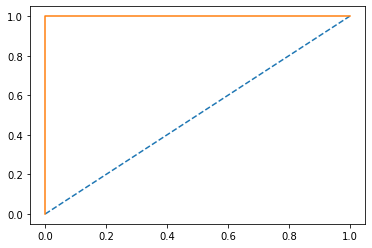

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')


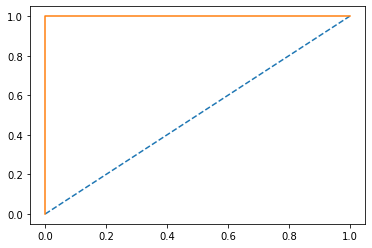

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')


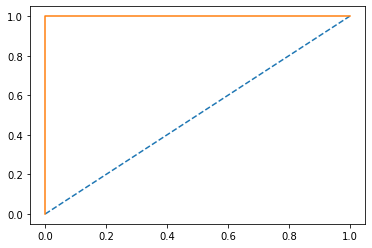

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1], device='cuda:0')


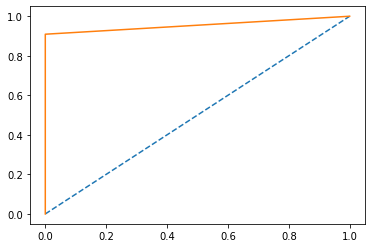

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


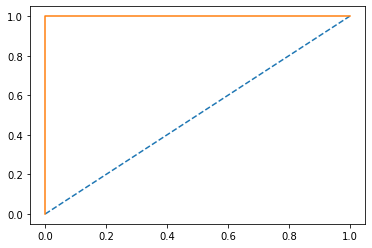

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')


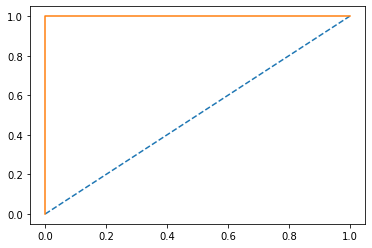

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')


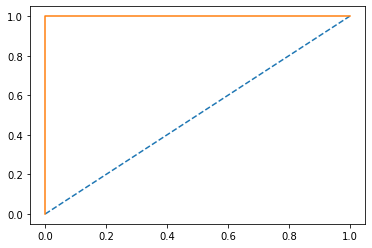

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')


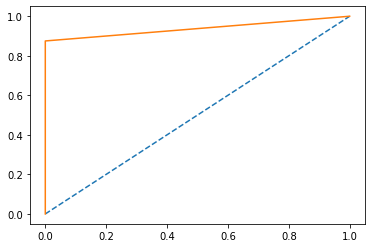

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


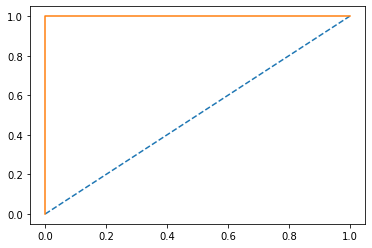

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0], device='cuda:0')


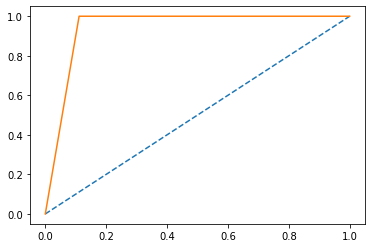

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')


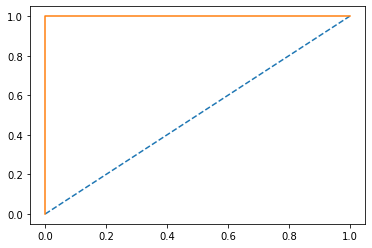

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')


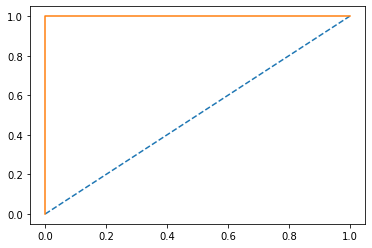

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


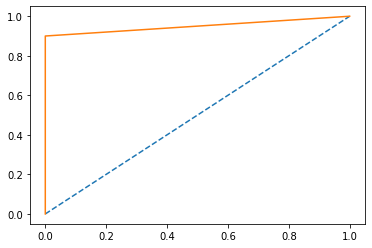

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1], device='cuda:0')


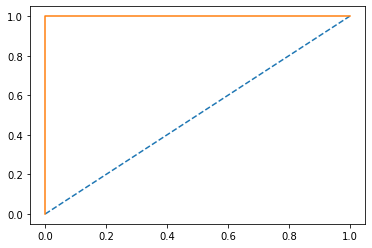

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')


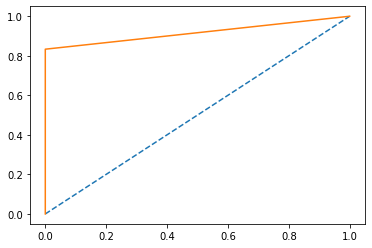

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')


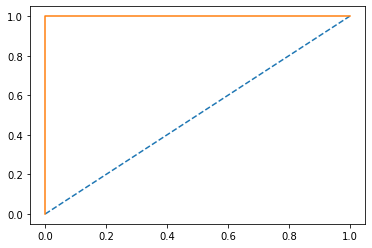

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')


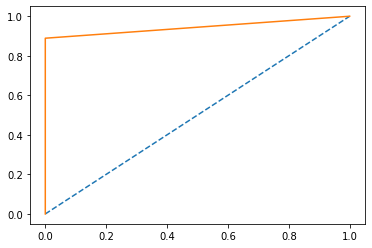

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')


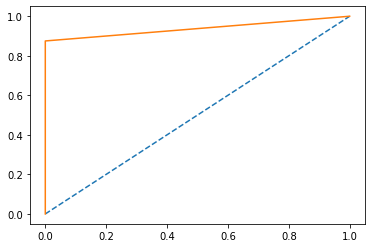

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')


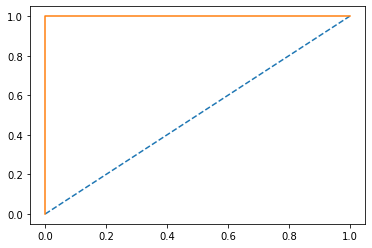

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')


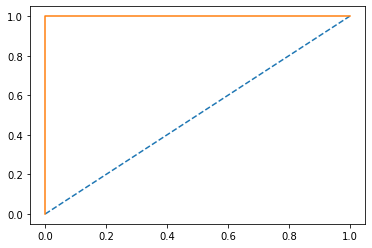

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1], device='cuda:0')


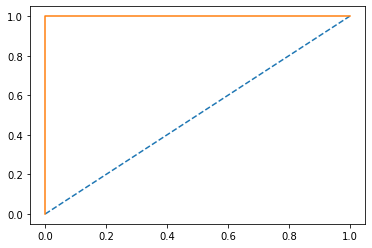

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


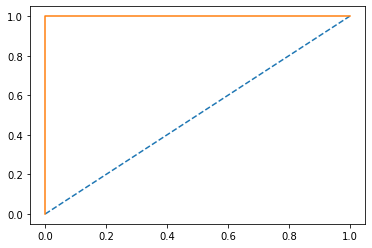

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')


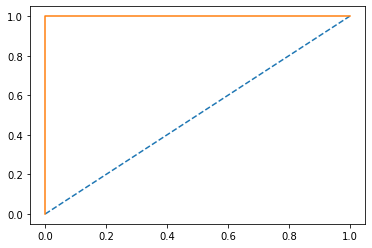

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')


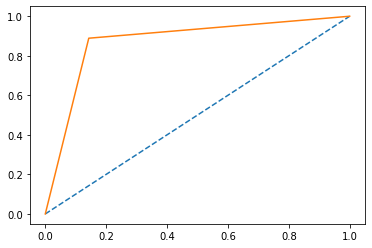

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')


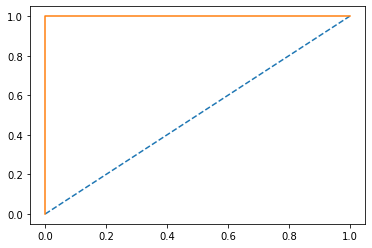

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')


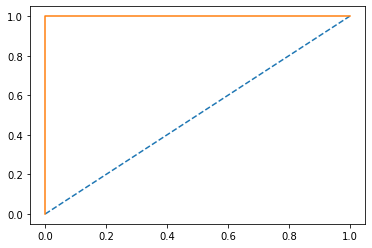

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')


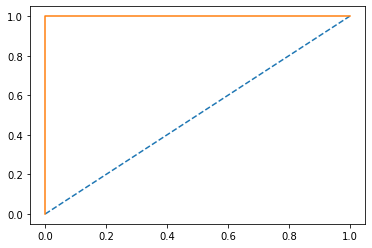

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')


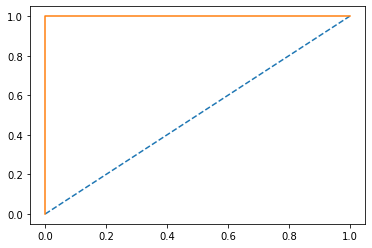

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')


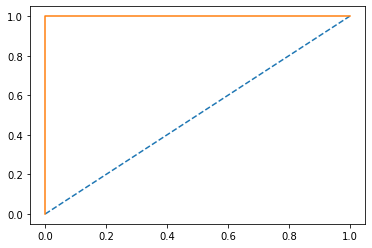

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1], device='cuda:0')


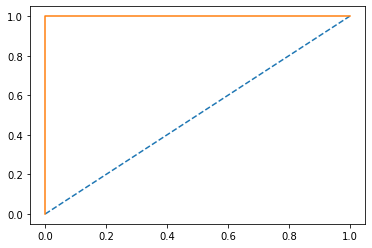

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')


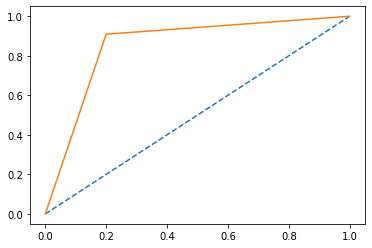

roc 0.8545454545454546
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


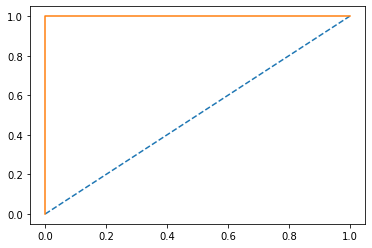

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')


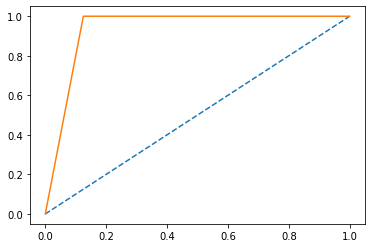

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')


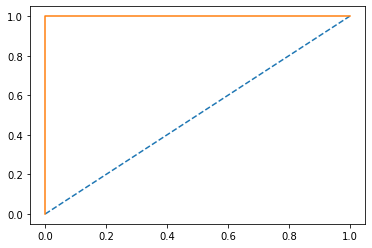

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')


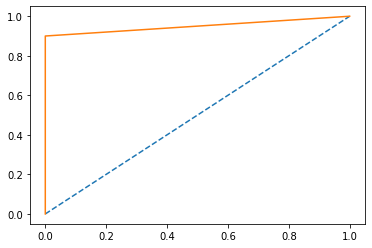

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')


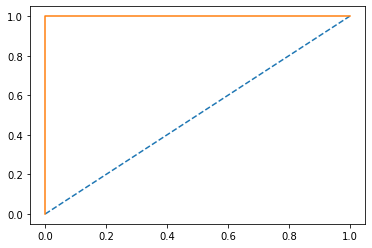

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')


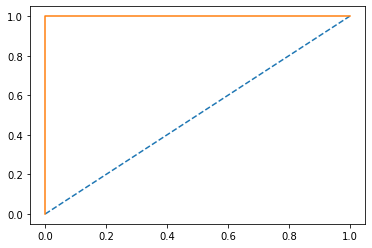

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')


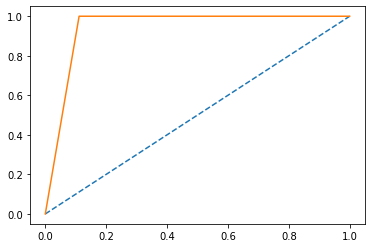

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')


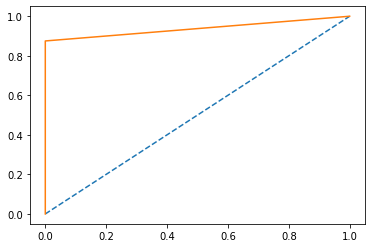

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')


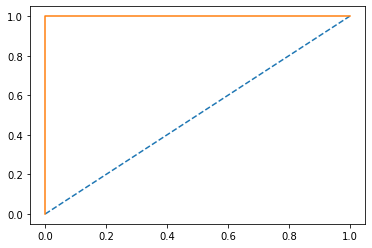

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')


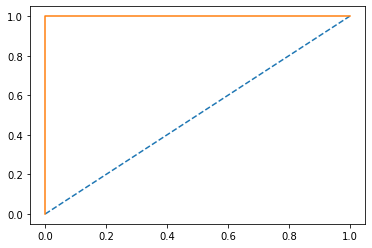

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')


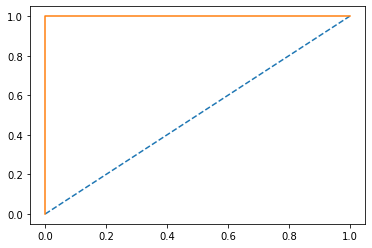

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')


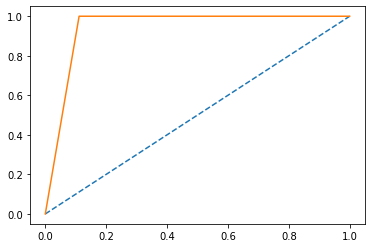

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')


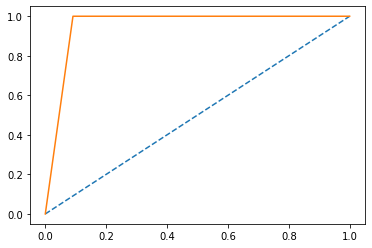

roc 0.9545454545454545
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')


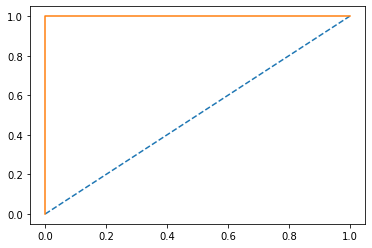

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')


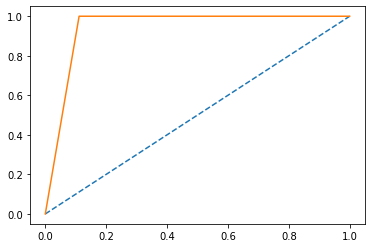

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')


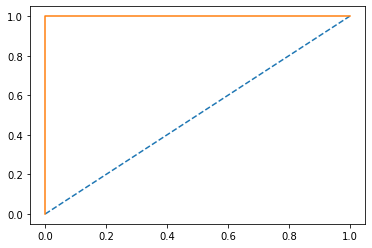

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')


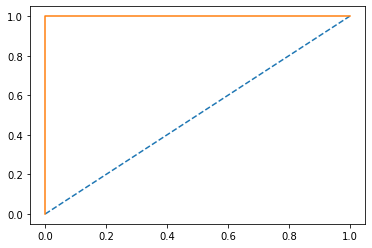

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')


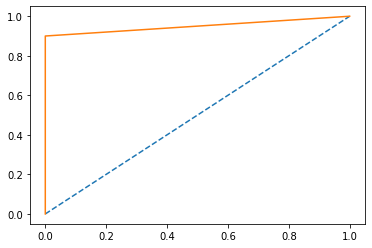

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')


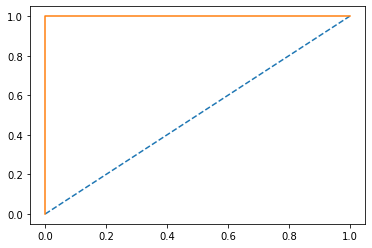

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')


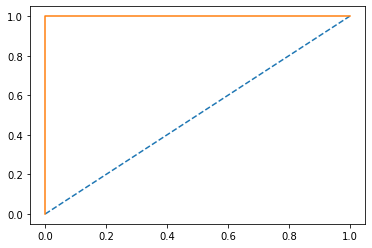

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')


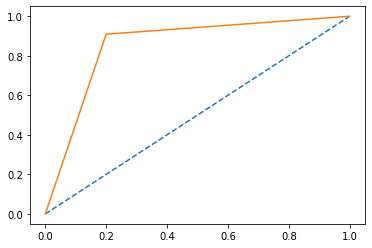

roc 0.8545454545454546
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')


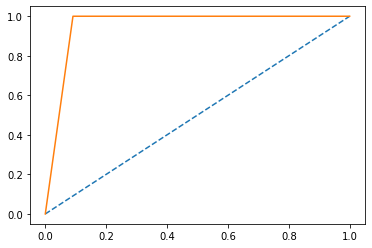

roc 0.9545454545454545
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')


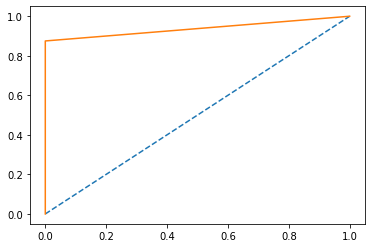

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')


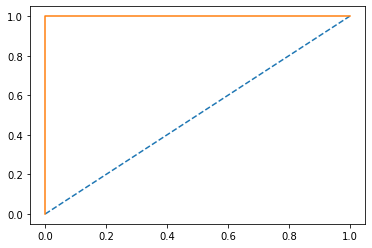

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0], device='cuda:0')


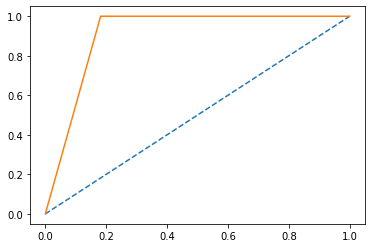

roc 0.9090909090909091
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


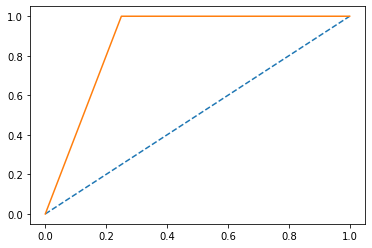

roc 0.875
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')


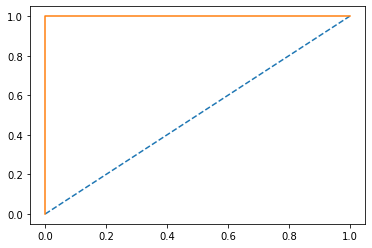

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')


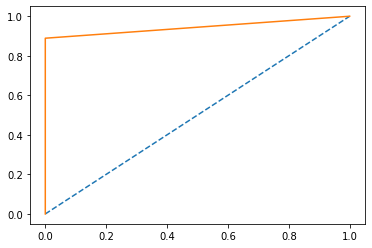

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')


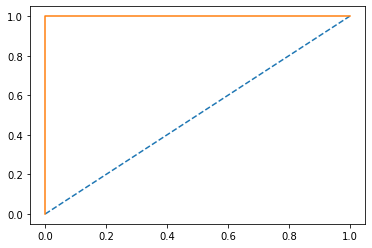

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


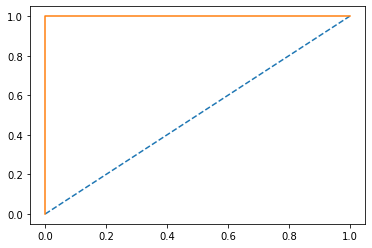

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')


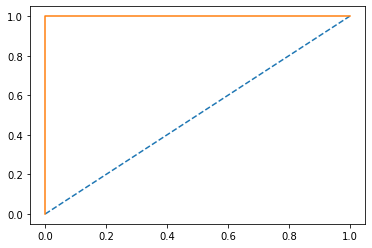

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')


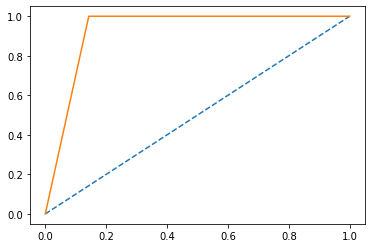

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')


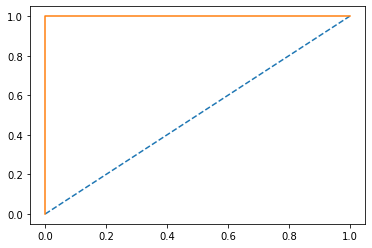

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')


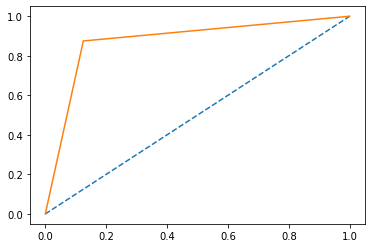

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')


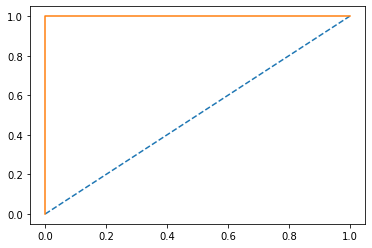

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')


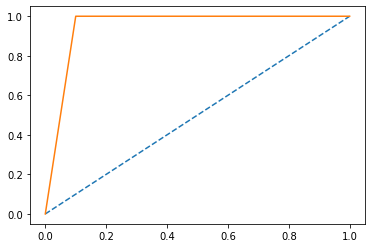

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')


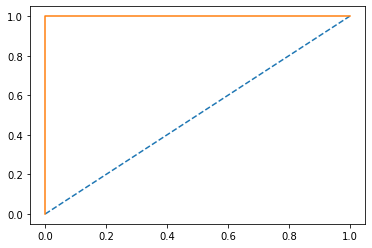

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')


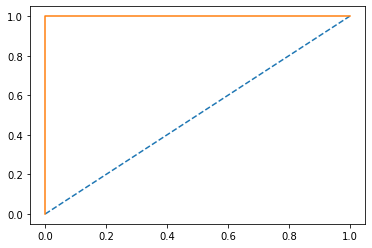

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')


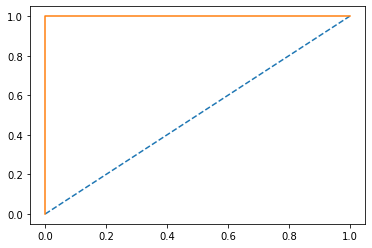

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')


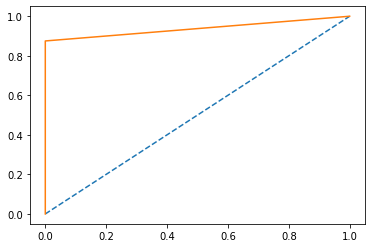

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')


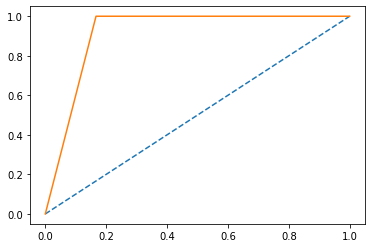

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')


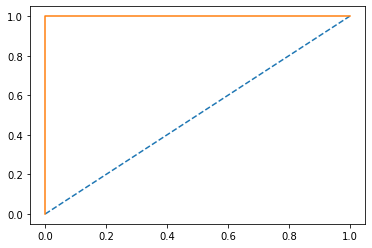

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')


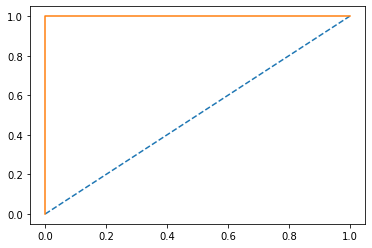

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')


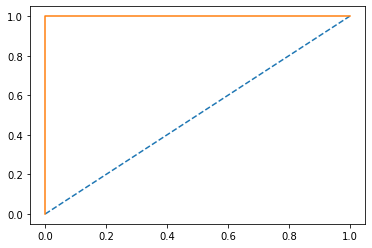

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')


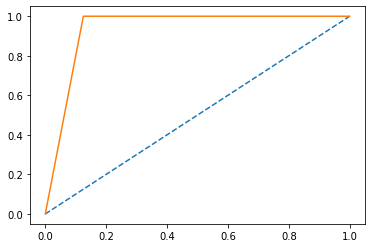

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')


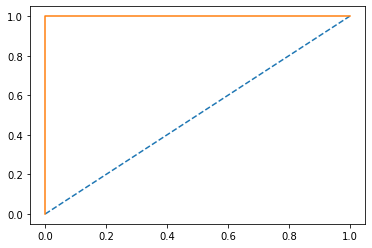

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')


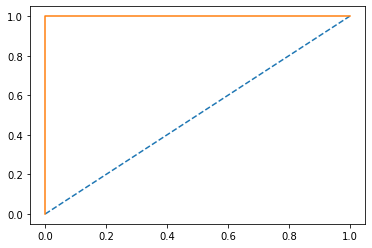

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')


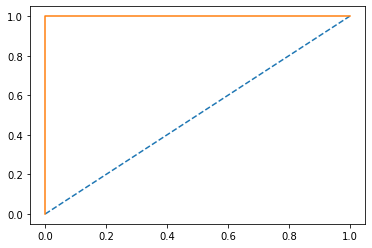

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0], device='cuda:0')


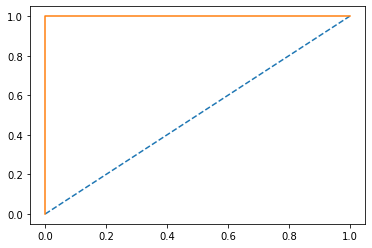

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')


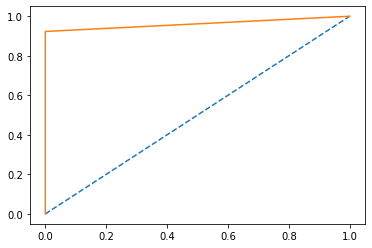

roc 0.9615384615384616
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')


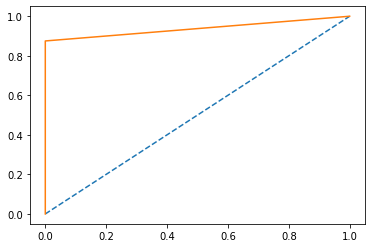

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')


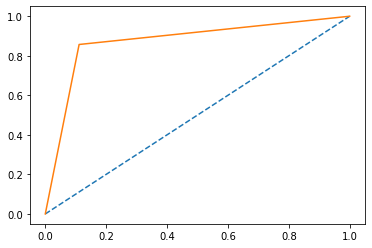

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')


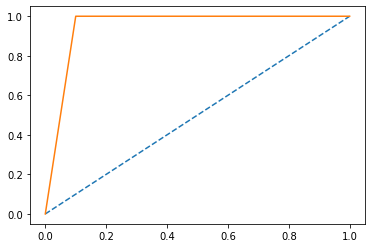

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')


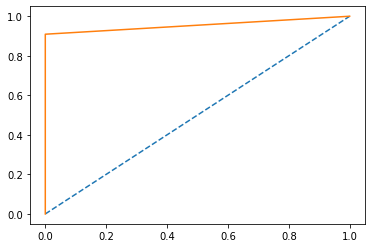

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')


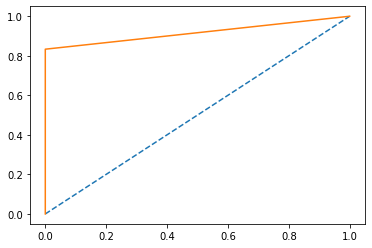

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')


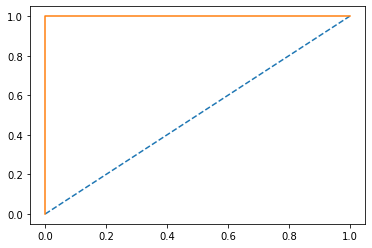

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')


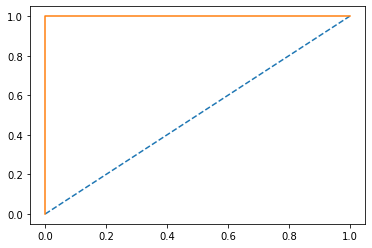

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')


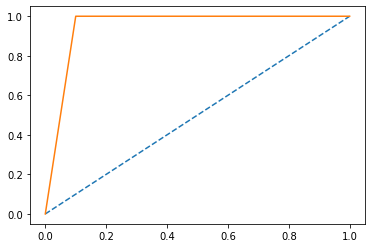

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')


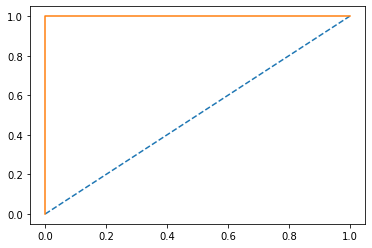

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')


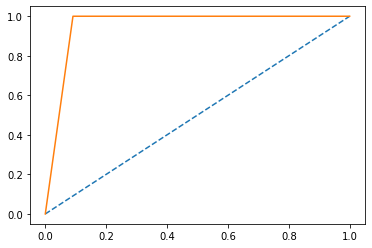

roc 0.9545454545454545
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')


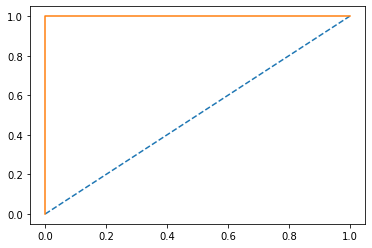

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')


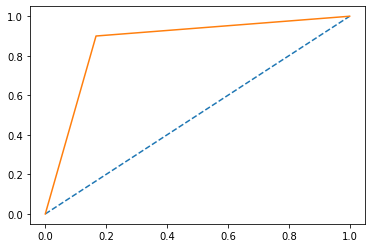

roc 0.8666666666666666
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1], device='cuda:0')


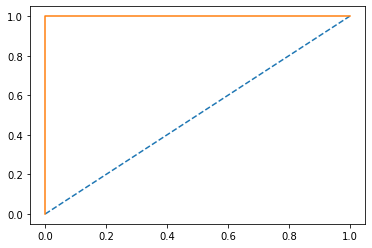

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


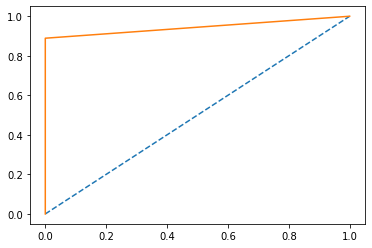

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')


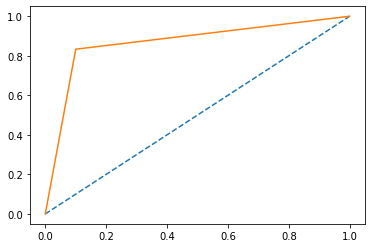

roc 0.8666666666666667
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')


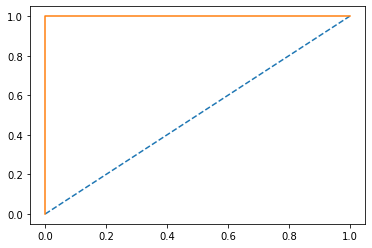

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')


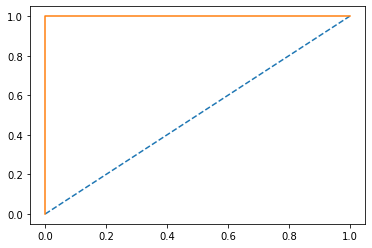

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')


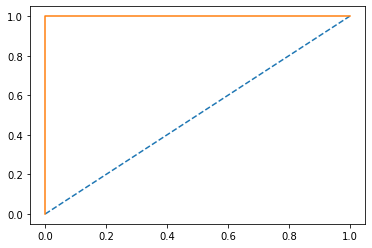

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')


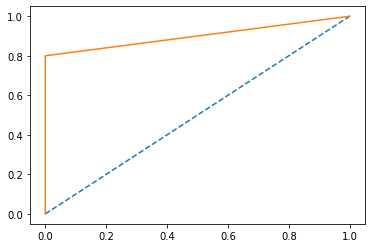

roc 0.9
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')


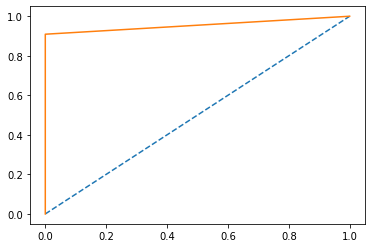

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')


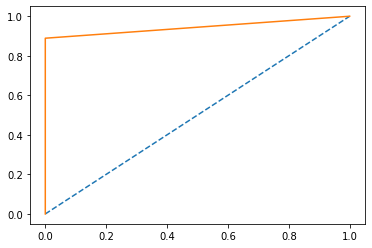

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


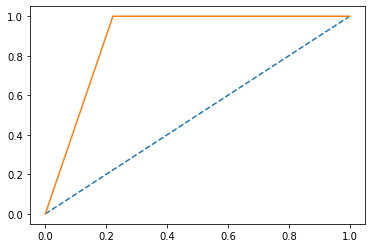

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')


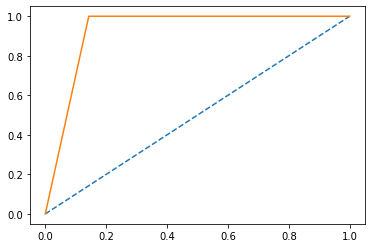

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')


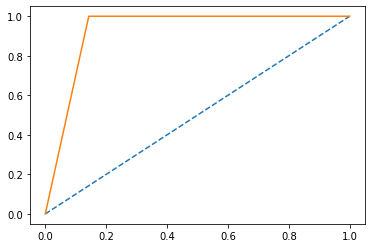

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1], device='cuda:0')


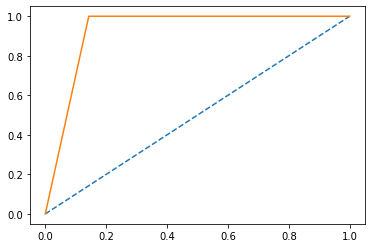

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')


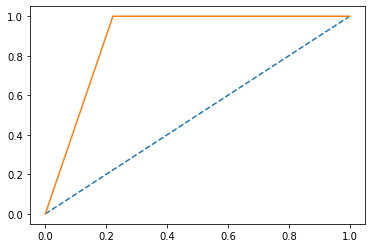

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')


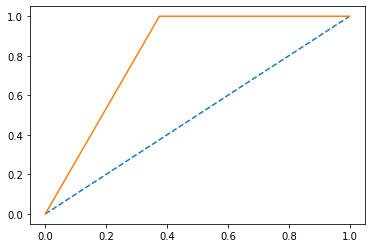

roc 0.8125
acc1 tensor(0.8125, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')


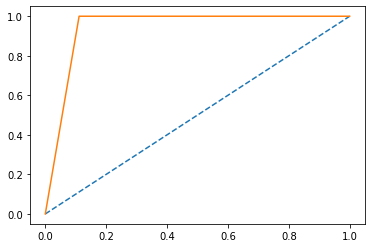

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


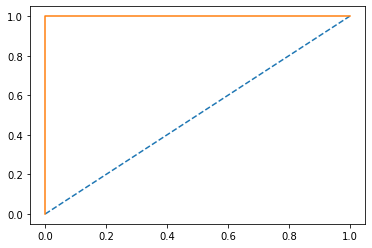

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')


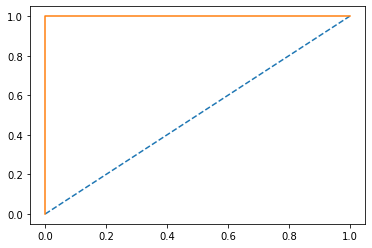

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')


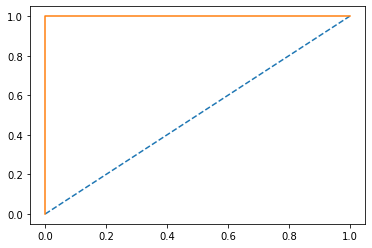

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')


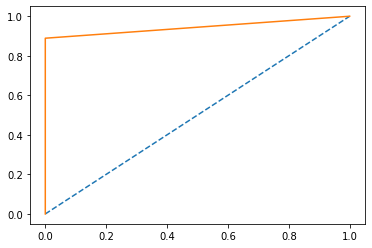

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')


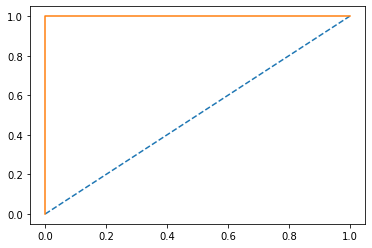

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')


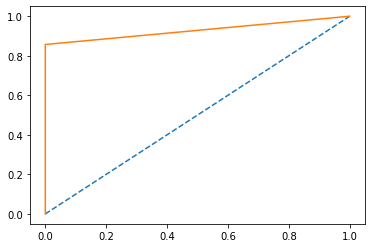

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')


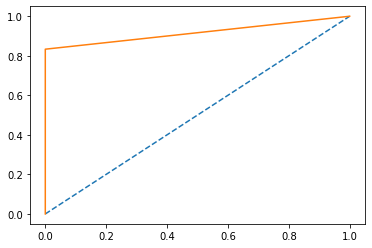

roc 0.9166666666666667
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')


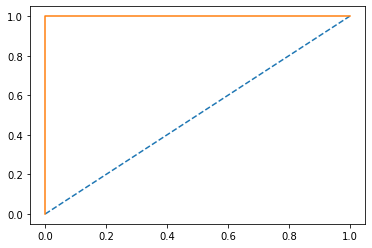

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')


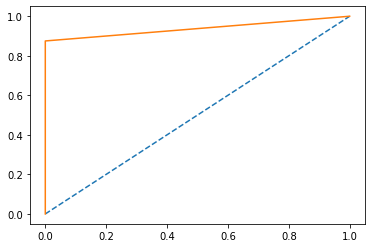

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')


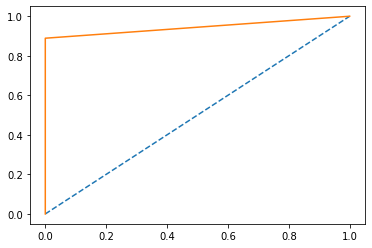

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')


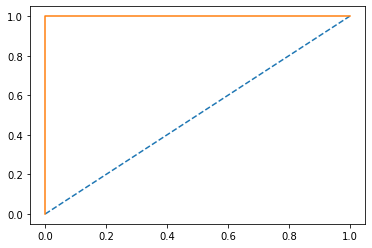

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')


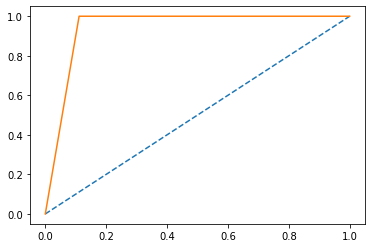

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')


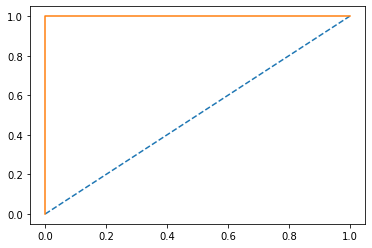

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')


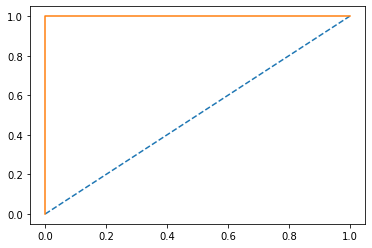

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


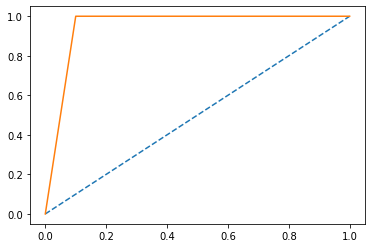

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')


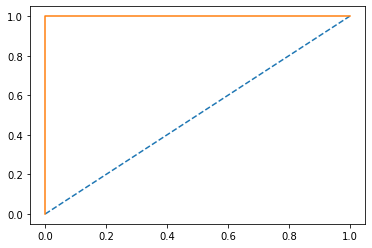

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')


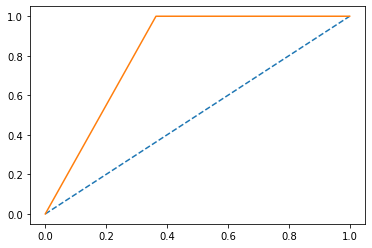

roc 0.8181818181818181
acc1 tensor(0.7500, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0], device='cuda:0')


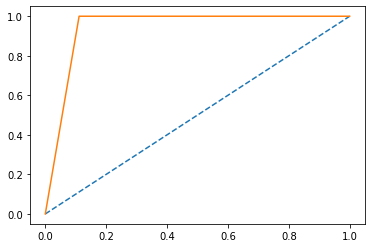

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')


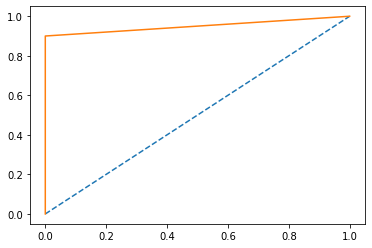

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')


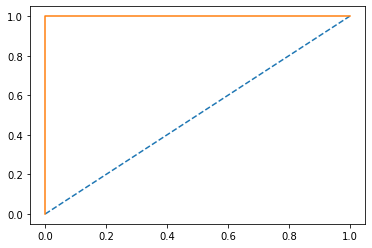

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')


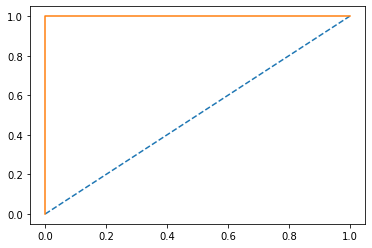

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')


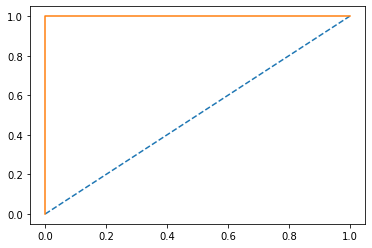

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')


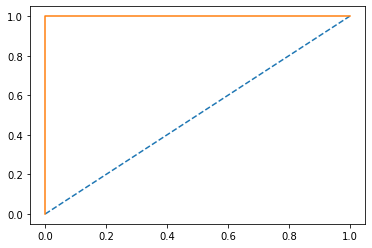

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')


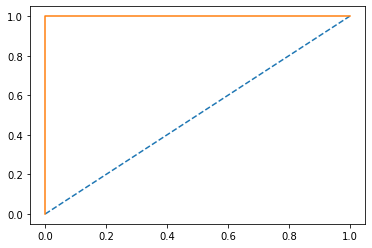

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')


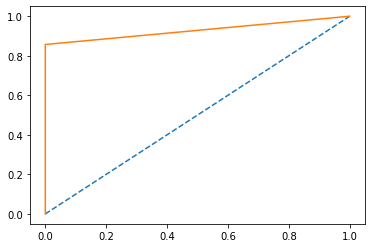

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')


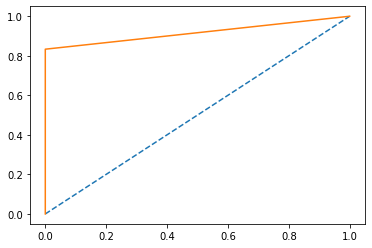

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')


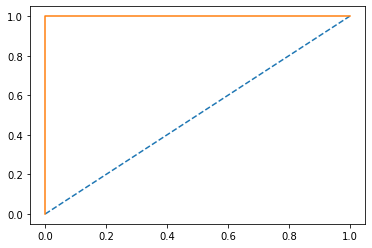

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')


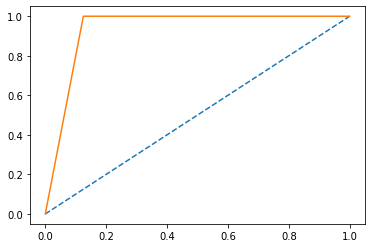

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')


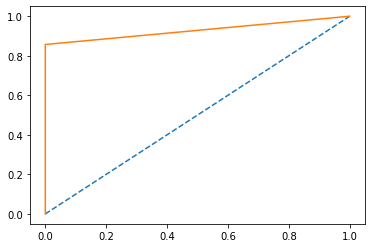

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')


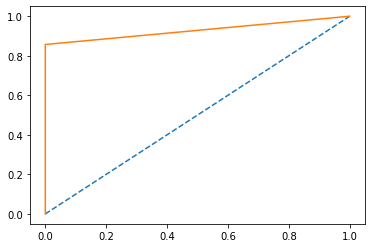

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')


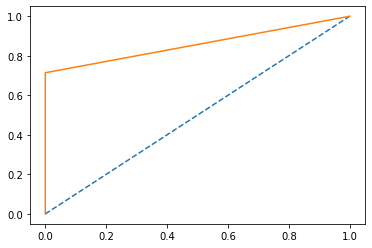

roc 0.8571428571428572
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')


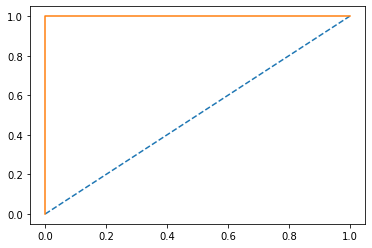

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')


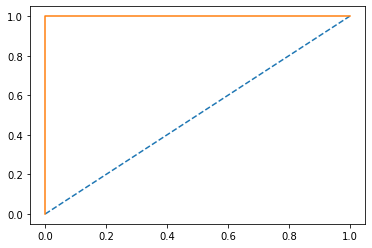

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')


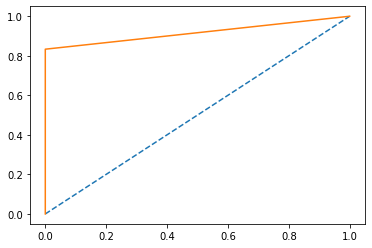

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')


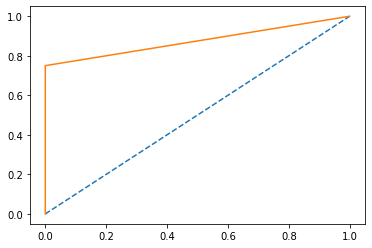

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')


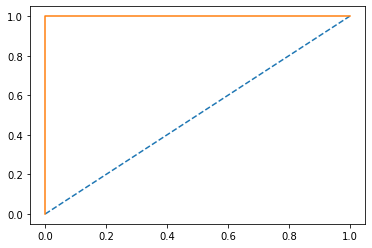

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')


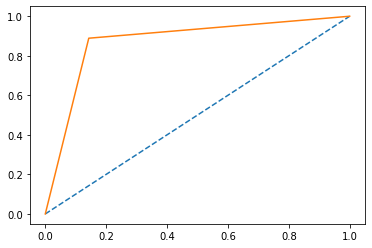

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


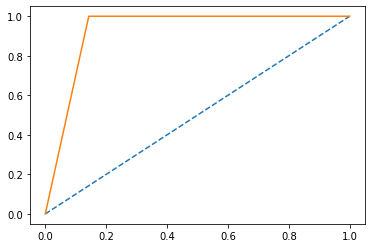

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')


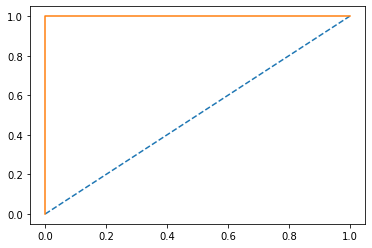

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


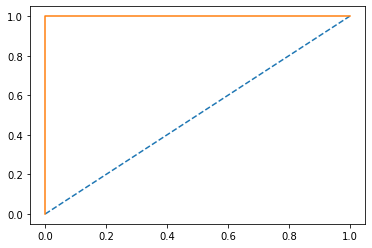

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')


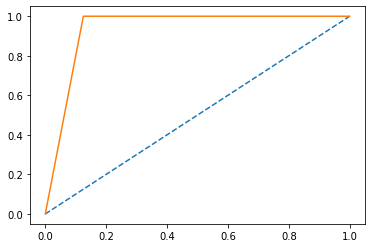

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


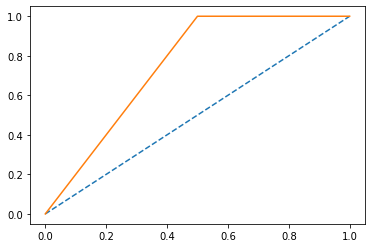

roc 0.75
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1], device='cuda:0')


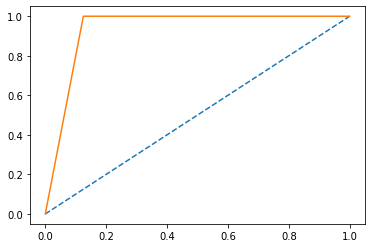

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


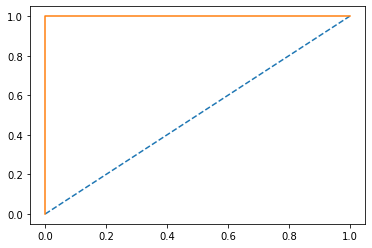

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')


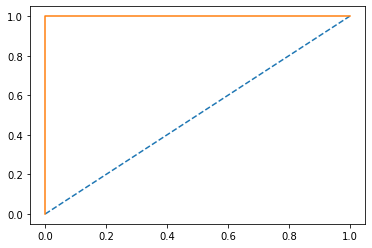

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


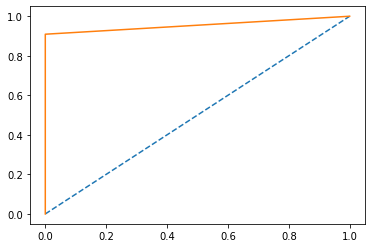

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


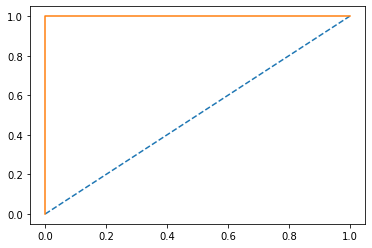

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')


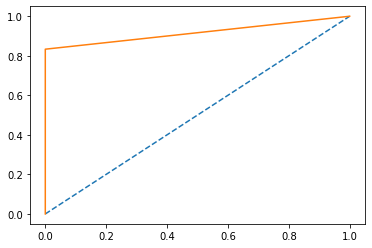

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')


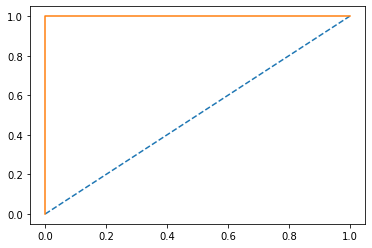

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')


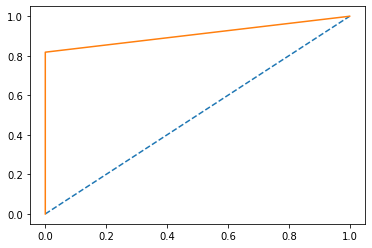

roc 0.9090909090909092
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')


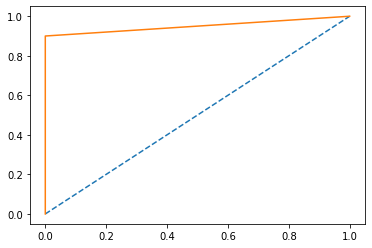

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')


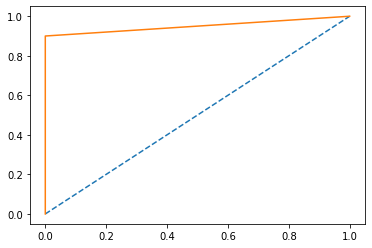

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')


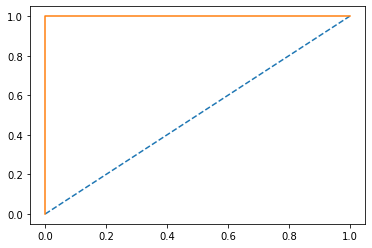

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')


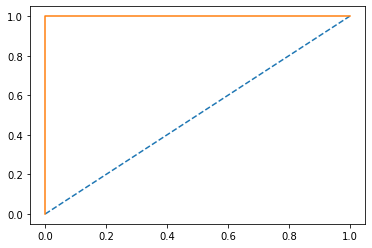

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')


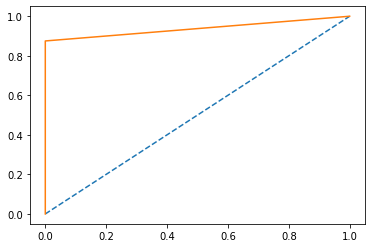

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')


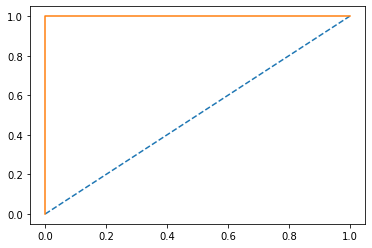

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')


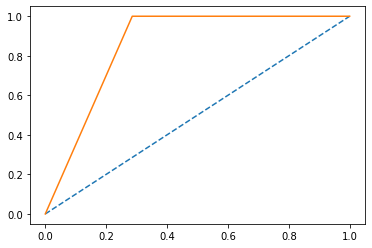

roc 0.8571428571428572
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1], device='cuda:0')


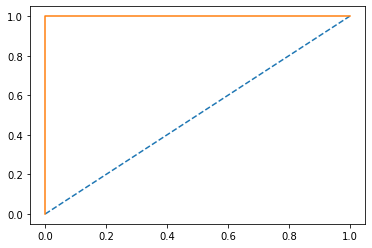

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1], device='cuda:0')


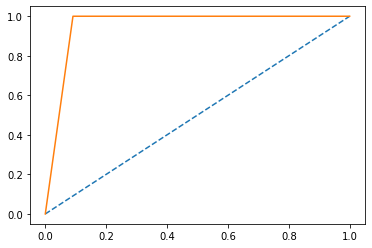

roc 0.9545454545454545
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')


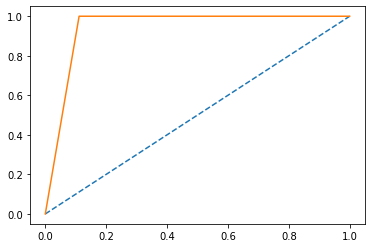

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')


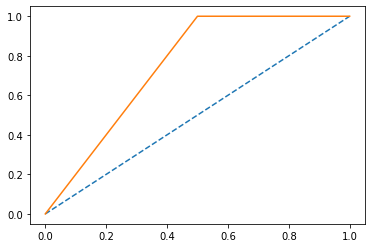

roc 0.75
acc1 tensor(0.8125, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')


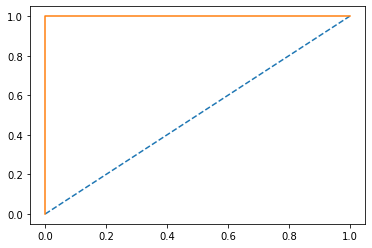

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')


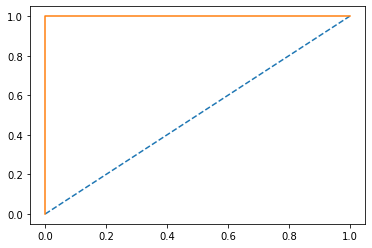

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')


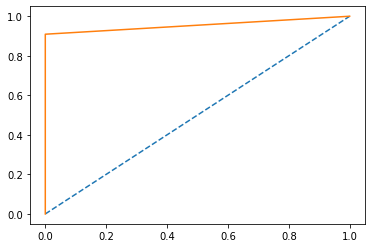

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')


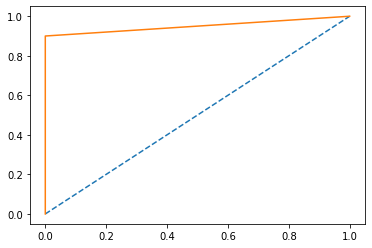

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')


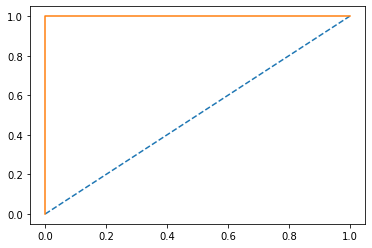

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')


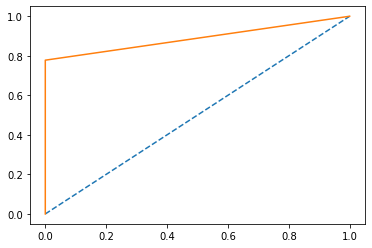

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')


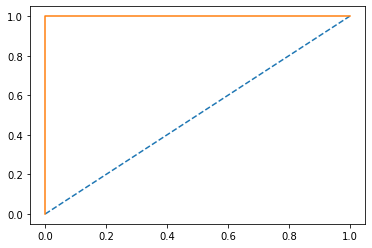

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')


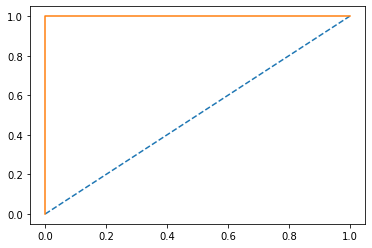

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')


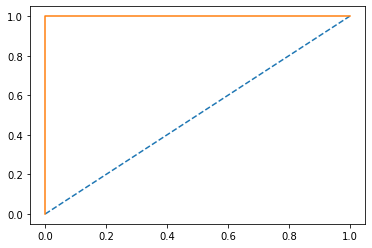

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')


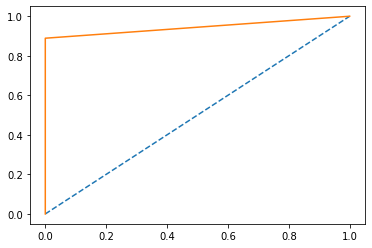

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')


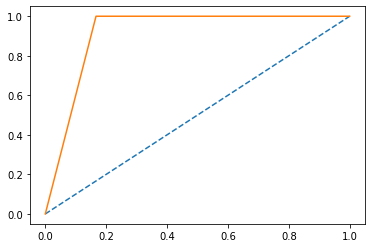

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')


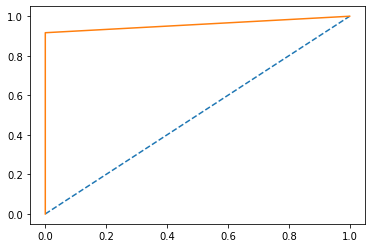

roc 0.9583333333333333
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')


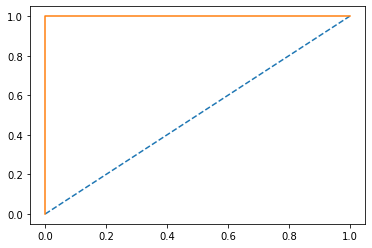

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')


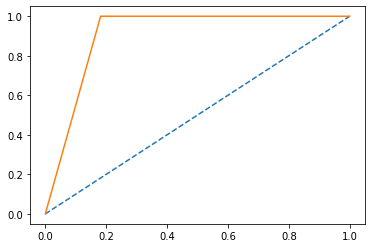

roc 0.9090909090909091
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')


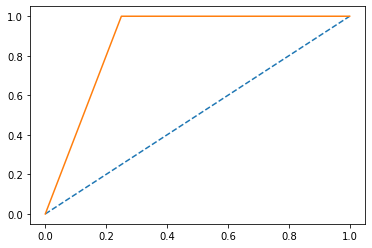

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')


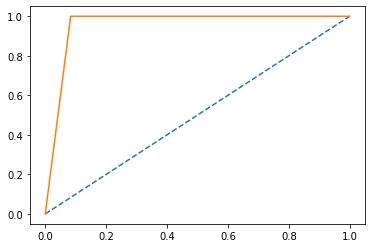

roc 0.9583333333333333
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')


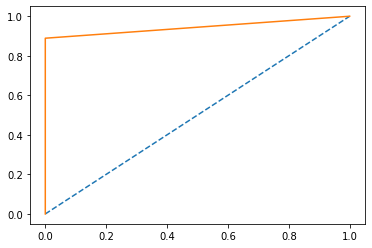

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')


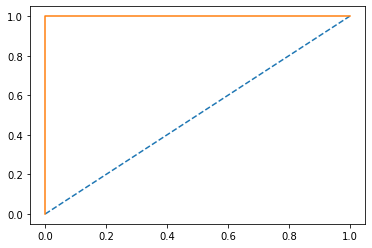

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')


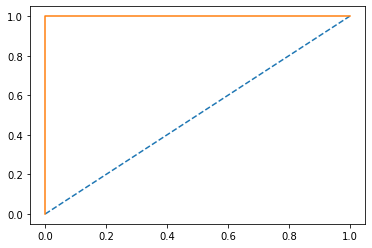

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')


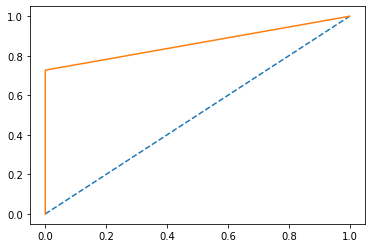

roc 0.8636363636363636
acc1 tensor(0.8125, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')


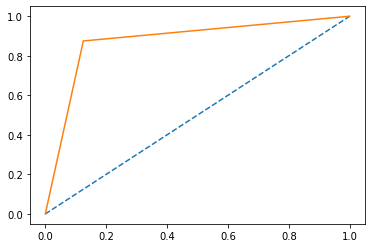

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')


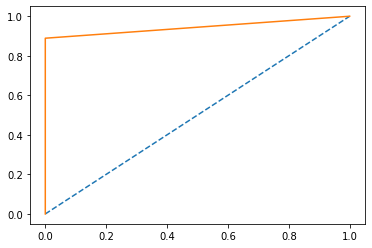

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')


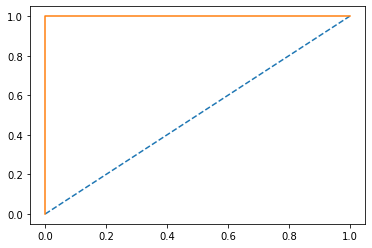

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')


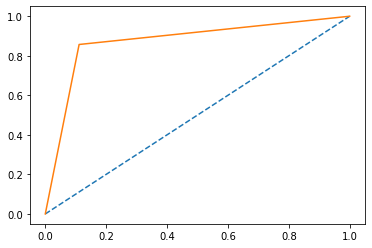

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')


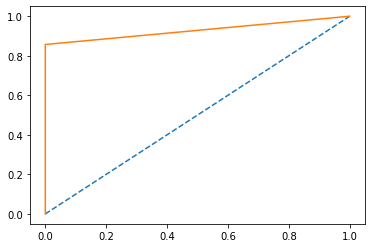

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')


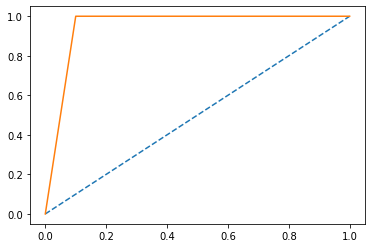

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')


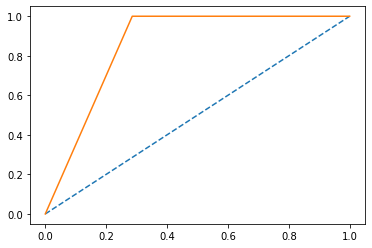

roc 0.8571428571428572
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')


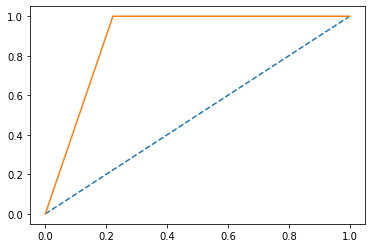

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')


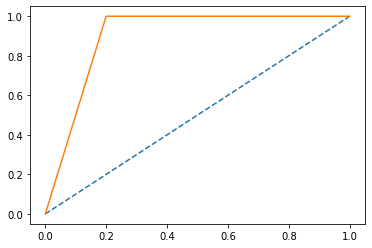

roc 0.9
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')


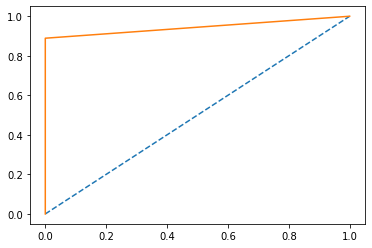

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


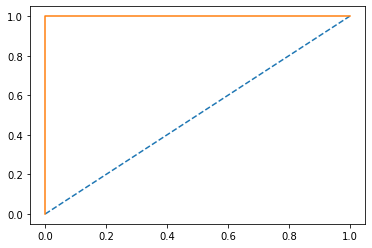

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')


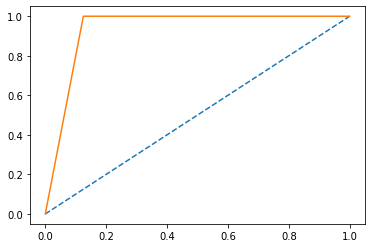

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')


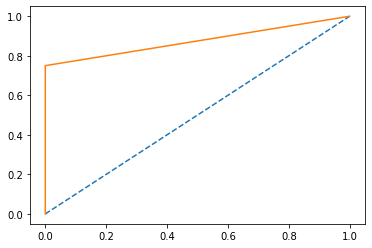

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')


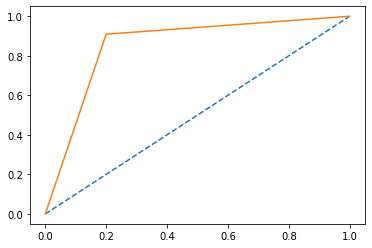

roc 0.8545454545454546
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')


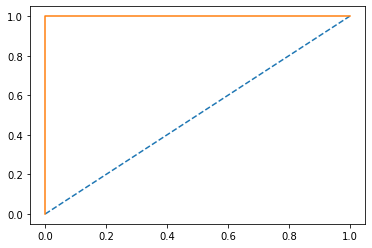

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')


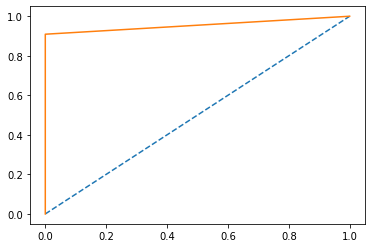

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')


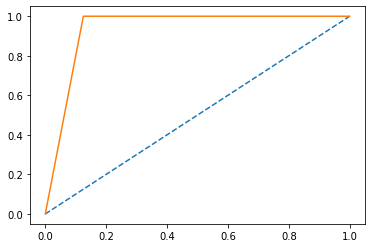

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')


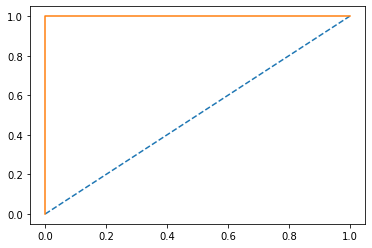

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


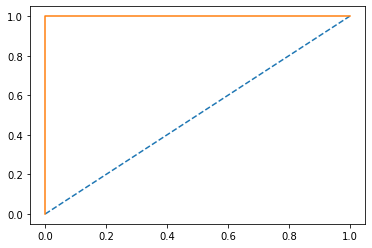

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1], device='cuda:0')


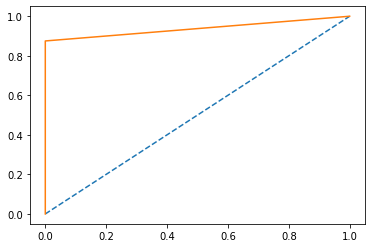

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')


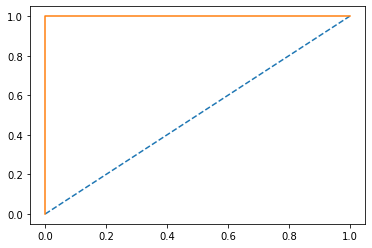

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0], device='cuda:0')


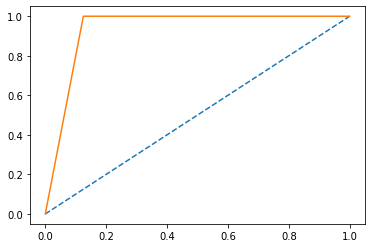

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1], device='cuda:0')


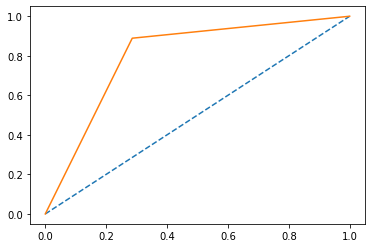

roc 0.8015873015873016
acc1 tensor(0.8125, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')


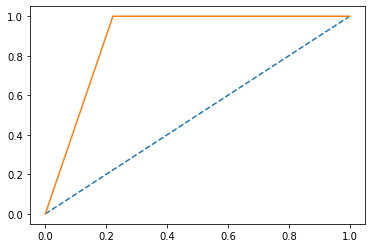

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')


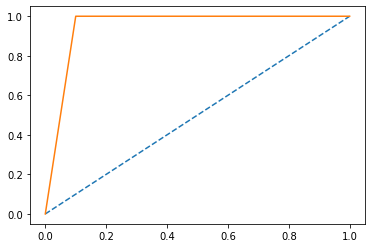

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


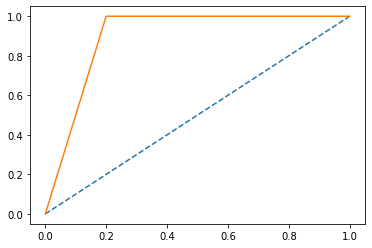

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')


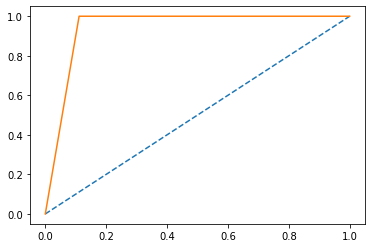

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')


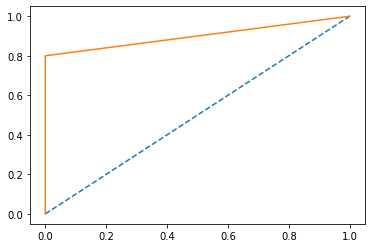

roc 0.9
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')


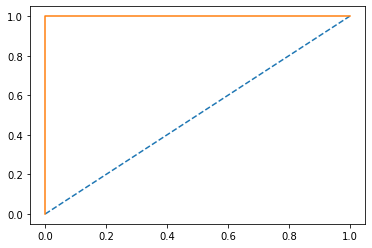

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')


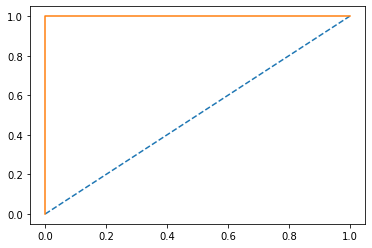

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')


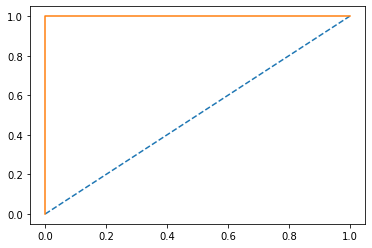

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')


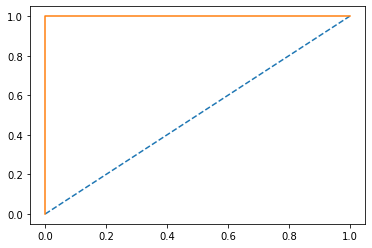

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')


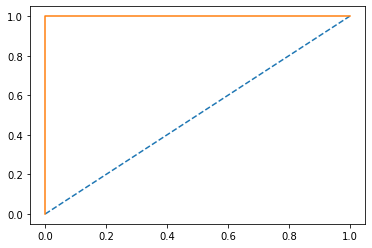

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')


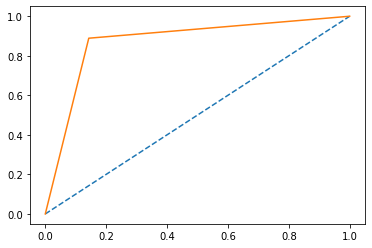

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')


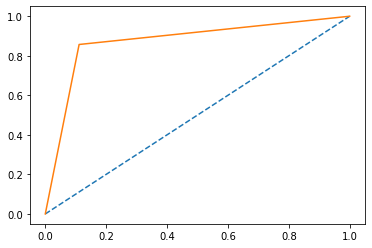

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')


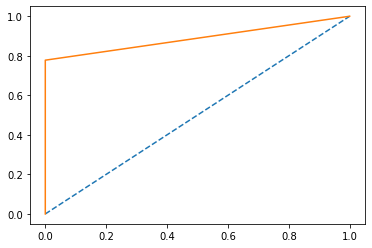

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')


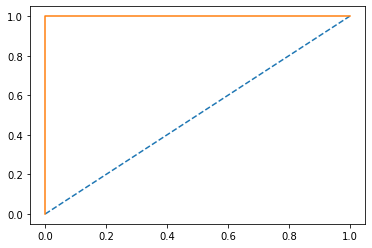

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')


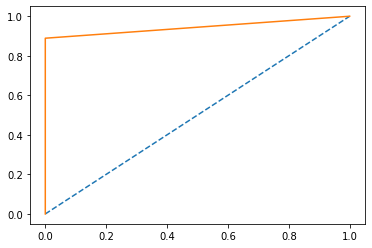

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')


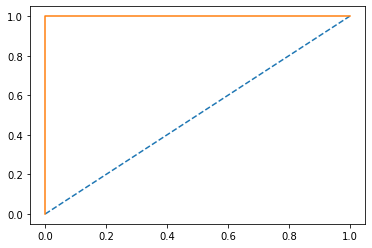

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')


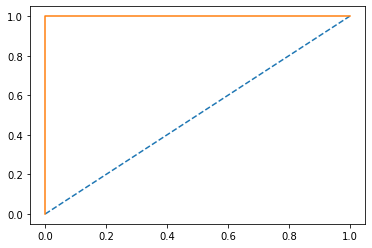

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')


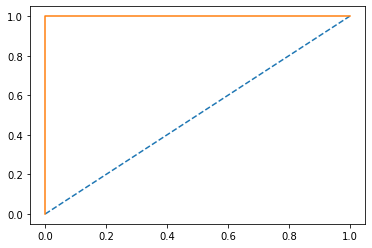

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')


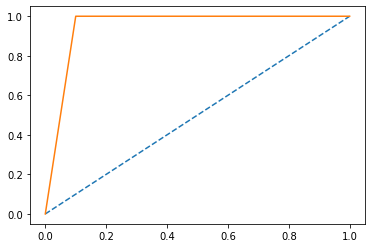

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')


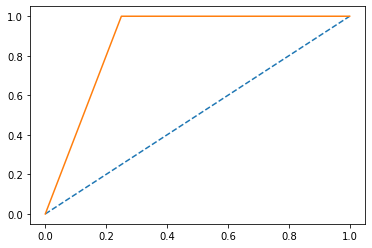

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')


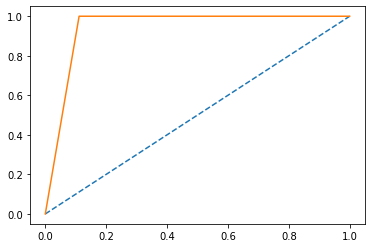

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')


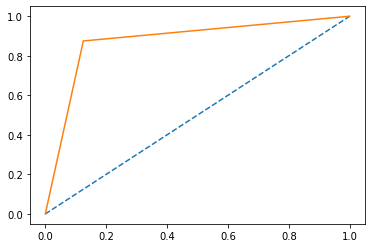

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


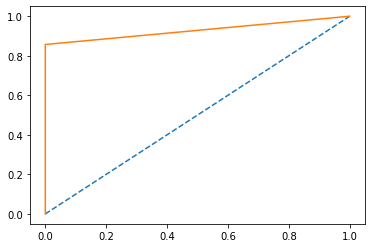

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')


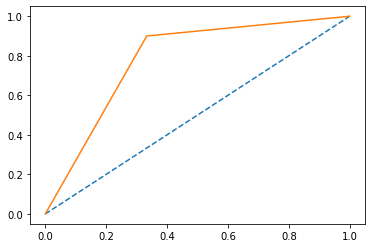

roc 0.7833333333333334
acc1 tensor(0.8125, device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')


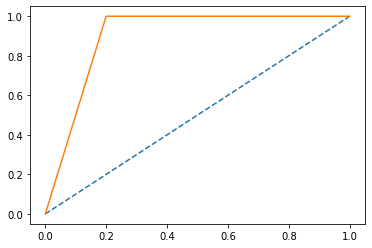

roc 0.9
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


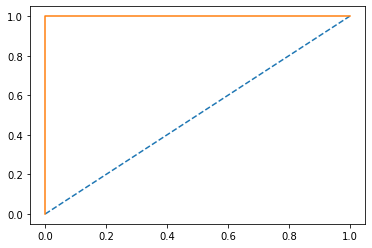

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')


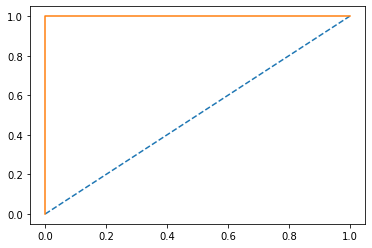

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


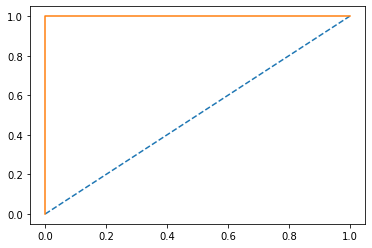

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


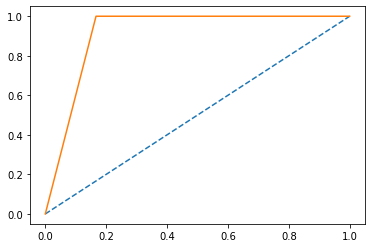

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')


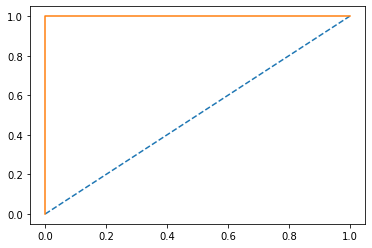

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')


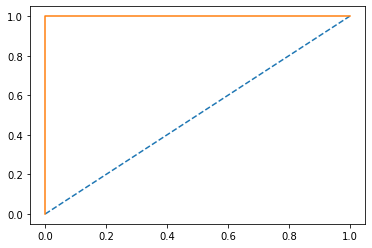

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1], device='cuda:0')


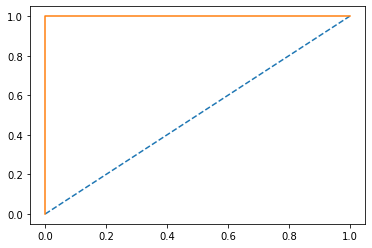

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')


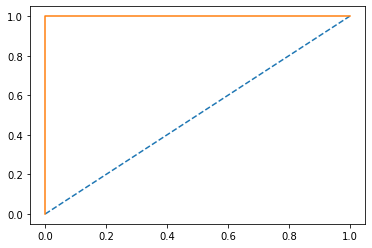

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')


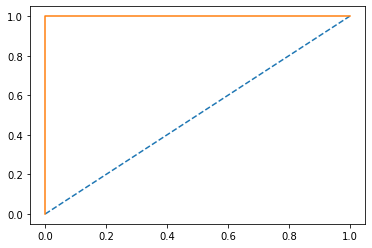

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


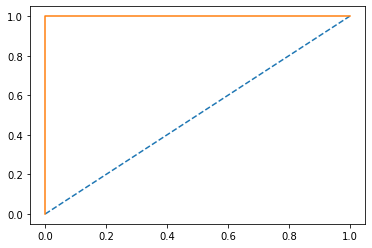

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')


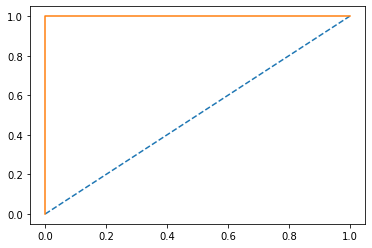

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


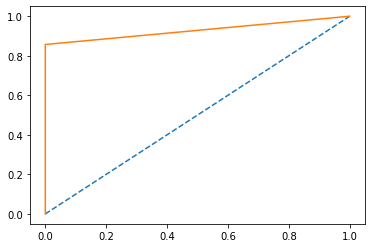

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')


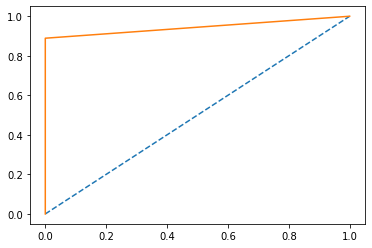

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')


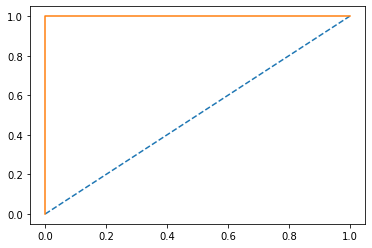

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


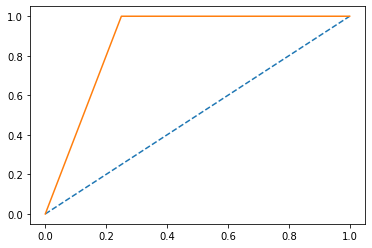

roc 0.875
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')


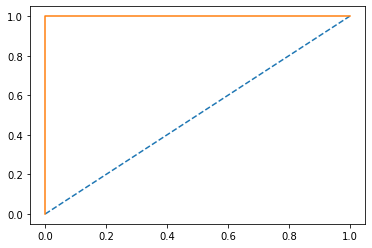

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')


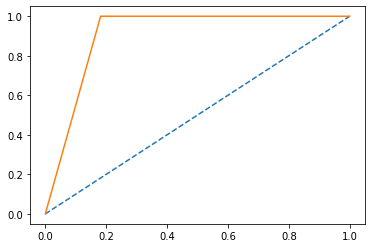

roc 0.9090909090909091
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')


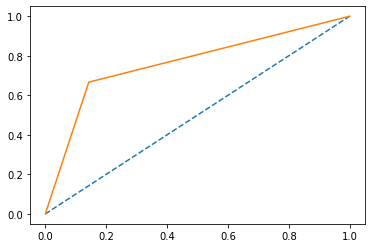

roc 0.7619047619047619
acc1 tensor(0.7500, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')


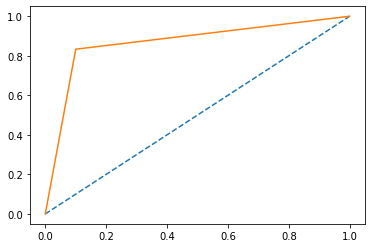

roc 0.8666666666666667
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')


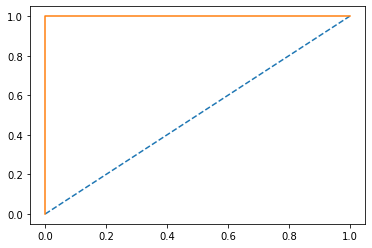

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')


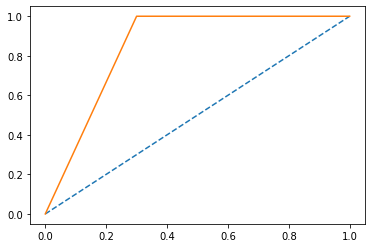

roc 0.85
acc1 tensor(0.8125, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1], device='cuda:0')


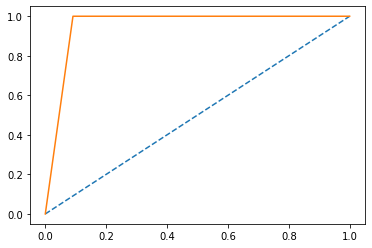

roc 0.9545454545454545
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')


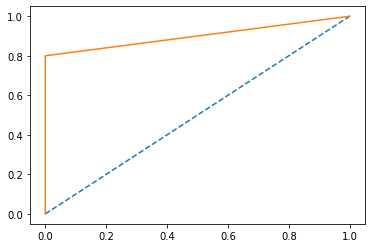

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


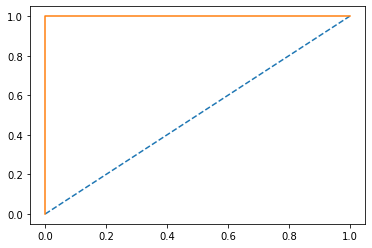

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')


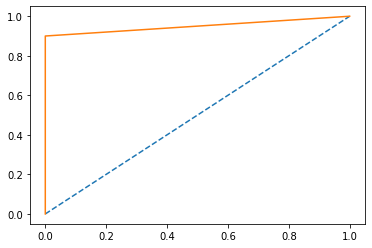

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')


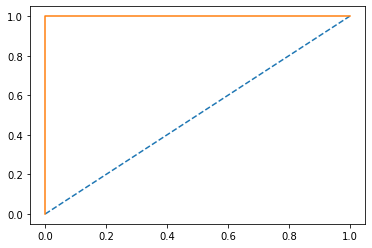

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')


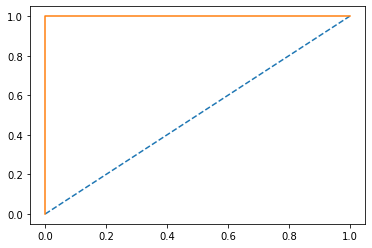

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')


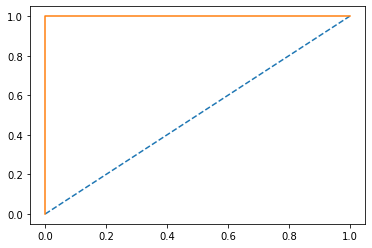

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')


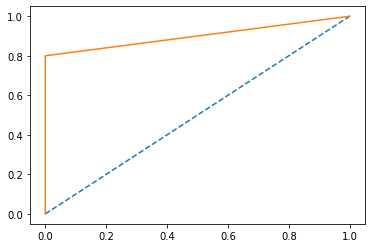

roc 0.9
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')


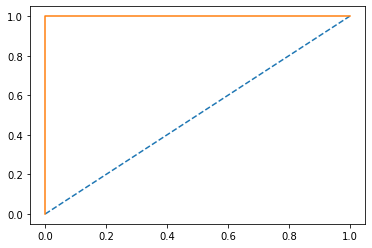

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')


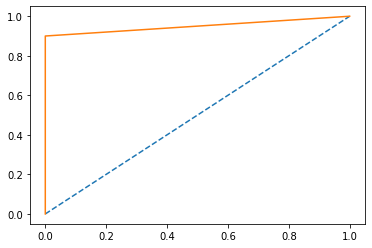

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1], device='cuda:0')


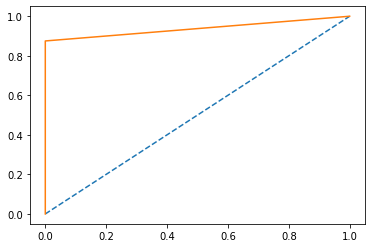

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')


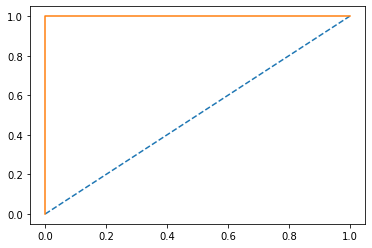

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')


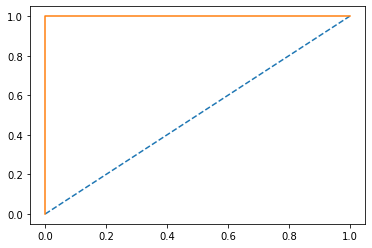

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')


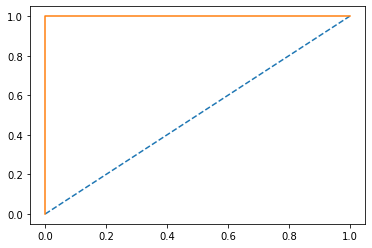

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')


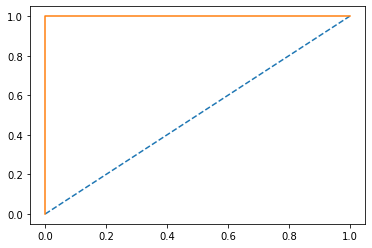

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')


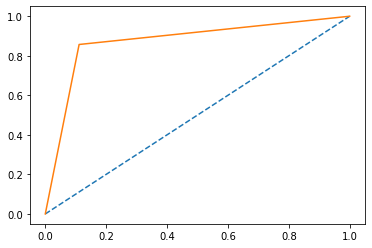

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')


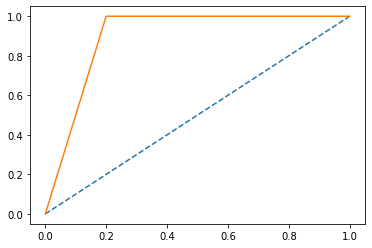

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')


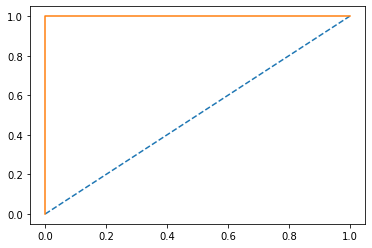

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')


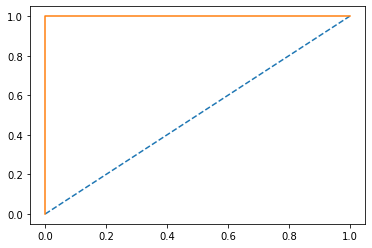

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')


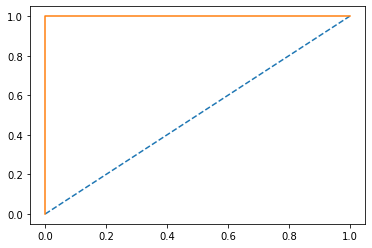

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')


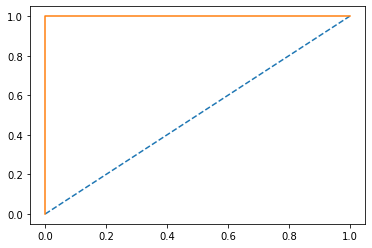

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')


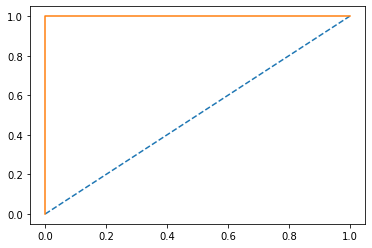

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')


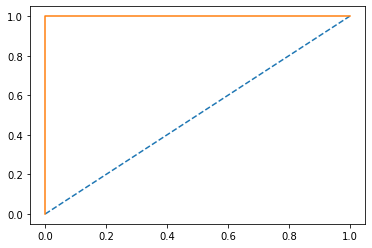

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')


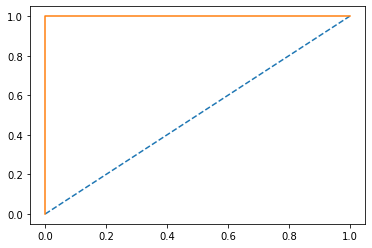

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')


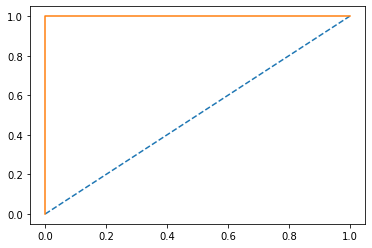

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')


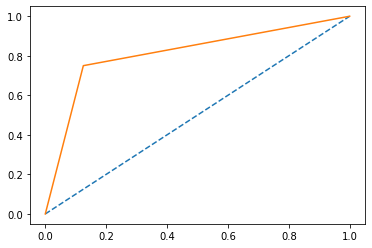

roc 0.8125
acc1 tensor(0.8125, device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')


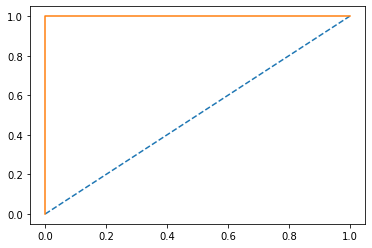

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')


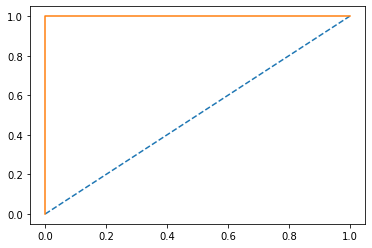

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')


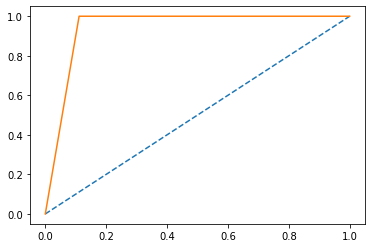

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


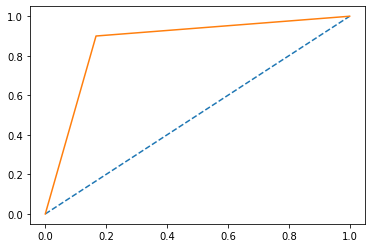

roc 0.8666666666666666
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


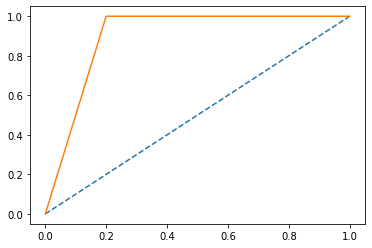

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')


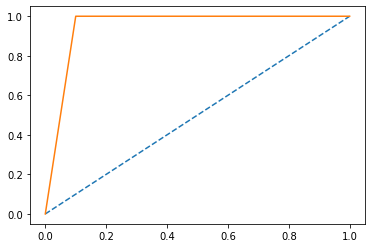

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')


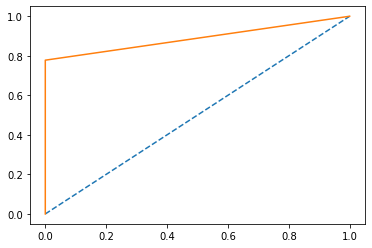

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')


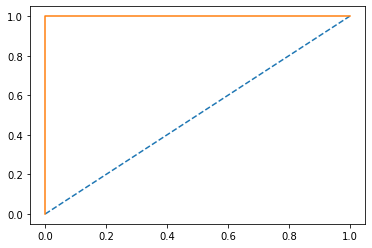

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')


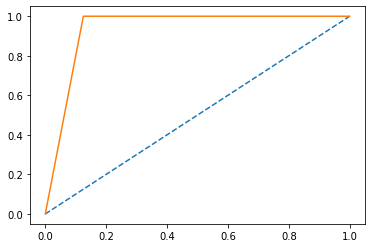

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')


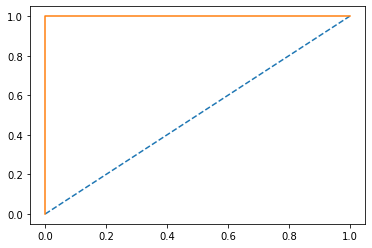

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')


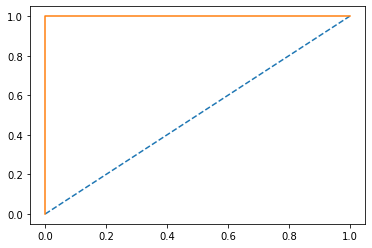

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')


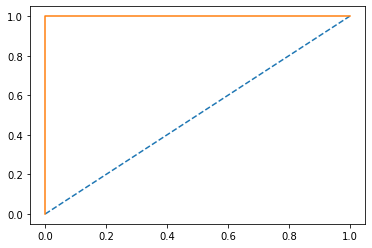

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


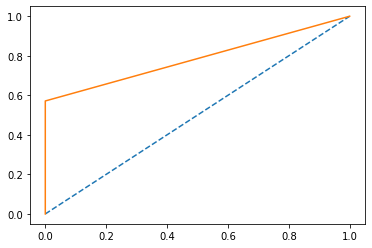

roc 0.7857142857142857
acc1 tensor(0.8125, device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')


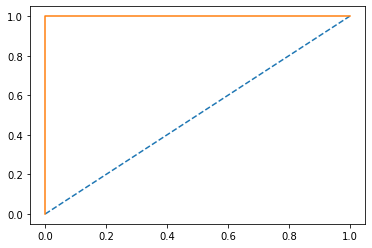

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')


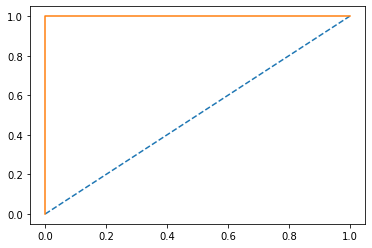

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')


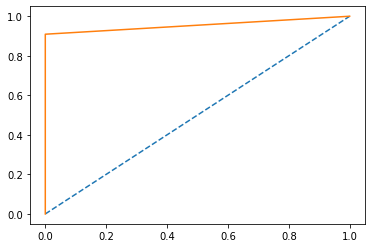

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')


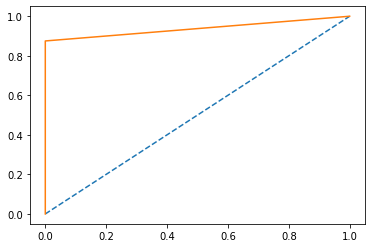

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


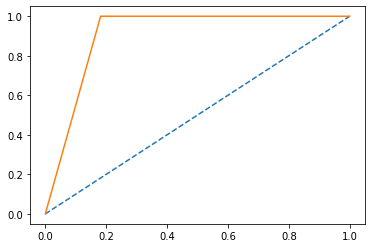

roc 0.9090909090909091
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')


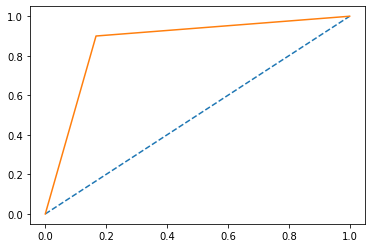

roc 0.8666666666666666
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')


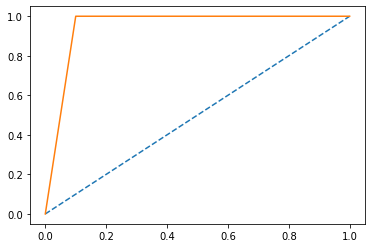

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')


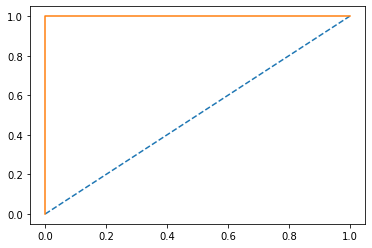

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')


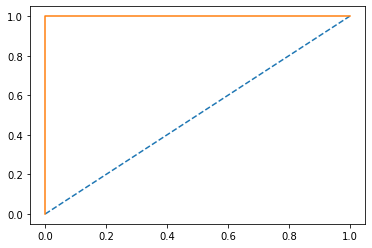

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')


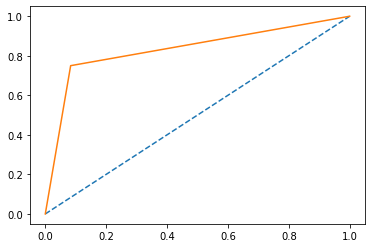

roc 0.8333333333333333
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')


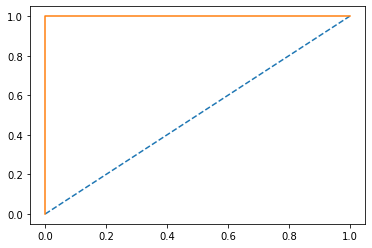

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')


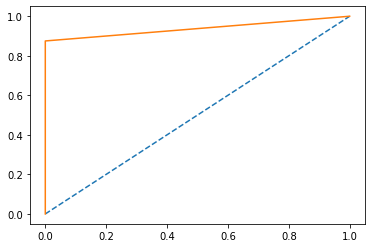

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


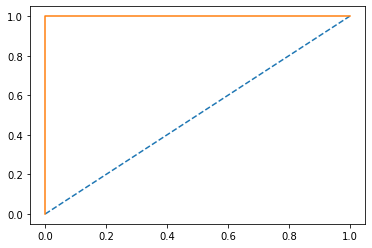

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


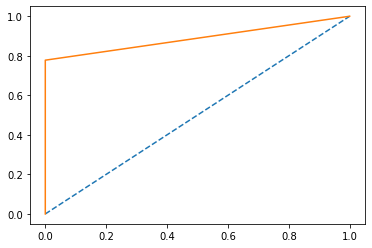

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')


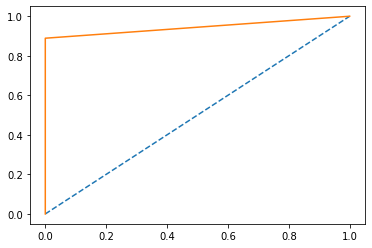

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1], device='cuda:0')


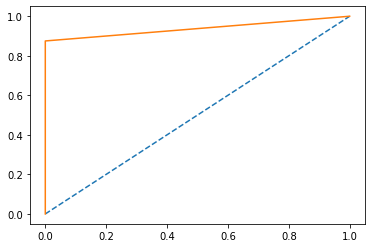

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')


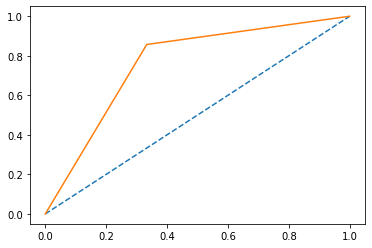

roc 0.7619047619047621
acc1 tensor(0.7500, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')


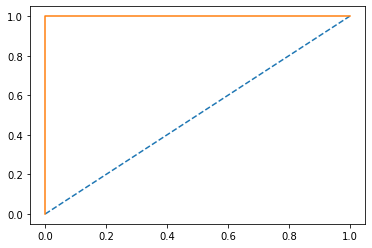

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')


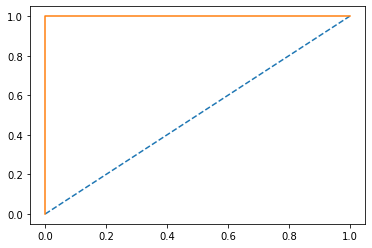

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')


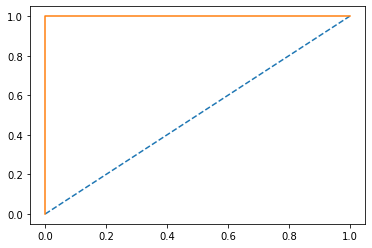

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1], device='cuda:0')


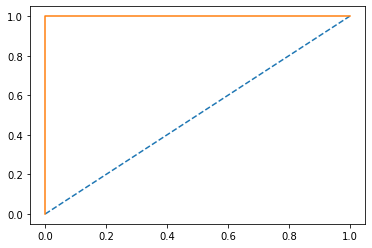

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


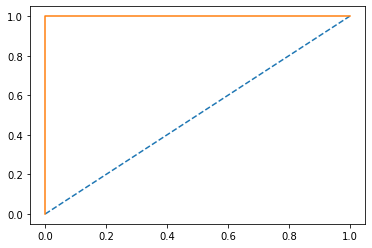

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0], device='cuda:0')


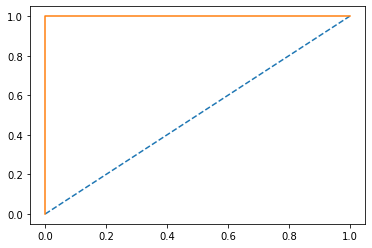

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')


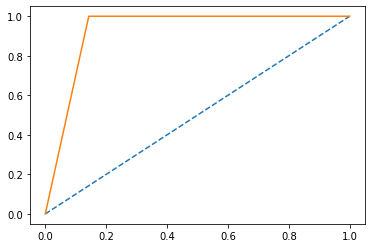

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')


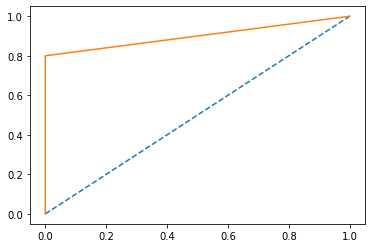

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')


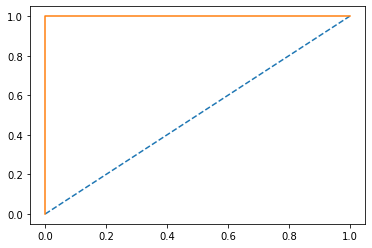

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')


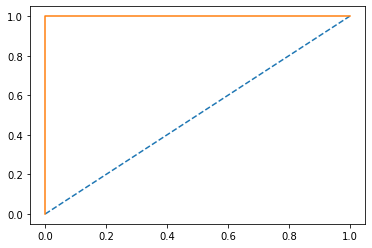

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')


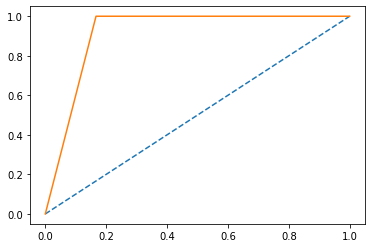

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')


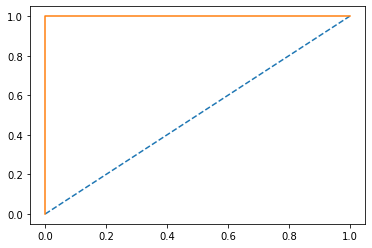

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1], device='cuda:0')


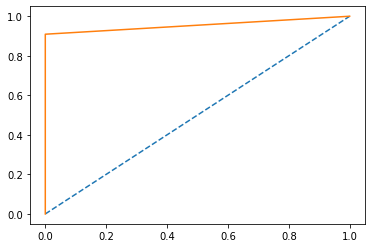

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


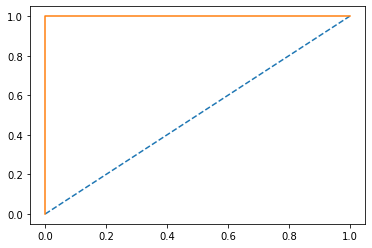

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')


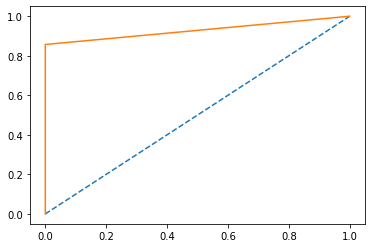

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')


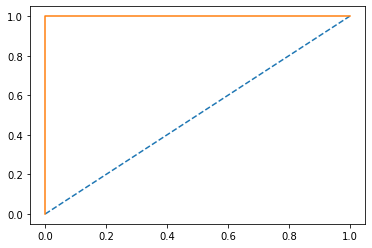

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


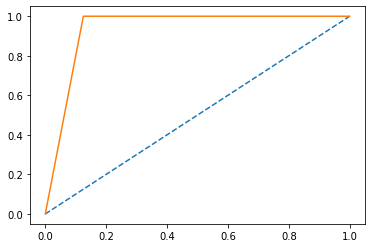

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')


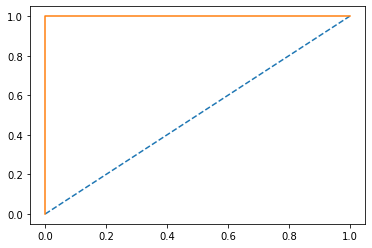

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')


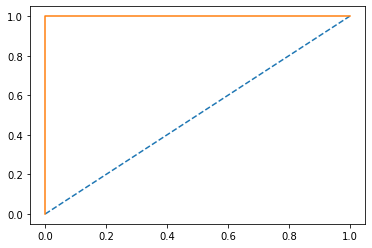

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')


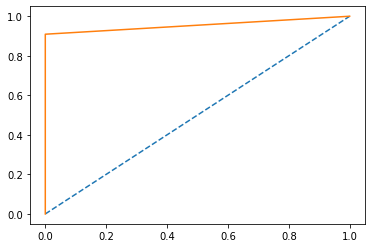

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')


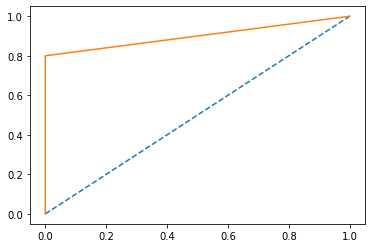

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')


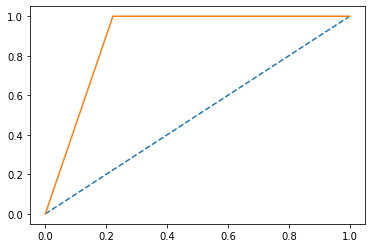

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')


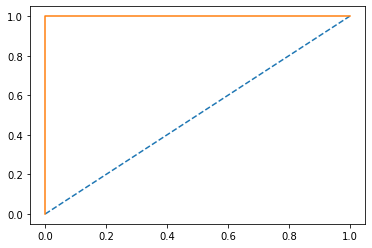

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


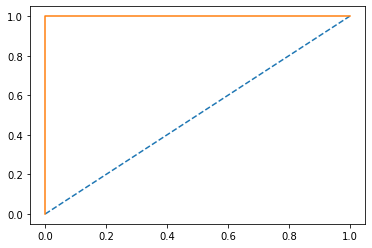

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')


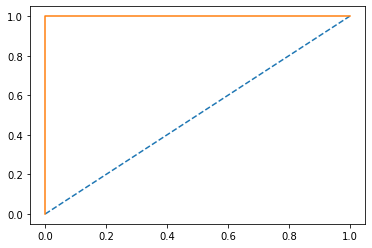

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')


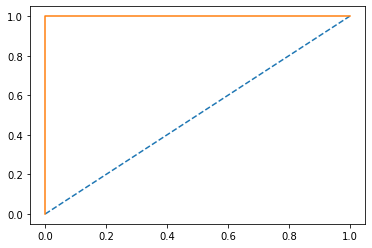

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')


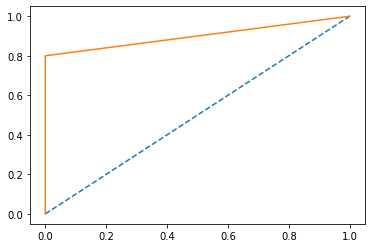

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')


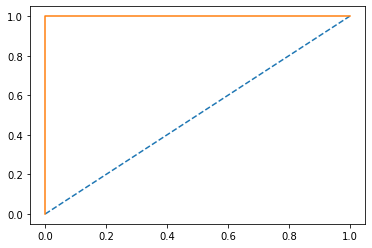

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


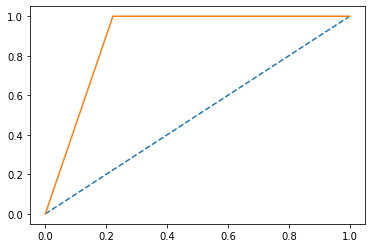

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1], device='cuda:0')


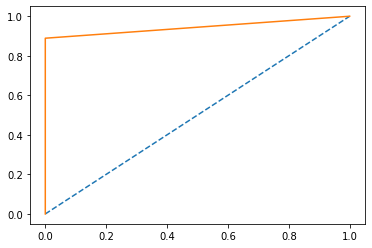

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')


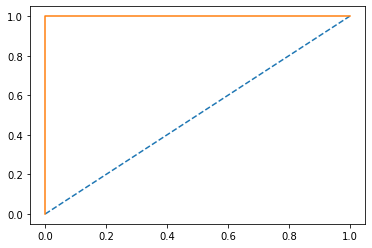

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')


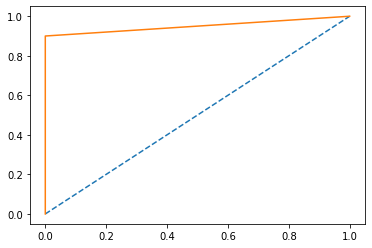

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


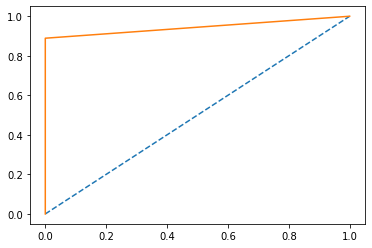

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')


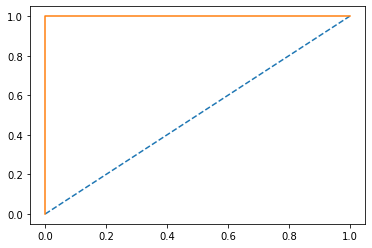

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')


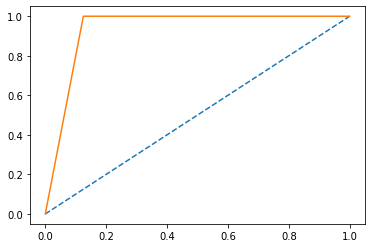

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')


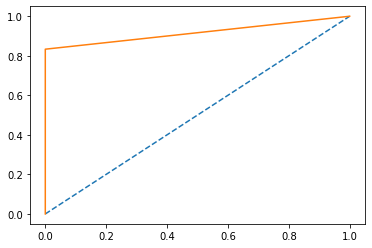

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


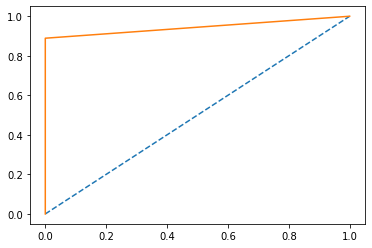

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')


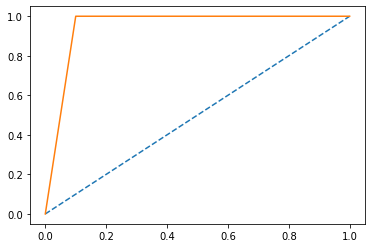

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')


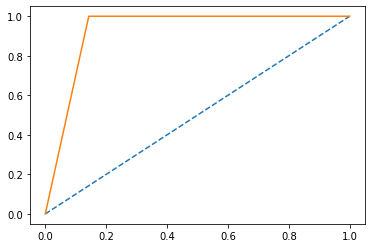

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')


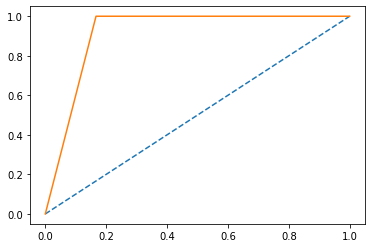

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')


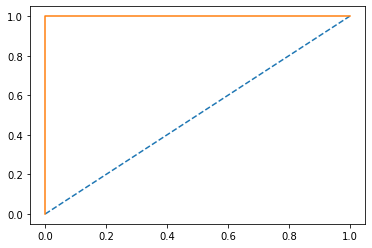

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


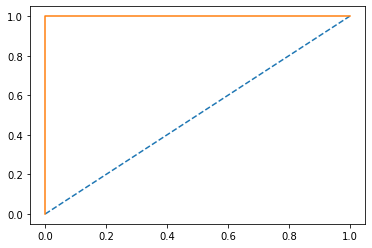

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')


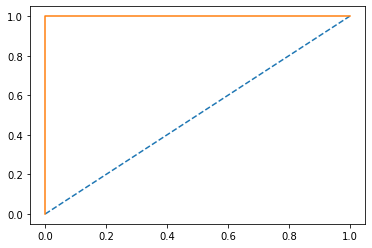

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')


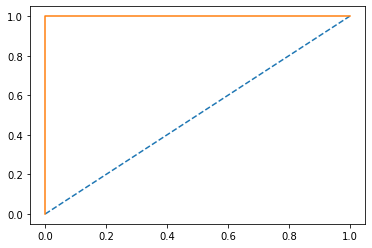

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')


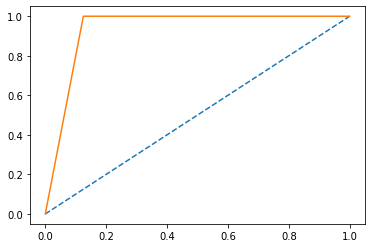

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')


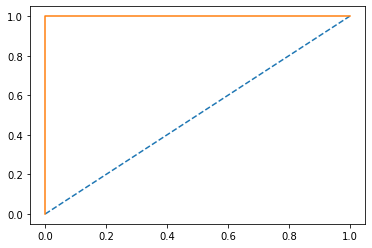

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')


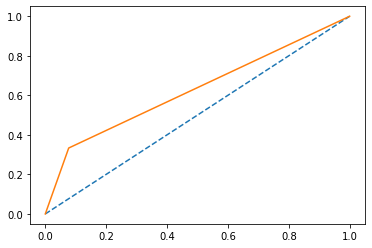

roc 0.6282051282051282
acc1 tensor(0.8125, device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')


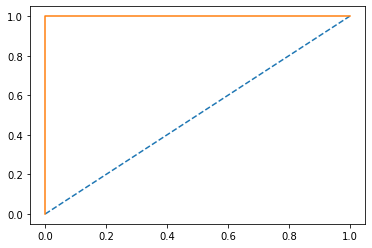

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')


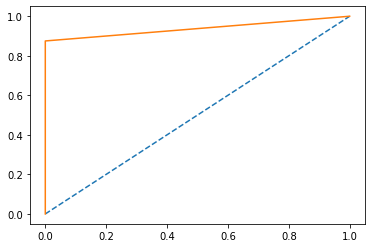

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')


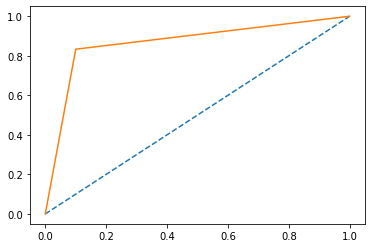

roc 0.8666666666666667
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')


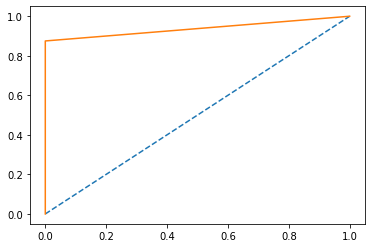

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


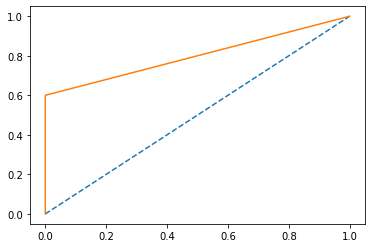

roc 0.8
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


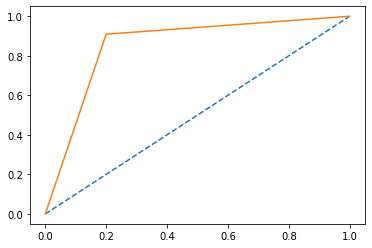

roc 0.8545454545454546
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')


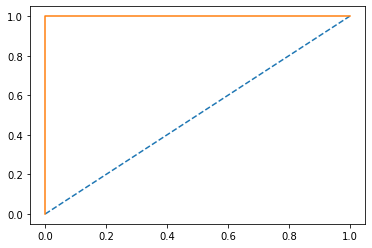

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')


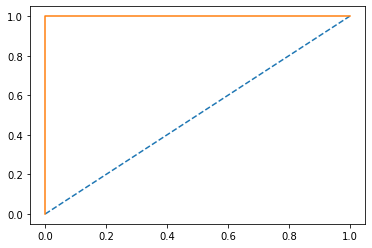

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')


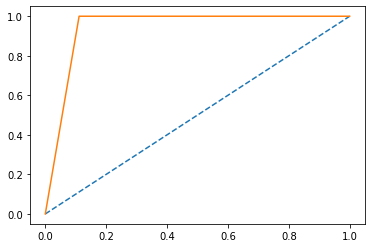

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')


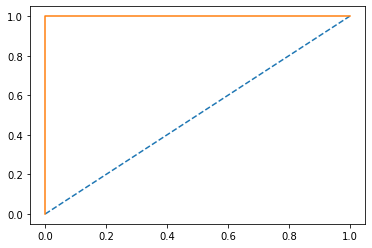

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')


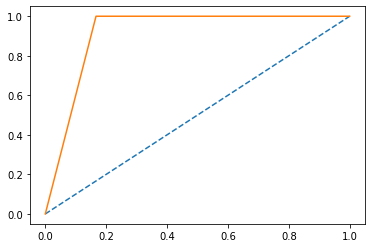

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')


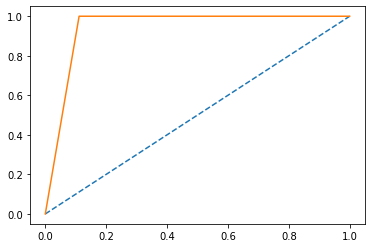

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')


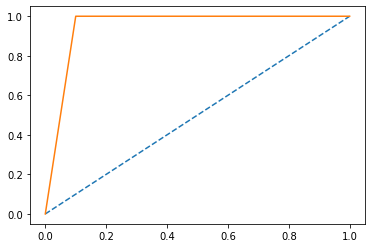

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')


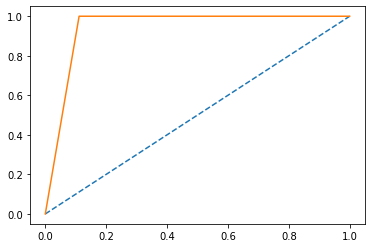

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')


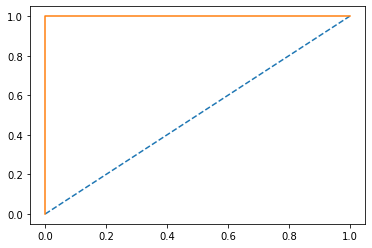

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')


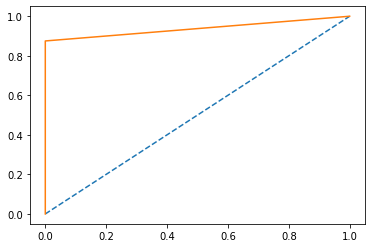

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')


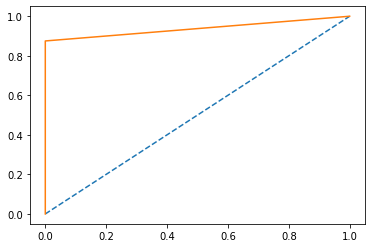

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')


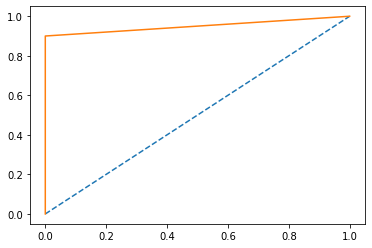

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')


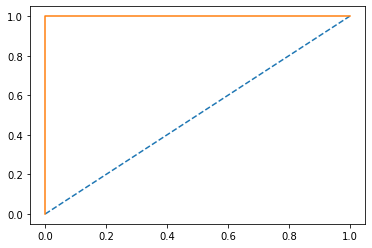

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')


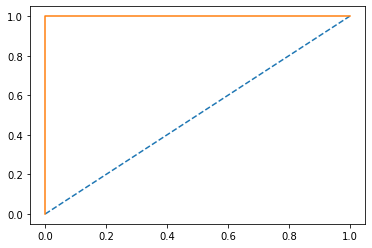

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')


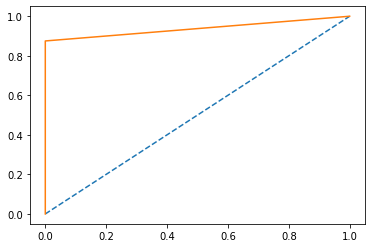

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')


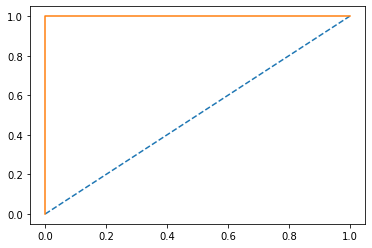

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


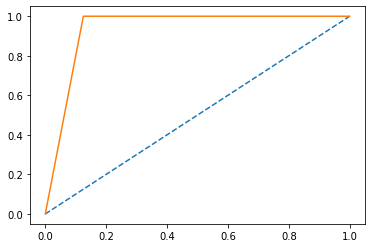

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')


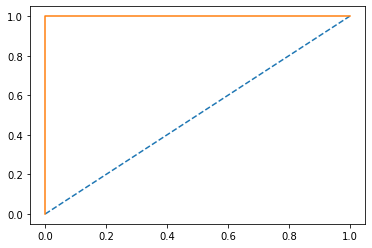

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


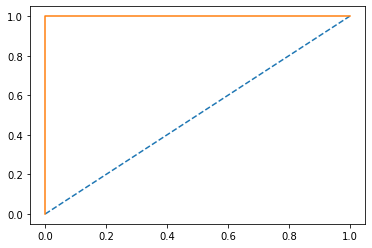

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')


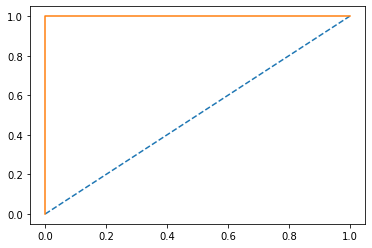

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')


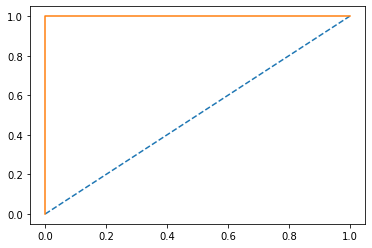

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')


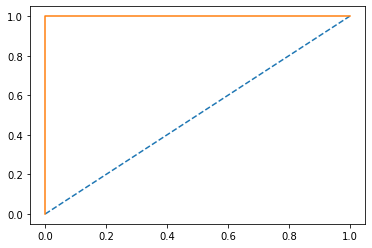

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1], device='cuda:0')


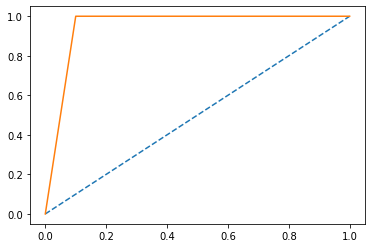

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')


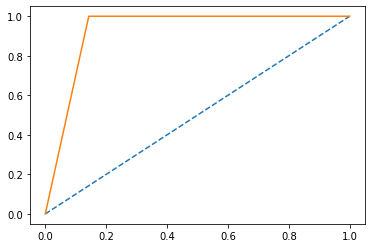

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')


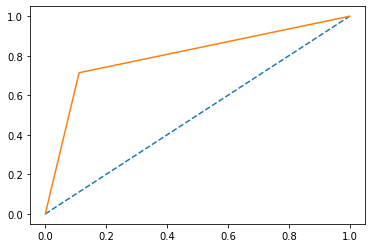

roc 0.8015873015873016
acc1 tensor(0.8125, device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1], device='cuda:0')


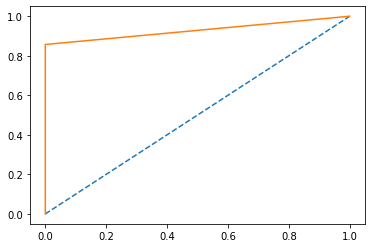

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


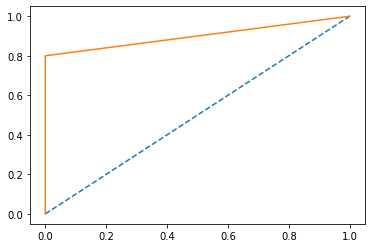

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')


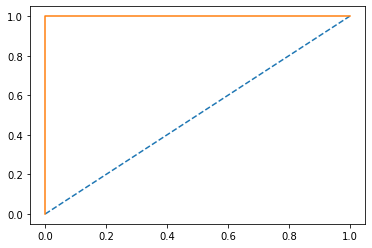

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')


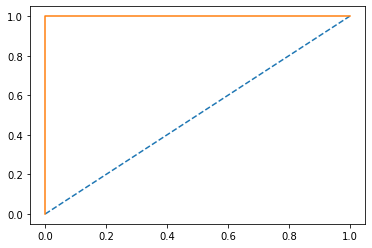

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')


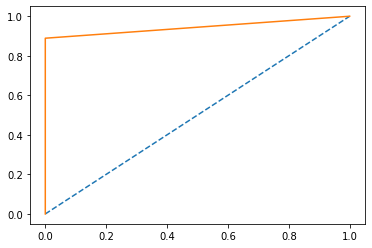

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')


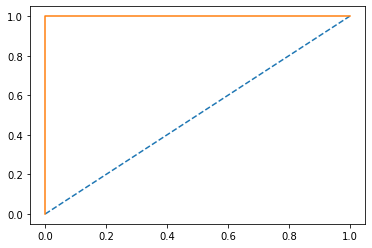

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')


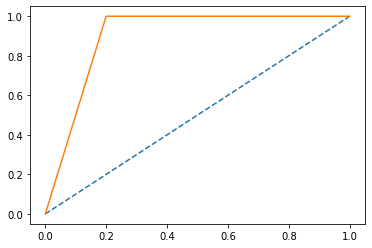

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')


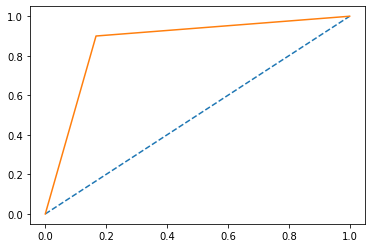

roc 0.8666666666666666
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0], device='cuda:0')


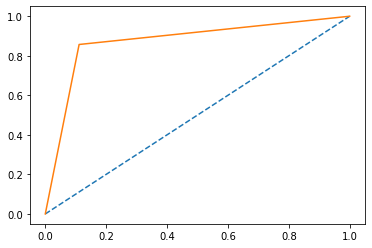

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


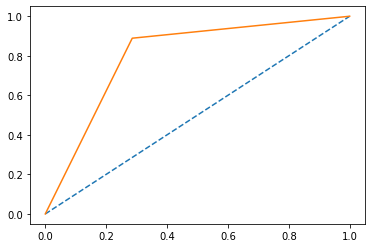

roc 0.8015873015873016
acc1 tensor(0.8125, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')


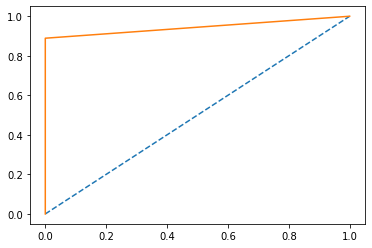

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')


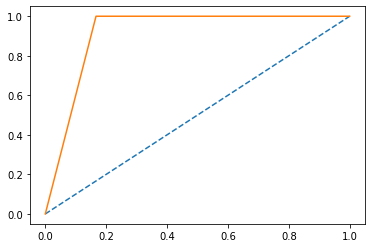

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')


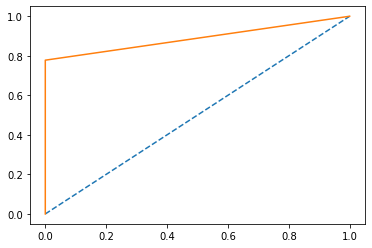

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')


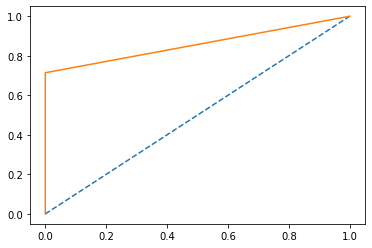

roc 0.8571428571428572
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')


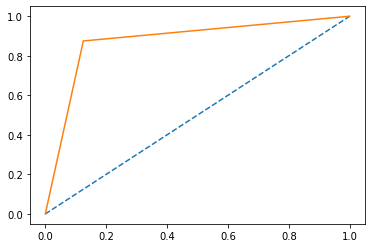

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')


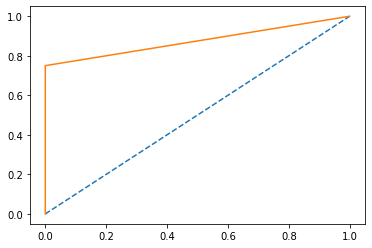

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')


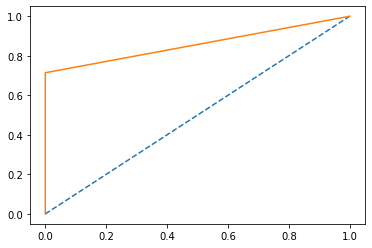

roc 0.8571428571428572
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')


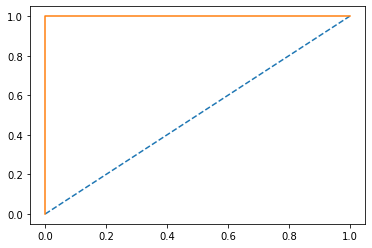

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')


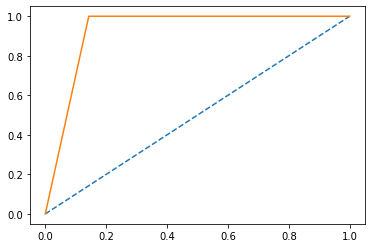

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')


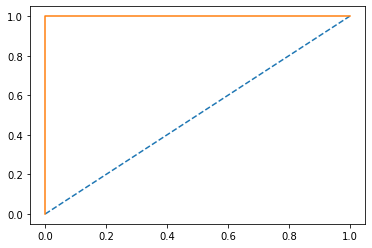

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0], device='cuda:0')


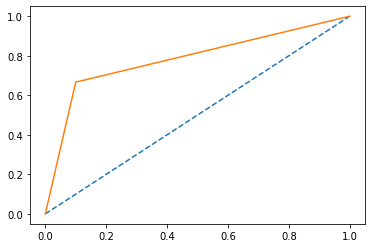

roc 0.7833333333333333
acc1 tensor(0.8125, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')


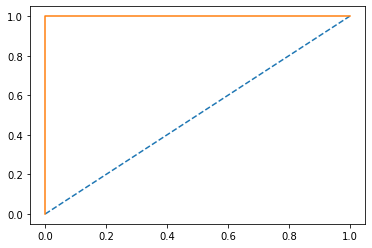

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


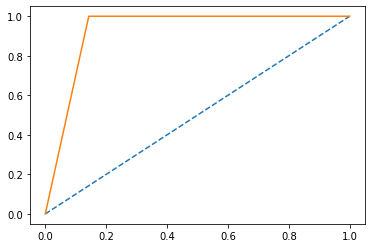

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')


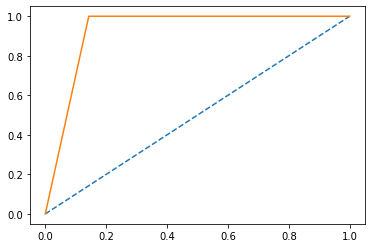

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')


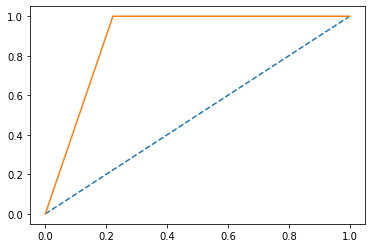

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')


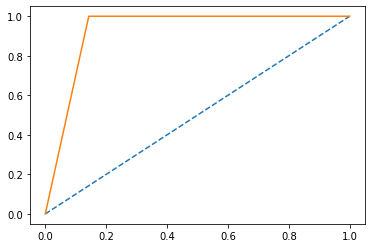

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')


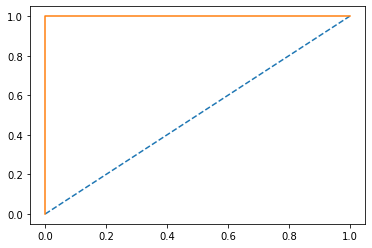

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


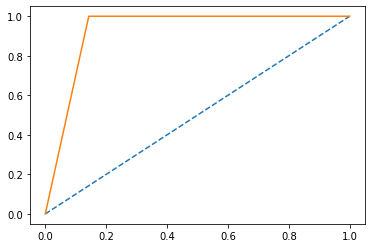

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')


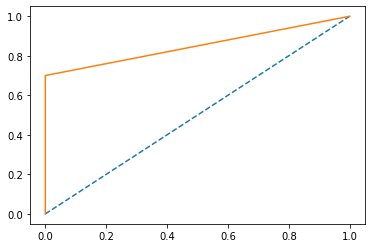

roc 0.85
acc1 tensor(0.8125, device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')


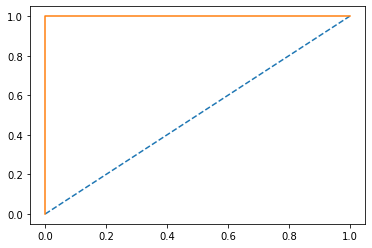

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0], device='cuda:0')


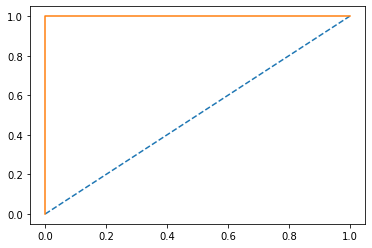

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')


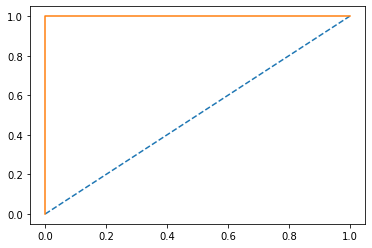

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')


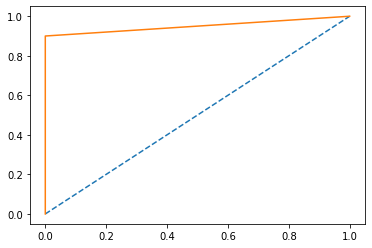

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')


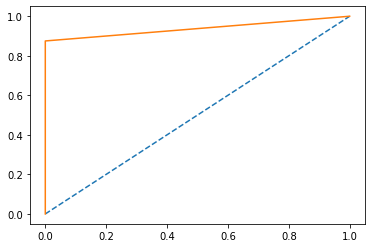

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')


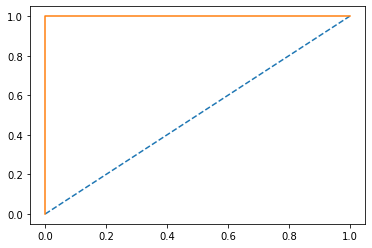

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')


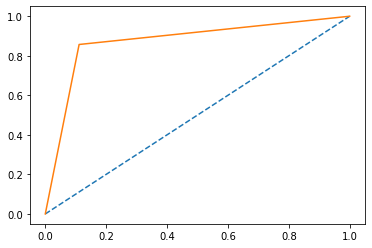

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')


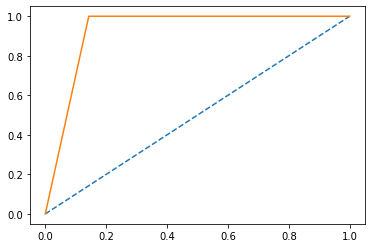

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')


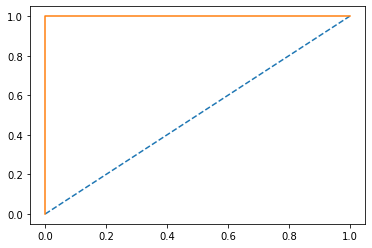

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')


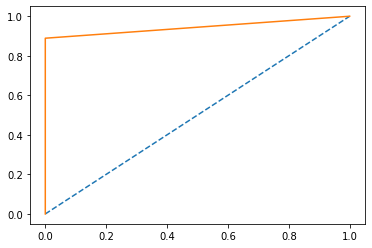

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')


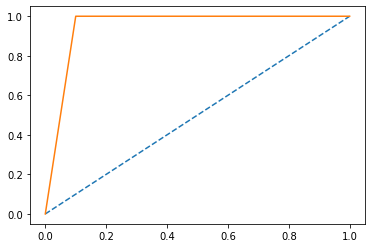

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')


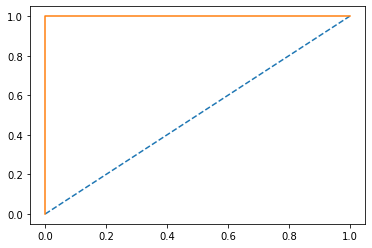

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')


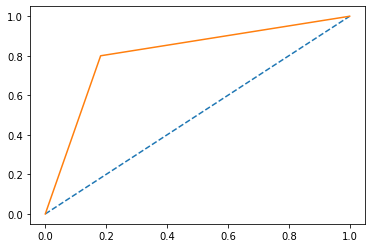

roc 0.8090909090909091
acc1 tensor(0.8125, device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')


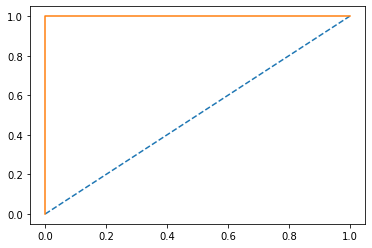

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')


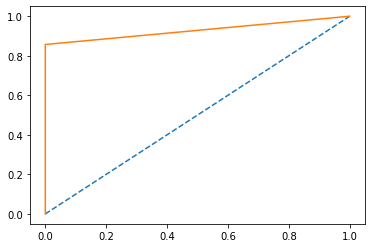

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


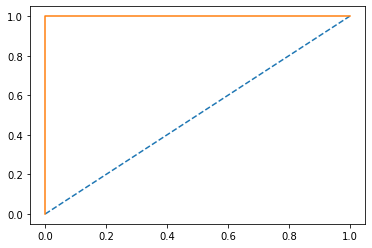

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')


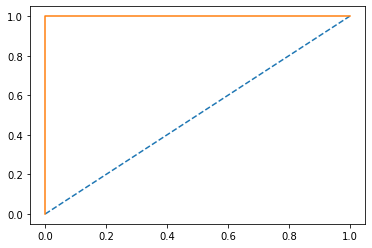

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')


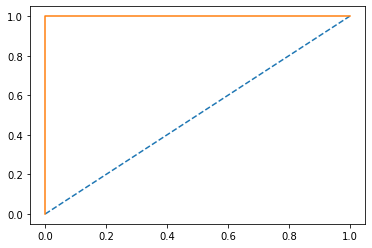

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


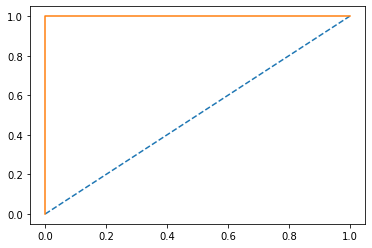

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')


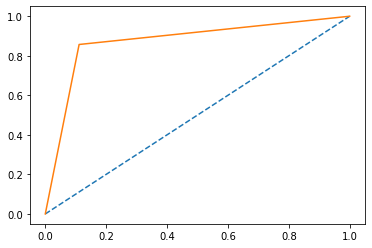

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


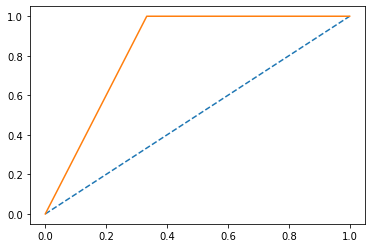

roc 0.8333333333333334
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')


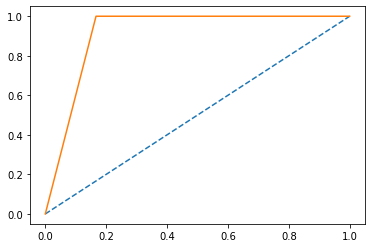

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')


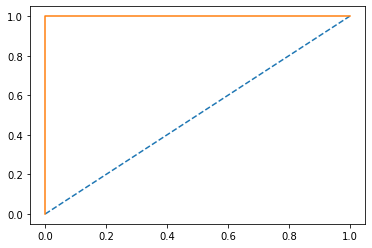

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')


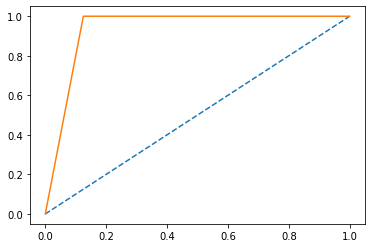

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')


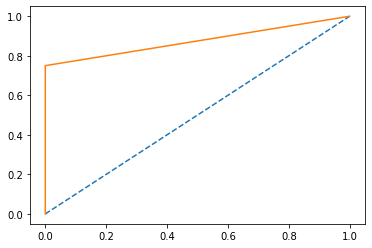

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')


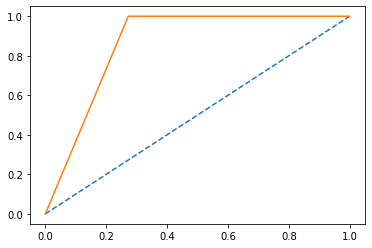

roc 0.8636363636363636
acc1 tensor(0.8125, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')


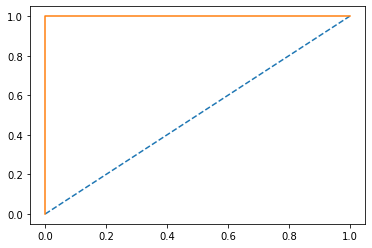

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')


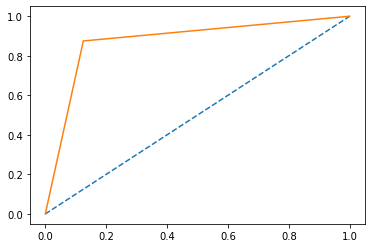

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')


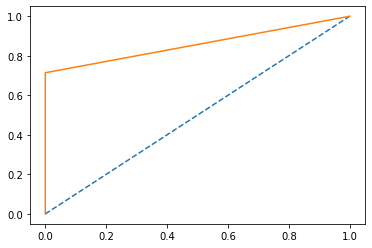

roc 0.8571428571428572
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


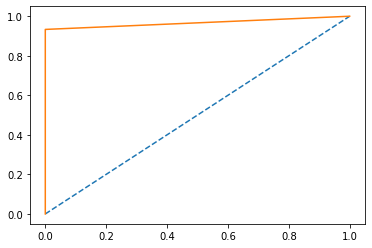

roc 0.9666666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')


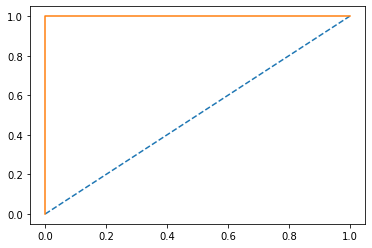

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')


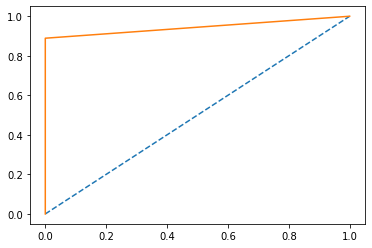

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')


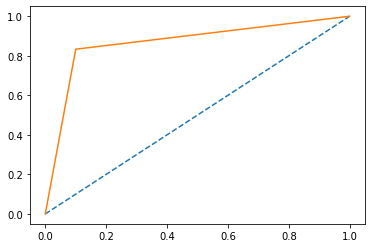

roc 0.8666666666666667
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')


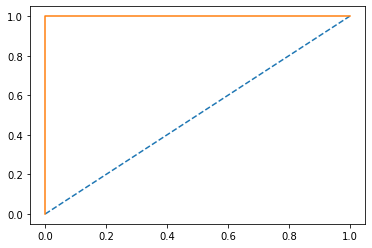

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')


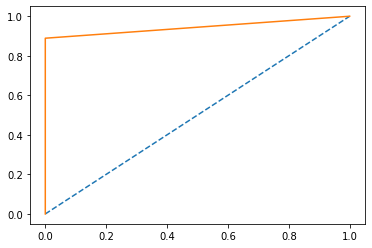

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')


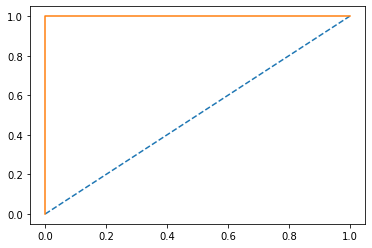

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')


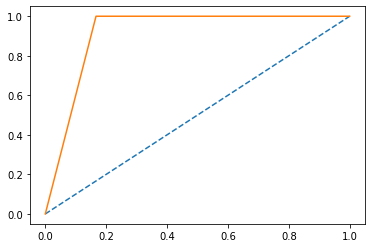

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')


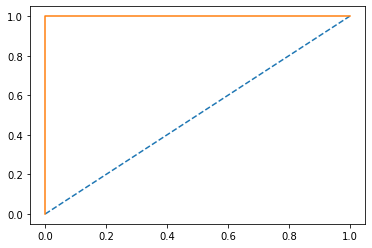

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')


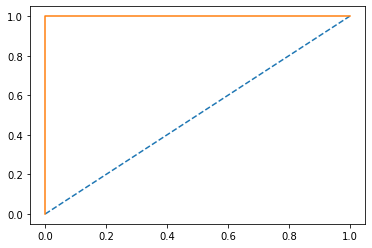

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')


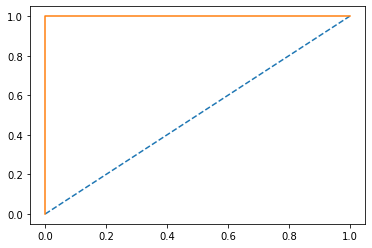

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')


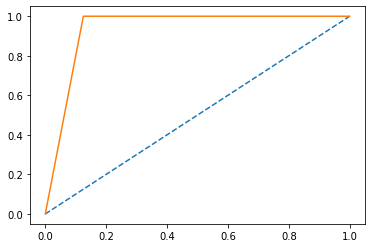

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')


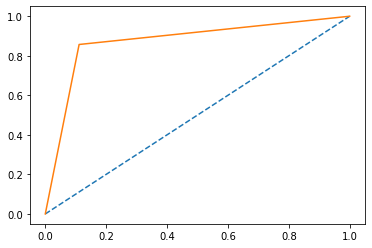

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


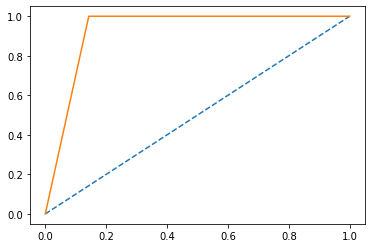

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')


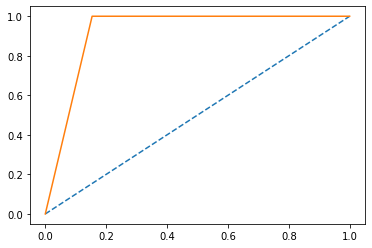

roc 0.9230769230769231
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


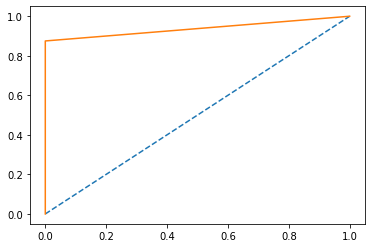

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')


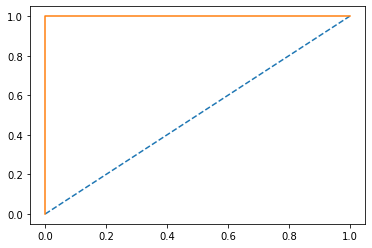

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')


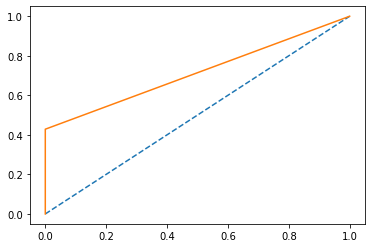

roc 0.7142857142857143
acc1 tensor(0.7500, device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')


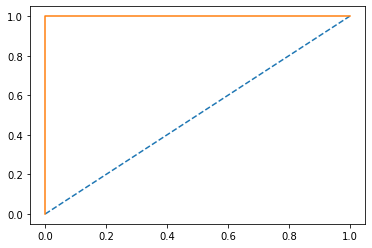

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')


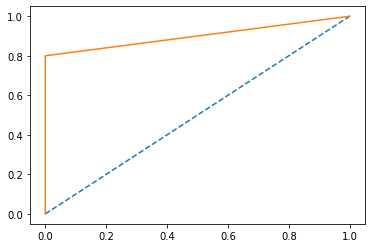

roc 0.9
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')


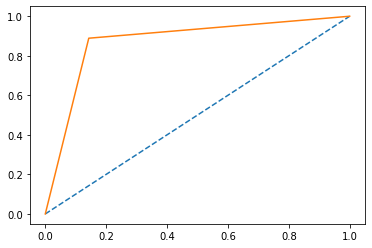

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


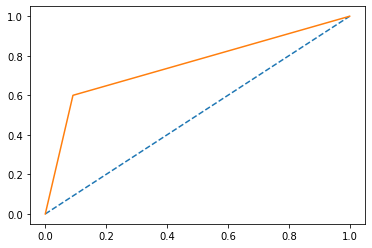

roc 0.7545454545454545
acc1 tensor(0.8125, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


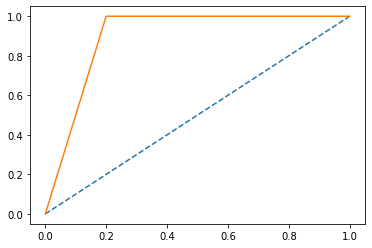

roc 0.9
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')


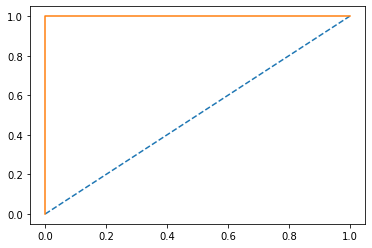

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')


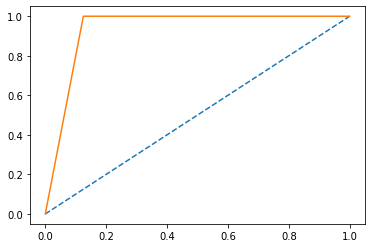

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')


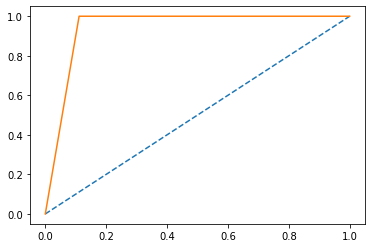

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')


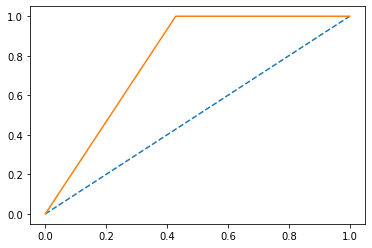

roc 0.7857142857142857
acc1 tensor(0.8125, device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')


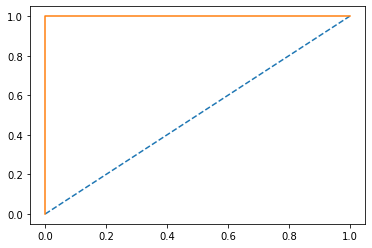

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')


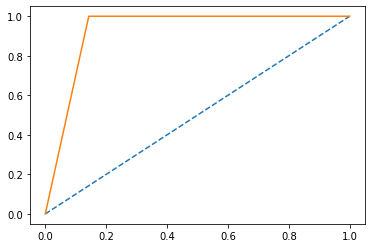

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')


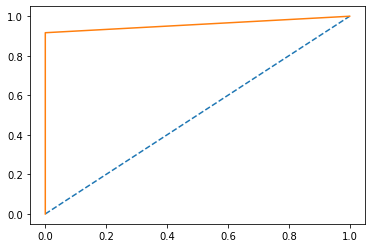

roc 0.9583333333333333
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')


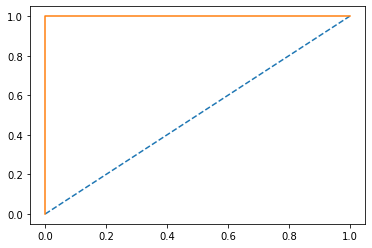

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')


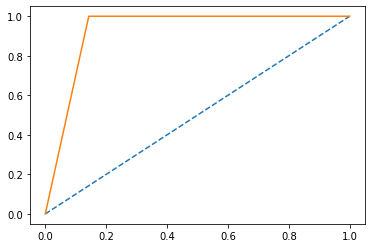

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')


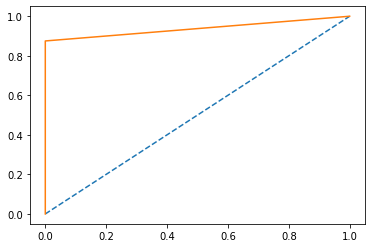

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')


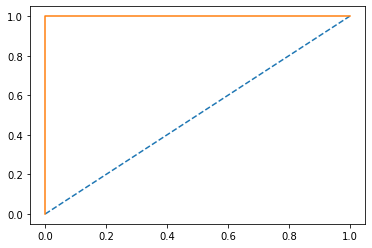

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')


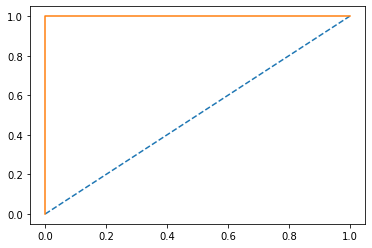

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


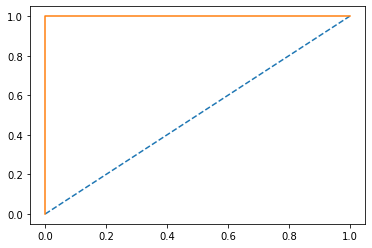

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')


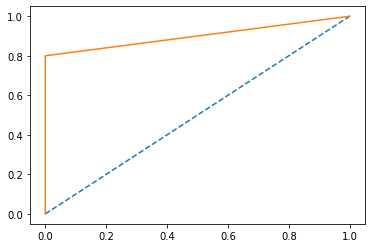

roc 0.9
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')


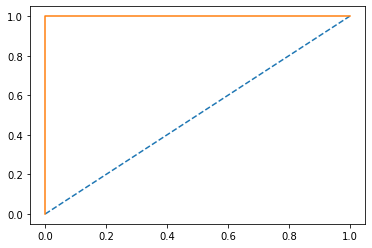

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')


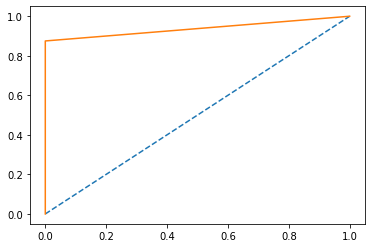

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


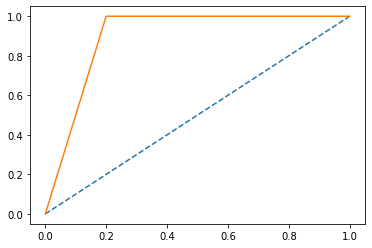

roc 0.9
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


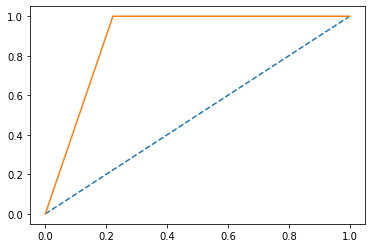

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


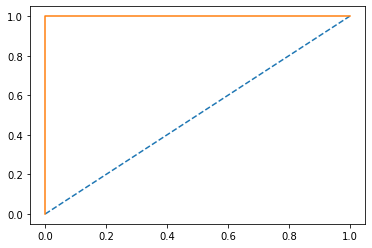

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')


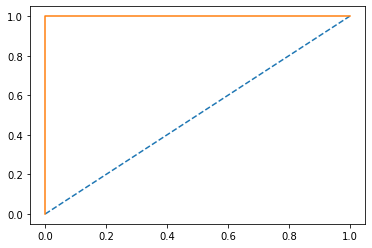

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')


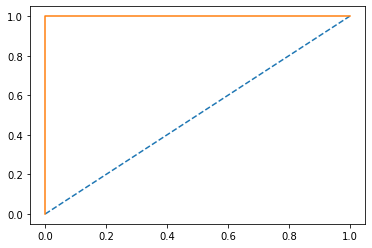

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')


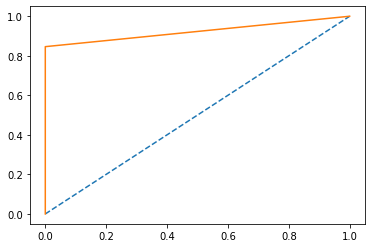

roc 0.9230769230769231
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')


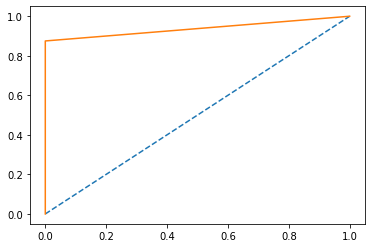

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


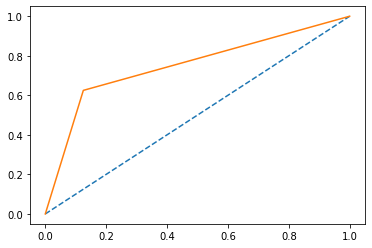

roc 0.75
acc1 tensor(0.7500, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')


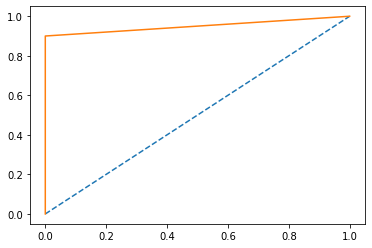

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')


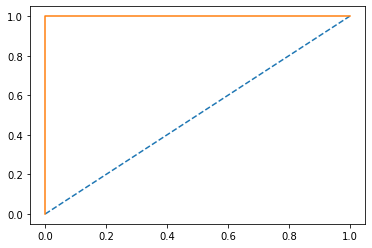

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')


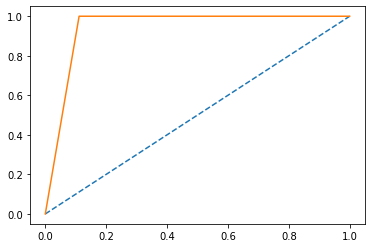

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')


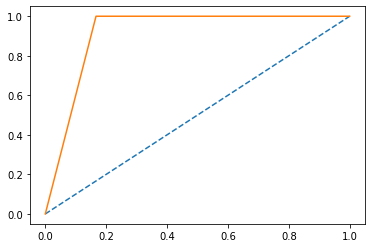

roc 0.9166666666666667
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')


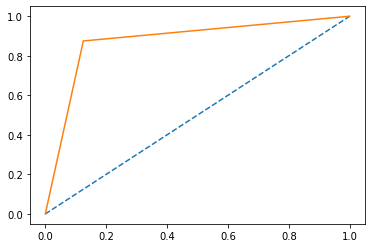

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')


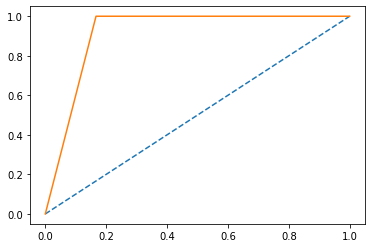

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')


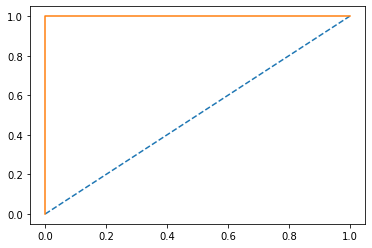

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')


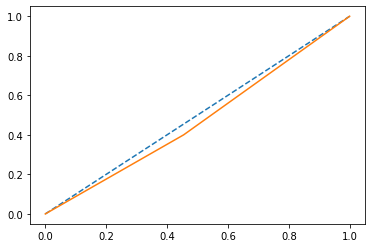

roc 0.47272727272727266
pred tensor([1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')


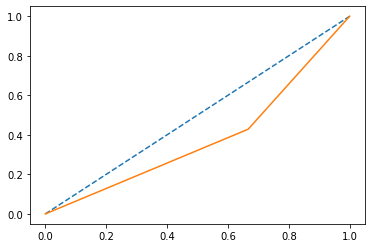

roc 0.380952380952381
pred tensor([1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')


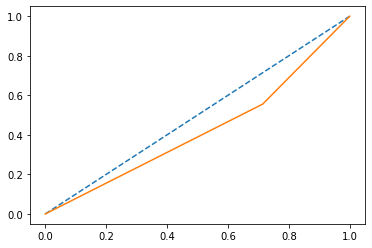

roc 0.42063492063492064
pred tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')


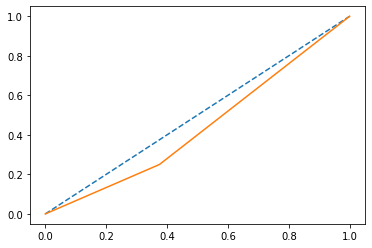

roc 0.4375
pred tensor([0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')


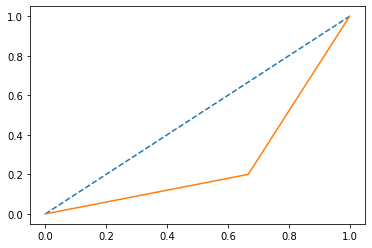

roc 0.26666666666666666
pred tensor([0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')


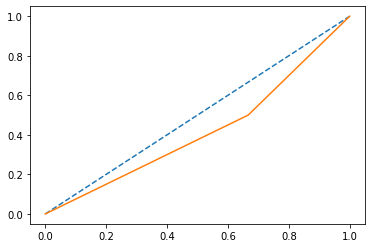

roc 0.41666666666666663
pred tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


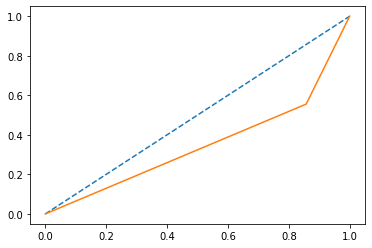

roc 0.34920634920634924
pred tensor([0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')


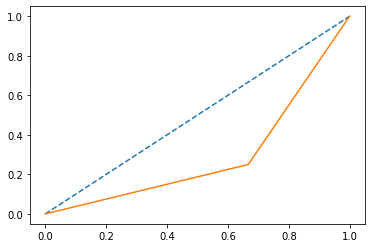

roc 0.2916666666666667
pred tensor([0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')


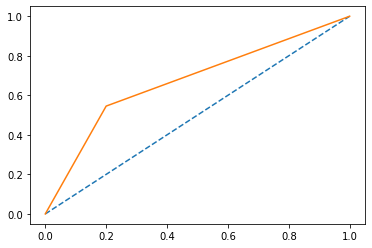

roc 0.6727272727272727
pred tensor([1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')


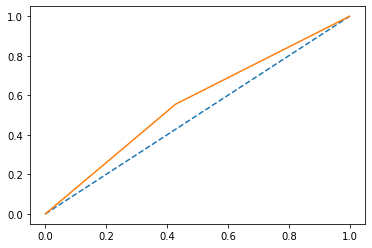

roc 0.5634920634920635
pred tensor([1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')


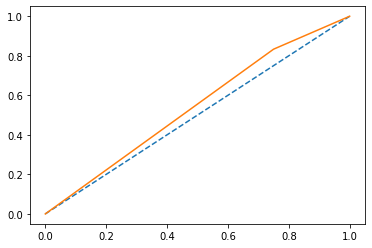

roc 0.5416666666666667
pred tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


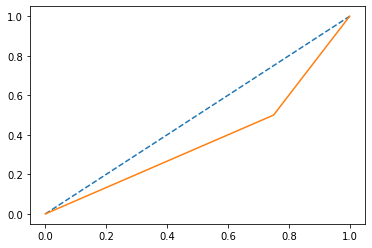

roc 0.375
pred tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')


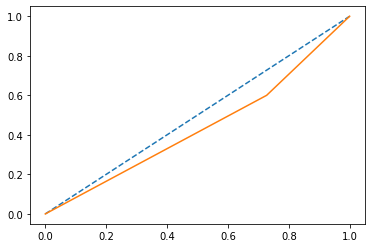

roc 0.43636363636363634
pred tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')


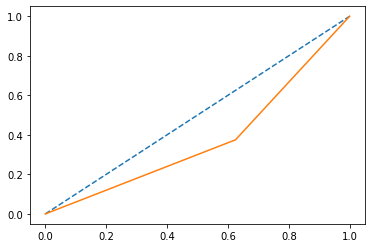

roc 0.375
pred tensor([1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


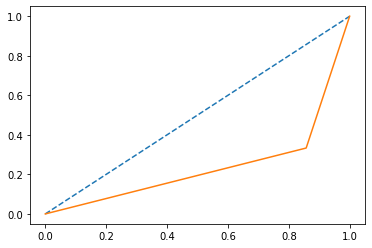

roc 0.2380952380952381
pred tensor([1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


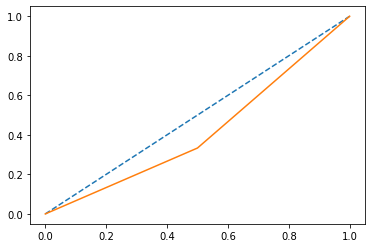

roc 0.41666666666666663
pred tensor([1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')


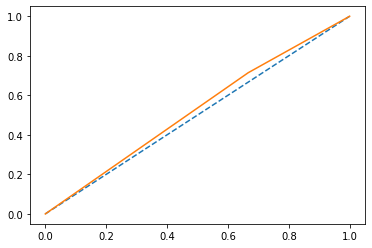

roc 0.5238095238095238
pred tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


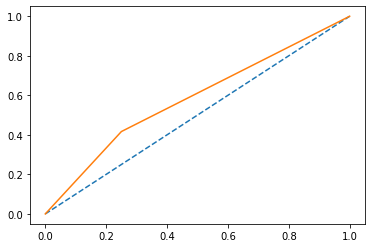

roc 0.5833333333333334
pred tensor([1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')


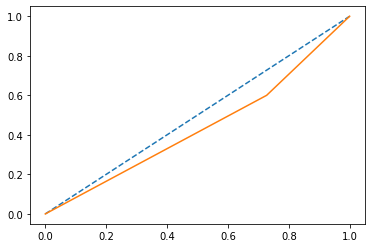

roc 0.43636363636363634
pred tensor([1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')


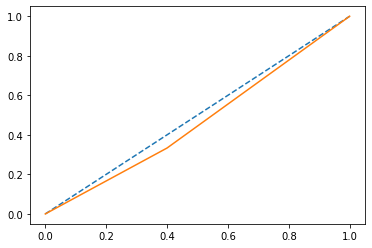

roc 0.4666666666666666
pred tensor([0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


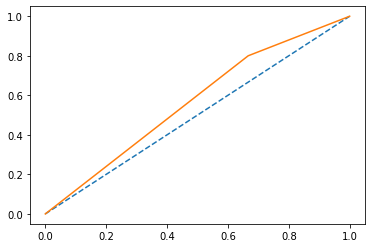

roc 0.5666666666666667
pred tensor([0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')


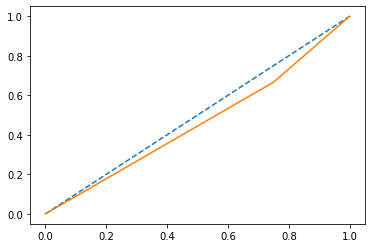

roc 0.4583333333333333
pred tensor([1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')


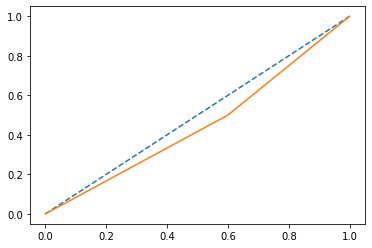

roc 0.45000000000000007
pred tensor([1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


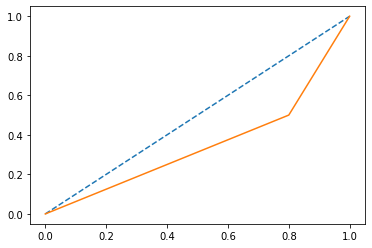

roc 0.35
pred tensor([1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')


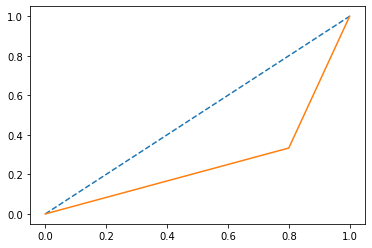

roc 0.2666666666666666
pred tensor([1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')


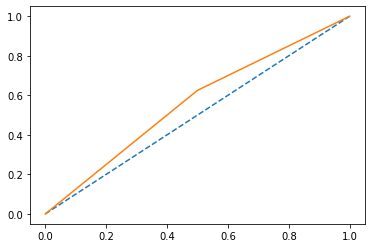

roc 0.5625
pred tensor([0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


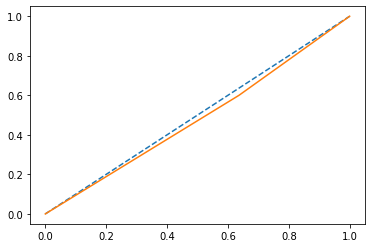

roc 0.4818181818181818
pred tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')


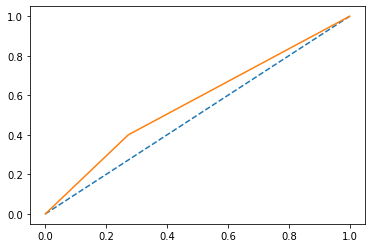

roc 0.5636363636363636
pred tensor([1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')


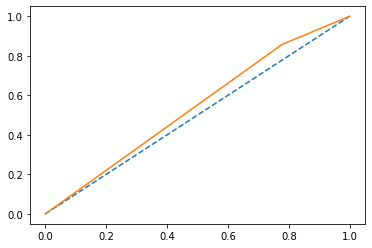

roc 0.5396825396825397
pred tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1], device='cuda:0')


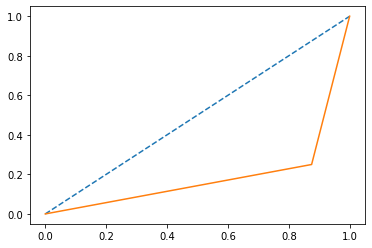

roc 0.1875
pred tensor([1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')


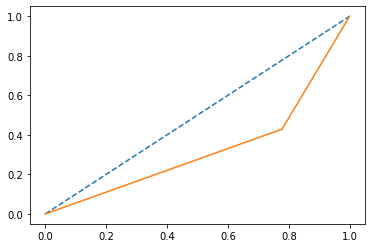

roc 0.32539682539682535
pred tensor([1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')


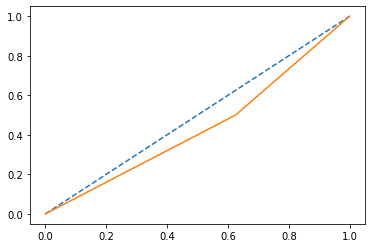

roc 0.4375
pred tensor([0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')


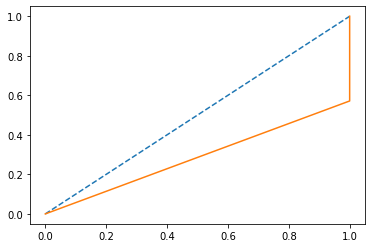

roc 0.2857142857142857
pred tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')


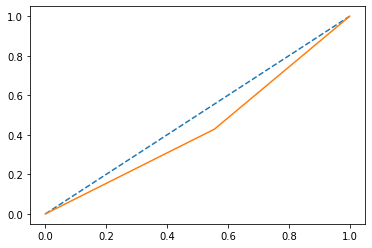

roc 0.4365079365079365
pred tensor([0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')


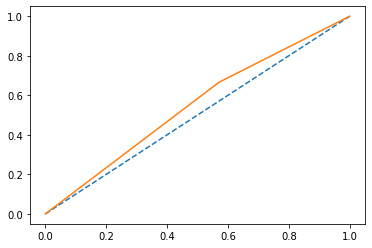

roc 0.5476190476190477
pred tensor([1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')


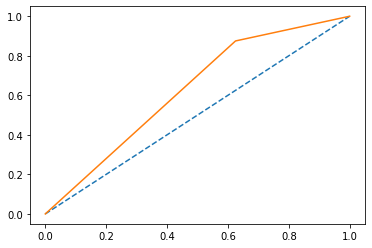

roc 0.625
pred tensor([0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


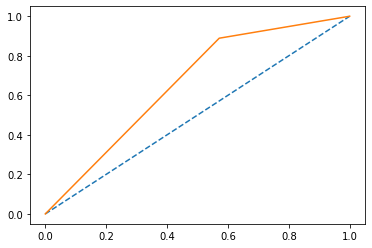

roc 0.6587301587301587
pred tensor([1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')


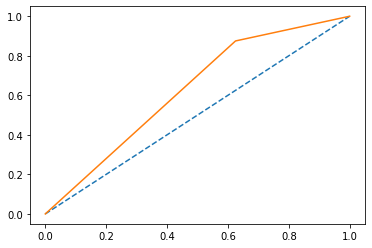

roc 0.625
pred tensor([0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')


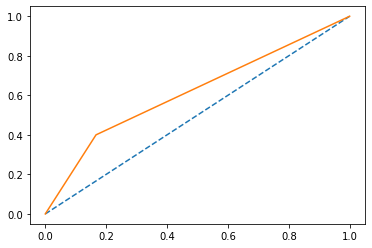

roc 0.6166666666666667
pred tensor([1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')


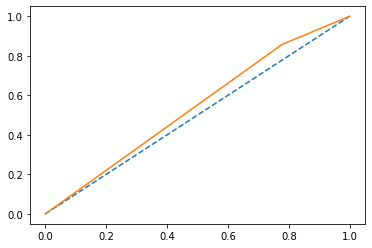

roc 0.5396825396825397
pred tensor([0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')


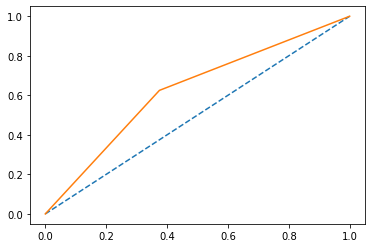

roc 0.625
pred tensor([1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')


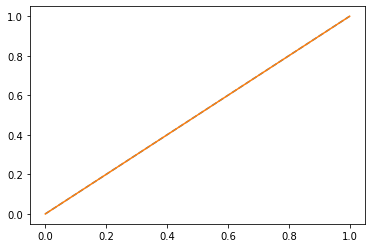

roc 0.5
pred tensor([0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')


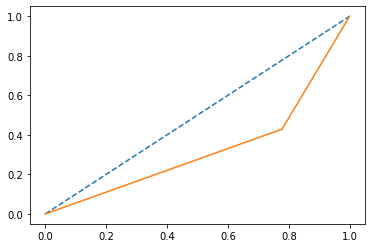

roc 0.32539682539682535
pred tensor([0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1], device='cuda:0')


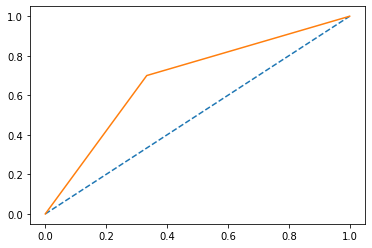

roc 0.6833333333333335
pred tensor([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')


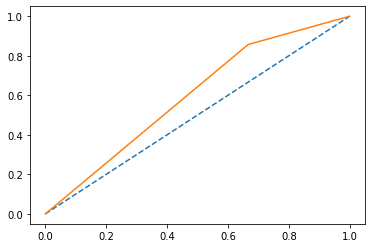

roc 0.5952380952380953
pred tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')


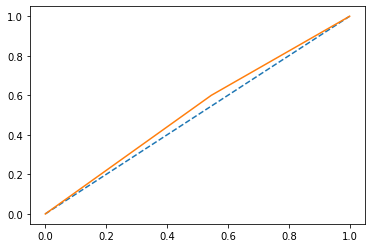

roc 0.5272727272727273
pred tensor([1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')


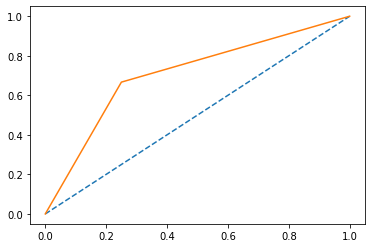

roc 0.7083333333333334
pred tensor([0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')


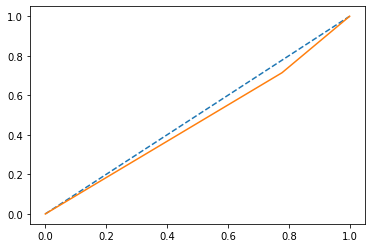

roc 0.46825396825396826
pred tensor([1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')


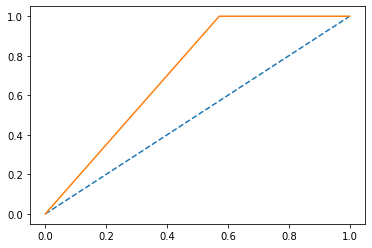

roc 0.7142857142857143
pred tensor([0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')


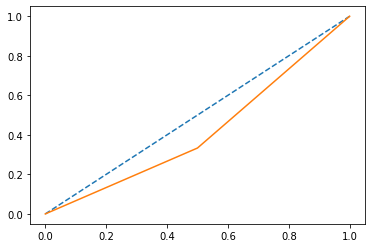

roc 0.41666666666666663
pred tensor([1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')


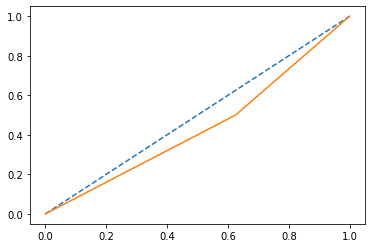

roc 0.4375
pred tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')


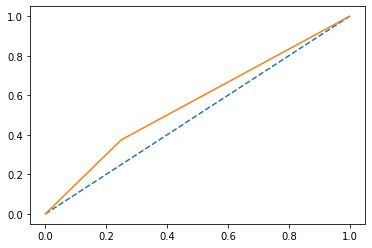

roc 0.5625
pred tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')


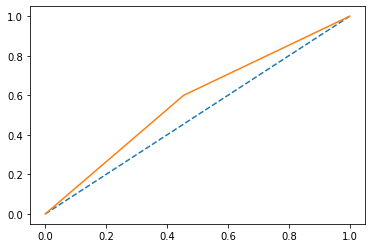

roc 0.5727272727272728
pred tensor([1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')


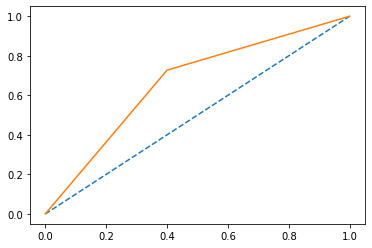

roc 0.6636363636363637
pred tensor([1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')


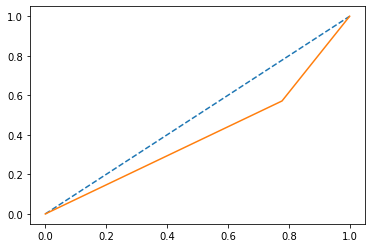

roc 0.3968253968253968
pred tensor([0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')


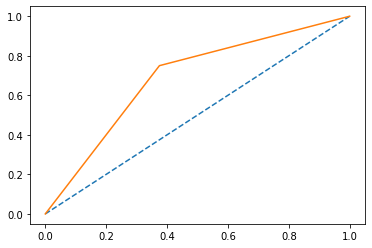

roc 0.6875
pred tensor([0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')


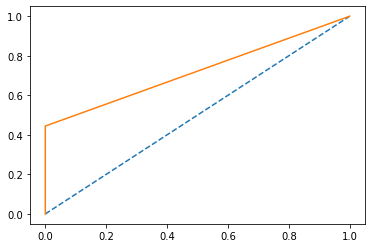

roc 0.7222222222222222
pred tensor([1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


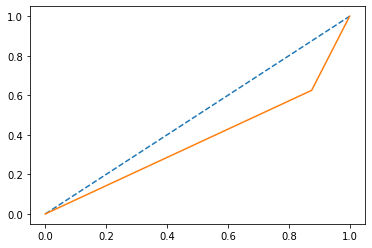

roc 0.375
pred tensor([1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')


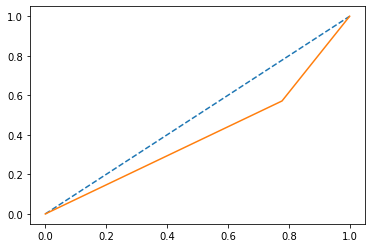

roc 0.3968253968253968
pred tensor([1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')


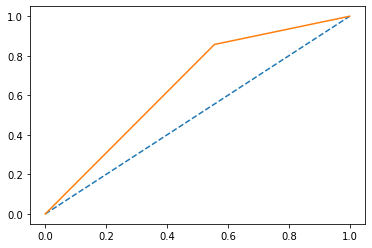

roc 0.6507936507936507
pred tensor([0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


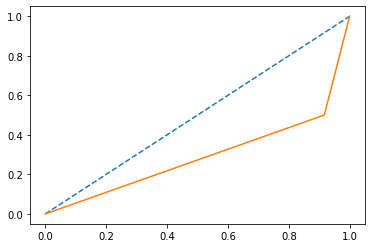

roc 0.2916666666666667
pred tensor([0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


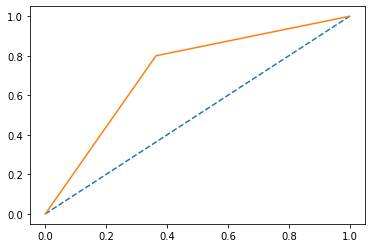

roc 0.7181818181818183
pred tensor([1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


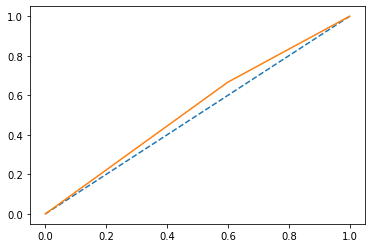

roc 0.5333333333333333
pred tensor([1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')


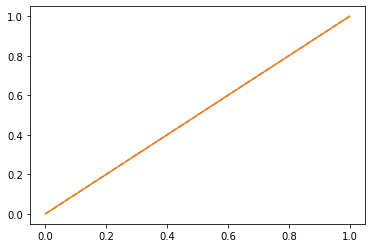

roc 0.5
pred tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


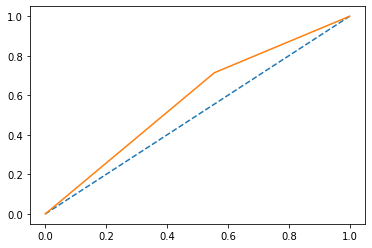

roc 0.5793650793650794
pred tensor([1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')


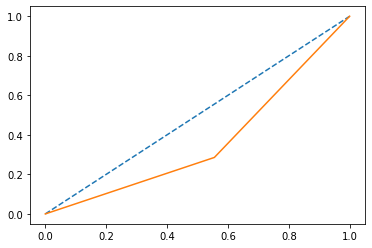

roc 0.365079365079365
pred tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')


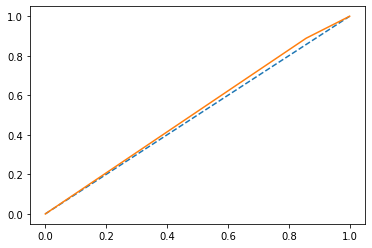

roc 0.5158730158730159
pred tensor([0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1], device='cuda:0')


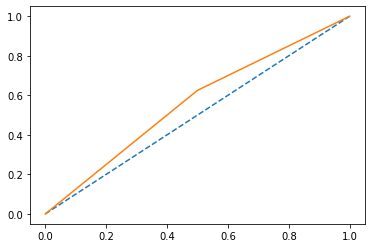

roc 0.5625
pred tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')


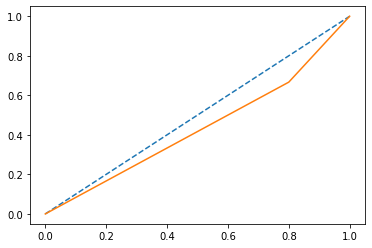

roc 0.43333333333333324
pred tensor([1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1], device='cuda:0')


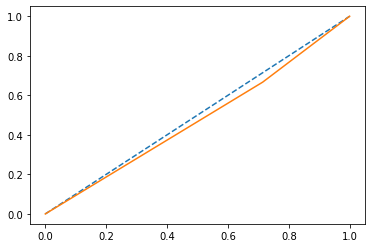

roc 0.47619047619047616
pred tensor([0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0], device='cuda:0')


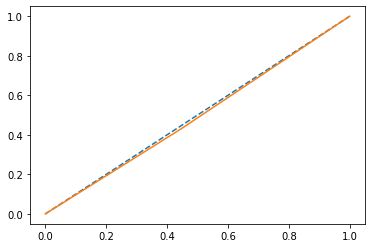

roc 0.4920634920634921
pred tensor([1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')


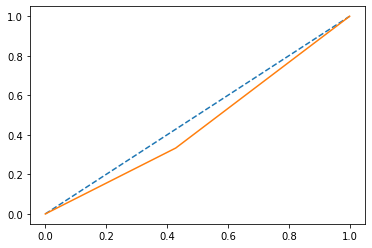

roc 0.45238095238095233
pred tensor([1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')


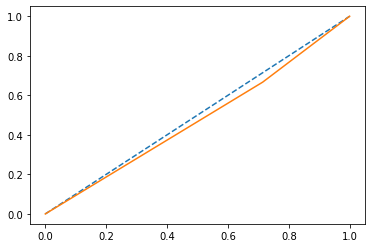

roc 0.47619047619047616
pred tensor([1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')


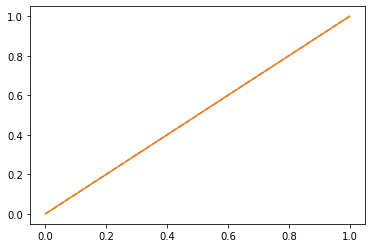

roc 0.5
pred tensor([0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')


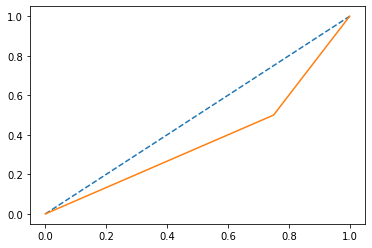

roc 0.375
pred tensor([0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')


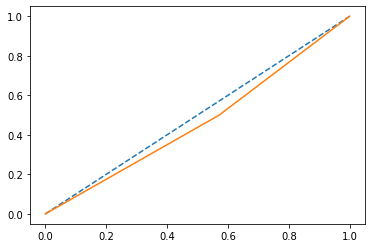

roc 0.4642857142857143
pred tensor([0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')


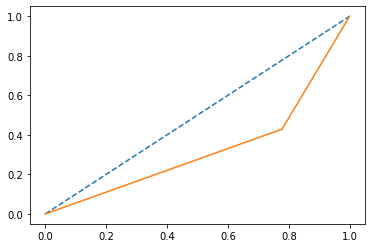

roc 0.32539682539682535
pred tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')


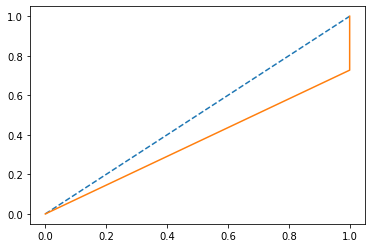

roc 0.36363636363636365
pred tensor([1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')


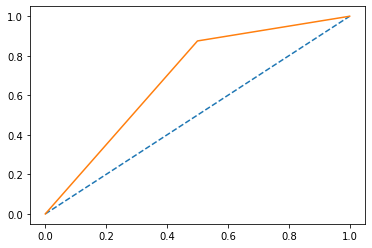

roc 0.6875
pred tensor([0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')


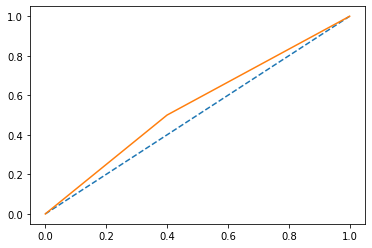

roc 0.5499999999999999
pred tensor([1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')


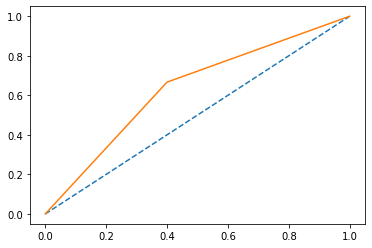

roc 0.6333333333333333
pred tensor([0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')


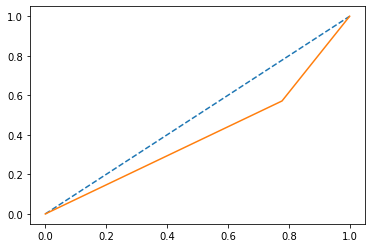

roc 0.3968253968253968
pred tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')


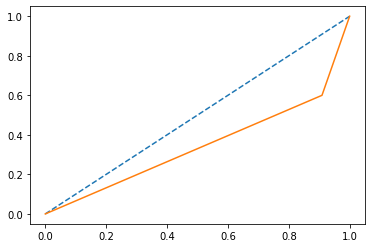

roc 0.34545454545454546
pred tensor([1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


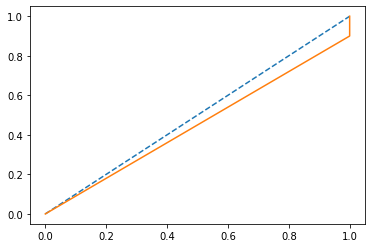

roc 0.45
pred tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')


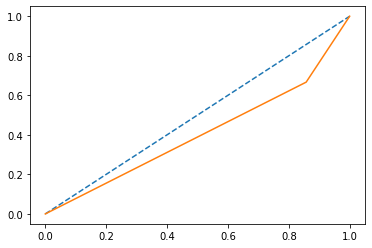

roc 0.40476190476190477
pred tensor([0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')


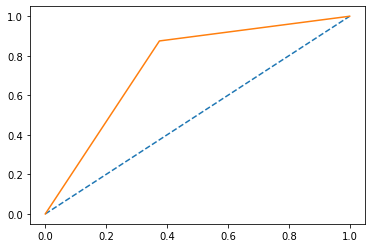

roc 0.75
pred tensor([1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')


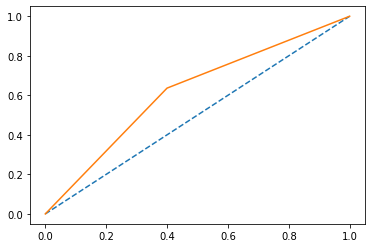

roc 0.6181818181818182
pred tensor([0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


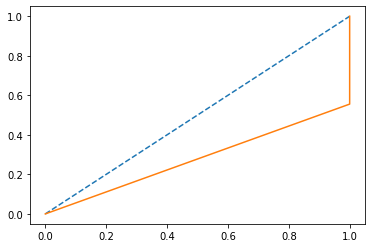

roc 0.2777777777777778
pred tensor([1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


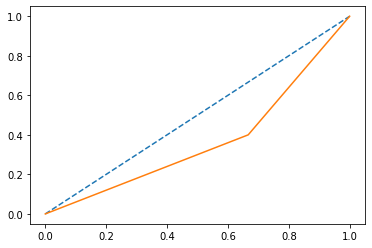

roc 0.3666666666666667
pred tensor([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


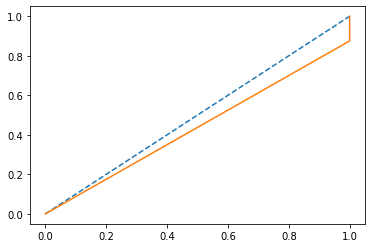

roc 0.4375
pred tensor([1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')


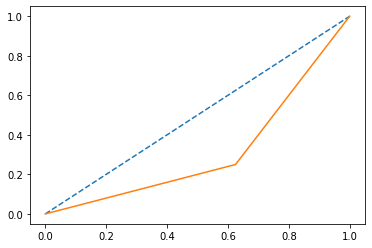

roc 0.3125
pred tensor([1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')


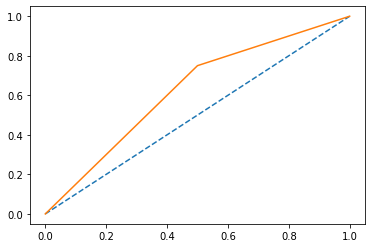

roc 0.625
pred tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')


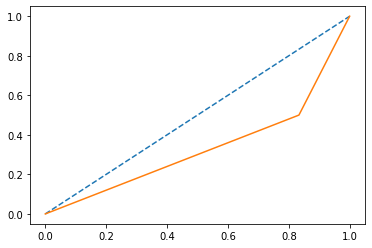

roc 0.3333333333333333
pred tensor([1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')


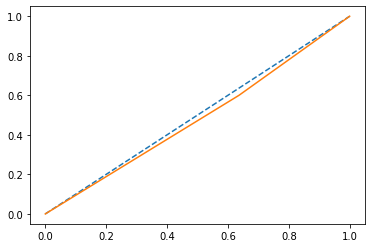

roc 0.4818181818181818
pred tensor([1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


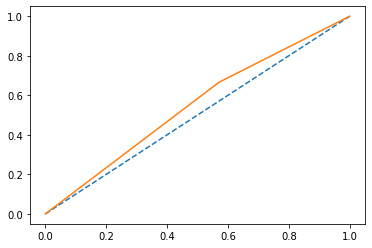

roc 0.5476190476190477
pred tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')


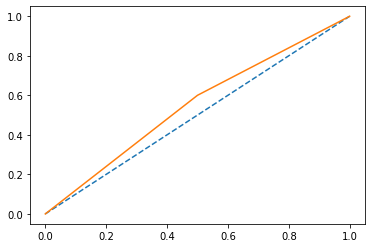

roc 0.55
pred tensor([0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')


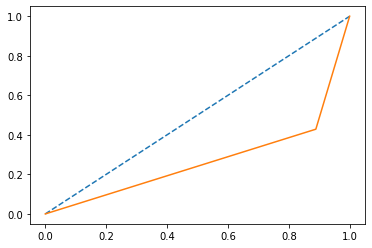

roc 0.2698412698412699
pred tensor([1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')


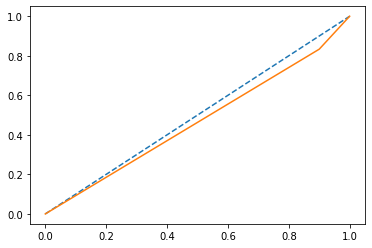

roc 0.4666666666666667
pred tensor([1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


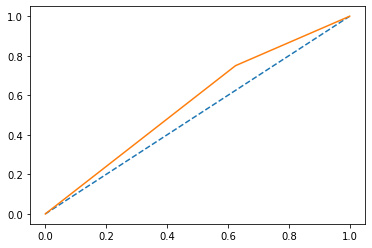

roc 0.5625
pred tensor([1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')


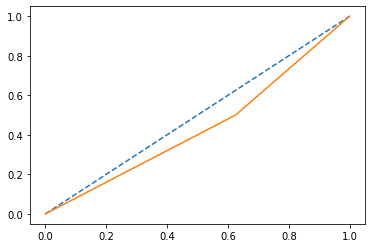

roc 0.4375
pred tensor([1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


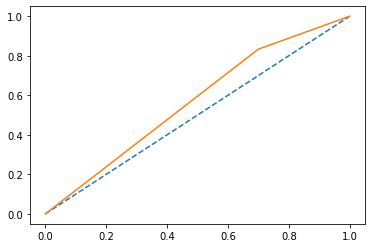

roc 0.5666666666666668
pred tensor([0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')


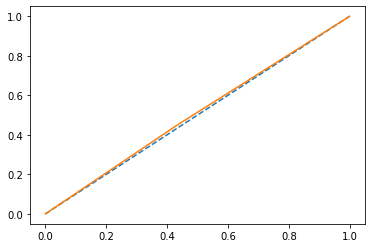

roc 0.5079365079365079
pred tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')


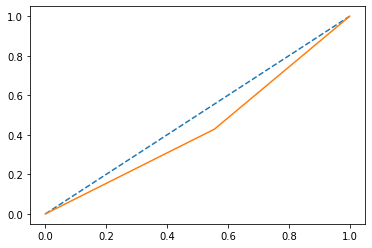

roc 0.4365079365079365
pred tensor([0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')


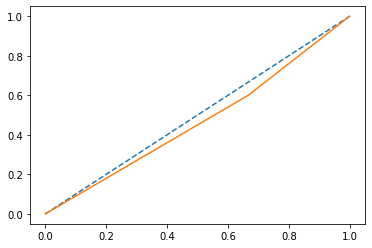

roc 0.4666666666666667
pred tensor([1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')


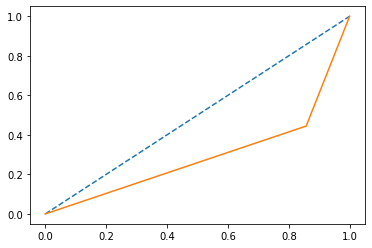

roc 0.29365079365079366
pred tensor([1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')


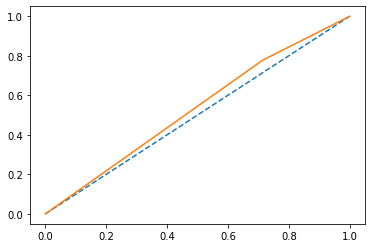

roc 0.5317460317460317
pred tensor([1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')


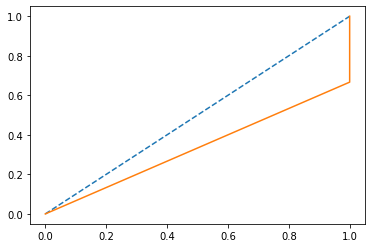

roc 0.3333333333333333
pred tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')


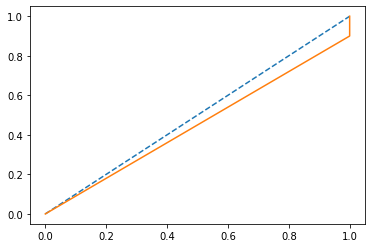

roc 0.45
pred tensor([0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


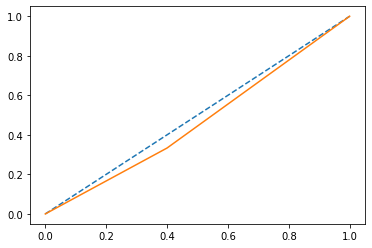

roc 0.4666666666666666
pred tensor([1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')


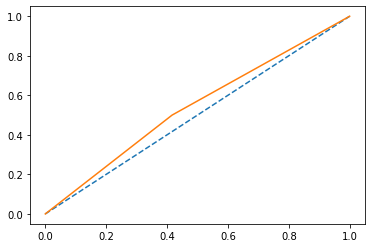

roc 0.5416666666666666
pred tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')


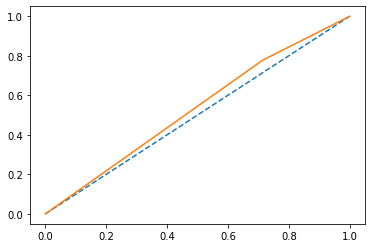

roc 0.5317460317460317
pred tensor([1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')


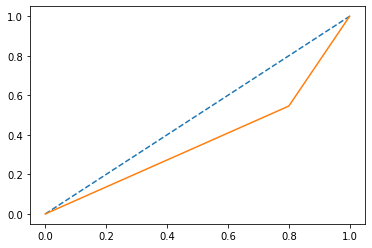

roc 0.3727272727272727
pred tensor([1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')


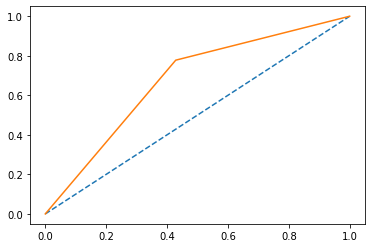

roc 0.6746031746031745
pred tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')


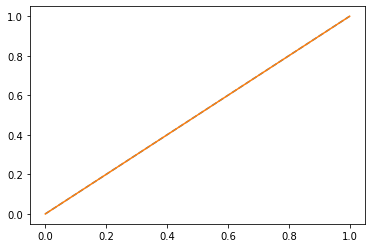

roc 0.5
pred tensor([1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')


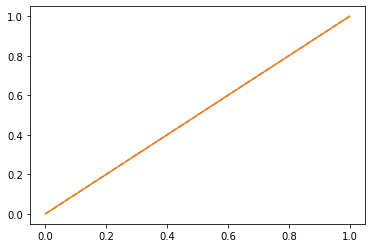

roc 0.5
pred tensor([1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')


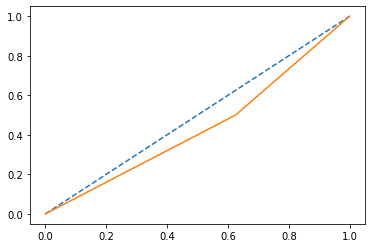

roc 0.4375
pred tensor([0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


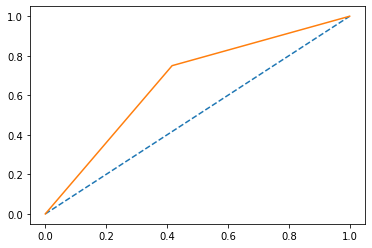

roc 0.6666666666666666
pred tensor([0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')


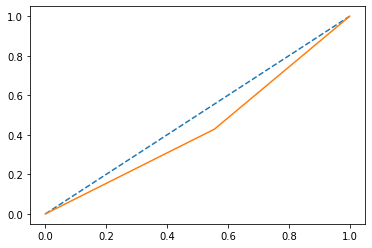

roc 0.4365079365079365
pred tensor([1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')


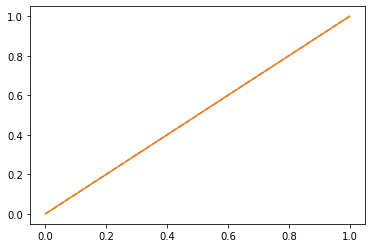

roc 0.5
pred tensor([0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')


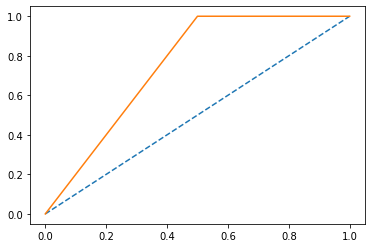

roc 0.75
pred tensor([1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')


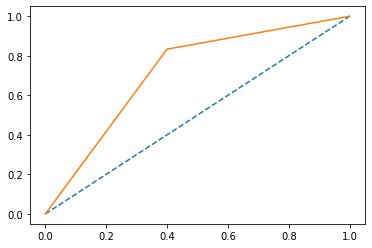

roc 0.7166666666666668
pred tensor([1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


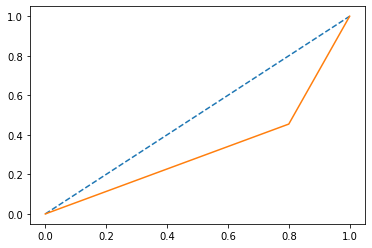

roc 0.32727272727272727
pred tensor([0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')


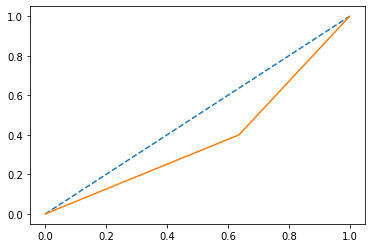

roc 0.38181818181818183
pred tensor([0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')


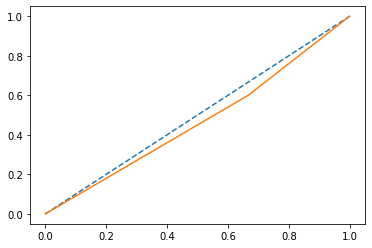

roc 0.4666666666666667
pred tensor([1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')


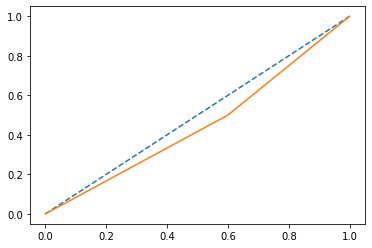

roc 0.45000000000000007
pred tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')


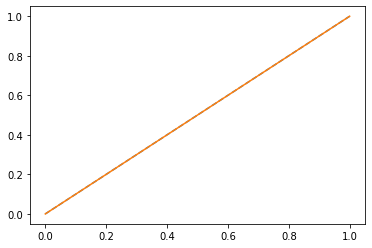

roc 0.5
pred tensor([0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')


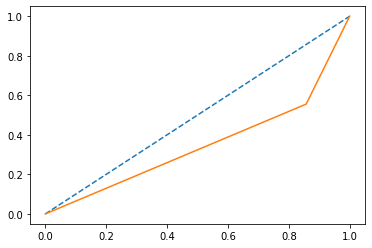

roc 0.34920634920634924
pred tensor([0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')


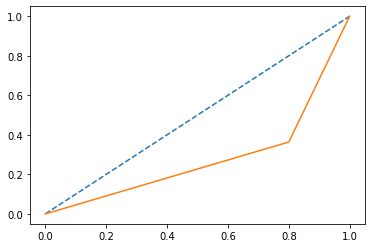

roc 0.28181818181818186
pred tensor([1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0], device='cuda:0')


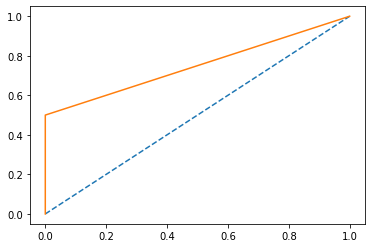

roc 0.75
Epoch 1: train_loss: 0.1396 train_acc: 0.9507 | val_loss: 1.4886 val_acc: 0.4824
00:05:25.76


In [ ]:
train(model, train_loader, val_loader, optimizer)

In [ ]:
import numpy as np
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from matplotlib import pyplot
import sklearn
from sklearn.metrics import roc_auc_score

from sklearn.metrics import f1_score
def multi_acc(y_pred, y_test,total_roc):
  
  pred = torch.log_softmax(y_pred, dim=1).argmax(dim=1)
  probs = torch.argmax(y_pred,axis=1)
  
  print('pred',pred)
  acc = (pred == y_test).sum().float() / float(y_test.size(0))
  print('prob',probs)
  
  fpr, tpr, thresholds = roc_curve(y_test.cpu().numpy(), probs.cpu().numpy())
  
  pyplot.plot([0, 1], [0, 1], linestyle='--')
  pyplot.plot(fpr, tpr)
  pyplot.show()
  #roc_acc = roc_auc_score(y_test.cpu().numpy(),probs.cpu().numpy())
  #print(f1_score(y_test.cpu().numpy(),pred.cpu().numpy()))
  try:
    roc_auc= roc_auc_score(y_test.cpu().numpy(), probs.cpu().numpy())
    total_roc+=roc_auc
    print('roc',roc_auc)
  except ValueError:
    pass
  
  return acc,total_roc

import time

EPOCHS = 1


def train(model, train_loader, val_loader, optimizer):  
  total_step = len(train_loader)

  for epoch in range(EPOCHS):
    start = time.time()
    model.train()
    total_train_loss = 0
    total_train_acc  = 0
    total_roc = 0
    number_of_iter = 0
    for batch_idx, (pair_token_ids, mask_ids, seg_ids, y) in enumerate(train_loader):
      optimizer.zero_grad()
      pair_token_ids = pair_token_ids.to(device)
      mask_ids = mask_ids.to(device)
      seg_ids = seg_ids.to(device)
      labels = y.to(device)

      loss, prediction = model(pair_token_ids, 
                             token_type_ids=seg_ids, 
                             attention_mask=mask_ids, 
                             labels=labels).values()

      acc,roc = multi_acc(prediction, labels,total_roc)
      number_of_iter +=1
      #roc_acc = roc_auc_score(labels,prediction,multi_class='ovr')
      #acc = sklearn.accuracy_score(labels,prediction)
      print('acc1',acc)
      loss.backward()
      optimizer.step()
      
      total_train_loss += loss.item()
      total_train_acc  += acc.item()
      total_roc +=roc
      

    train_acc  = total_train_acc/len(train_loader)
    train_loss = total_train_loss/len(train_loader)
    model.eval()
    total_val_acc  = 0
    total_val_loss = 0
    with torch.no_grad():
      for batch_idx, (pair_token_ids, mask_ids, seg_ids, y) in enumerate(val_loader):
        optimizer.zero_grad()
        pair_token_ids = pair_token_ids.to(device)
        mask_ids = mask_ids.to(device)
        seg_ids = seg_ids.to(device)
        labels = y.to(device)
        
        loss, prediction = model(pair_token_ids, 
                             token_type_ids=seg_ids, 
                             attention_mask=mask_ids, 
                             labels=labels).values()
        
        acc = multi_acc(prediction, labels)
        #acc = sklearn.accuracy_score(labels,prediction)
        total_val_loss += loss.item()
        total_val_acc  += acc.item()

    val_acc  = total_val_acc/len(val_loader)
    val_loss = total_val_loss/len(val_loader)
    end = time.time()
    hours, rem = divmod(end-start, 3600)
    minutes, seconds = divmod(rem, 60)

    print(f'Epoch {epoch+1}: train_loss: {train_loss:.4f} train_acc: {train_acc:.4f} | val_loss: {val_loss:.4f} val_acc: {val_acc:.4f}')
    print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
    print('roc',total_roc)
    print('num',number_of_iter)

pred tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')


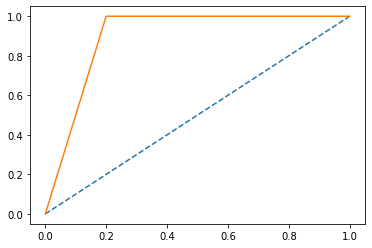

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')


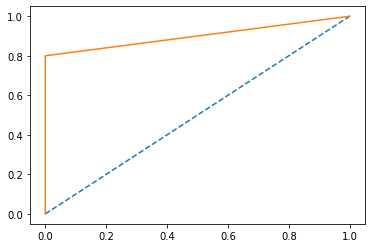

roc 0.9
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


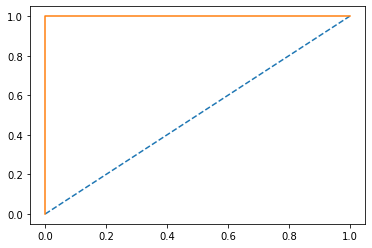

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')


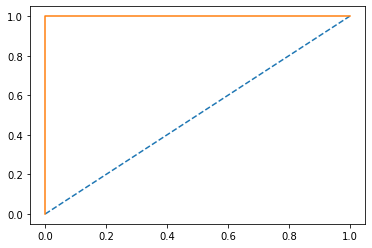

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')


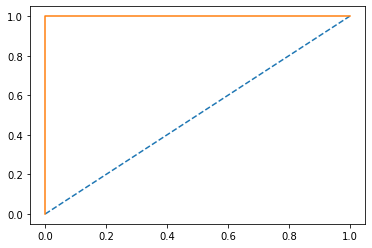

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


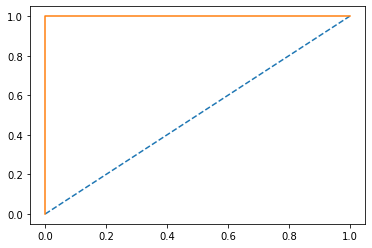

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')


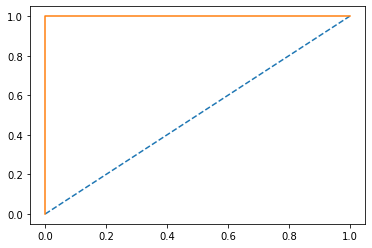

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')


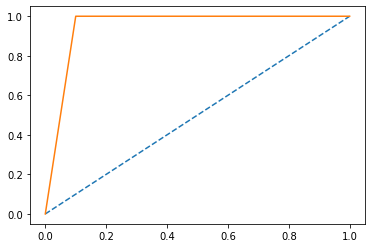

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')


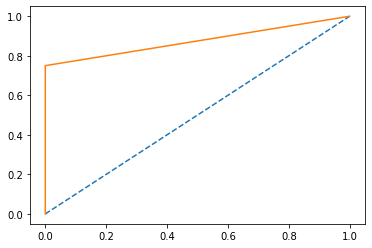

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')


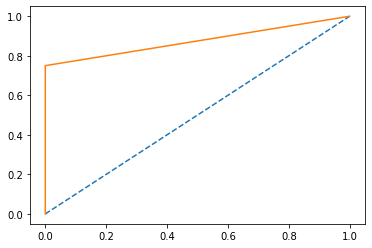

roc 0.875
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')


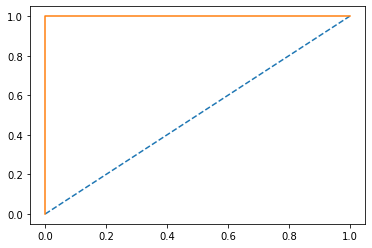

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')


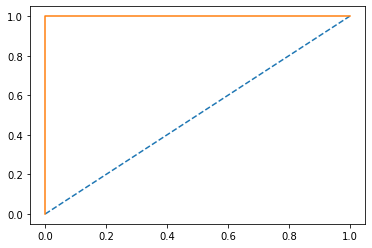

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')


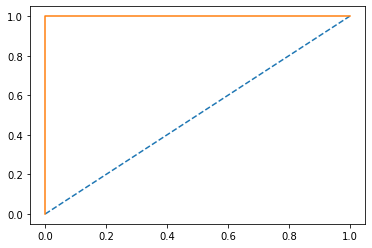

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')


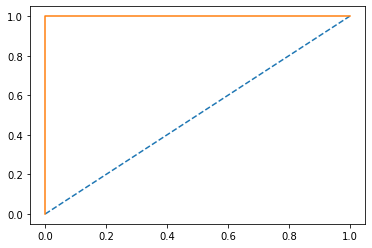

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')


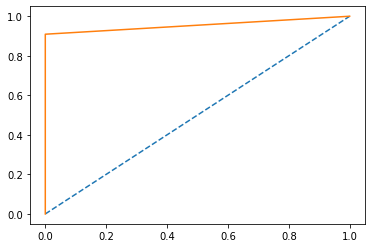

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1], device='cuda:0')


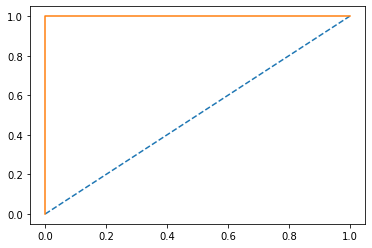

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')


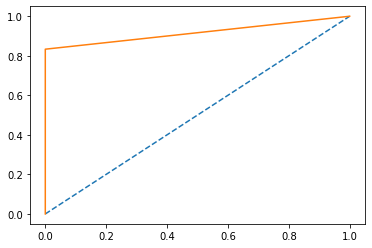

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')


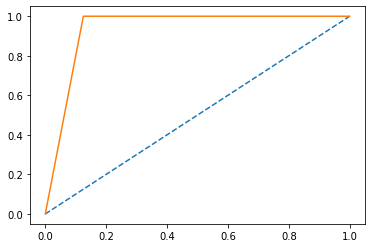

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')


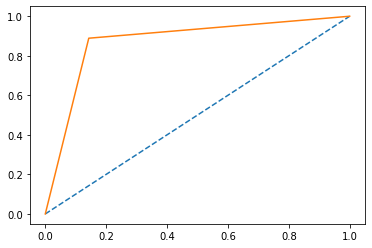

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')


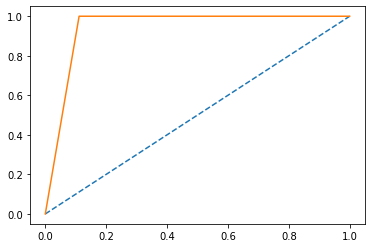

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')


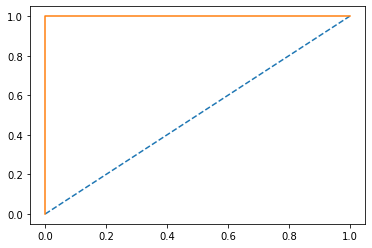

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')


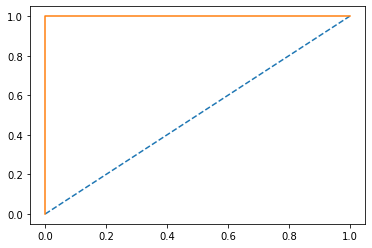

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')


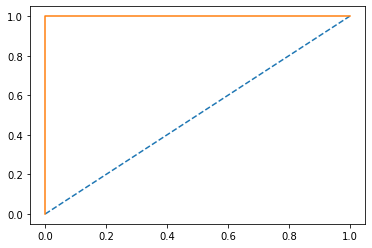

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')


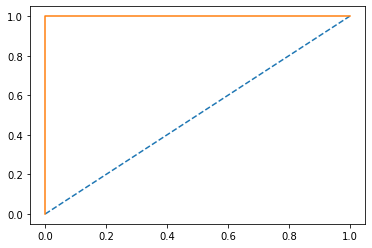

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')


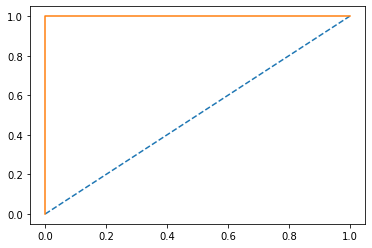

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


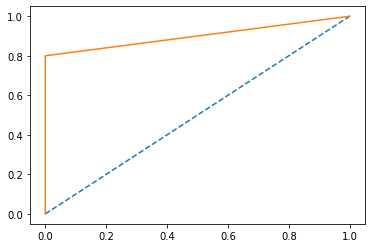

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')


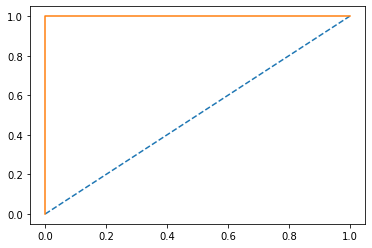

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')


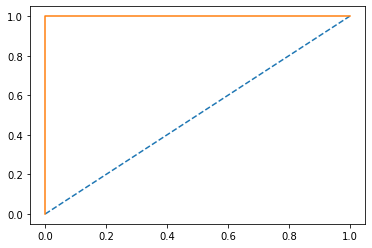

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')


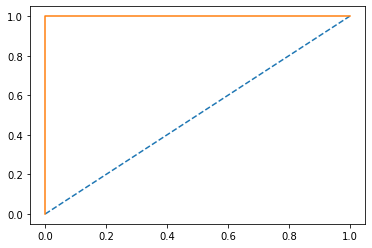

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')


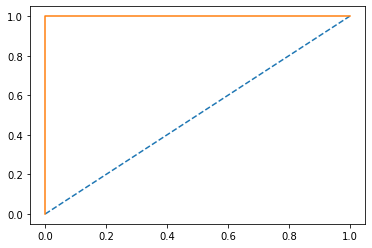

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')


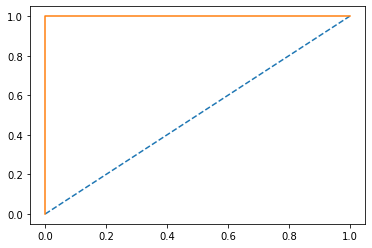

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')


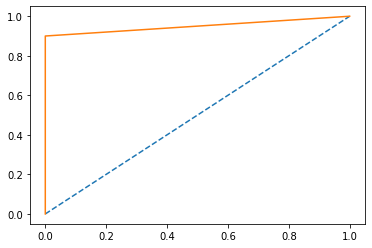

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')


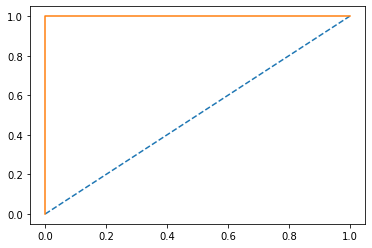

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')


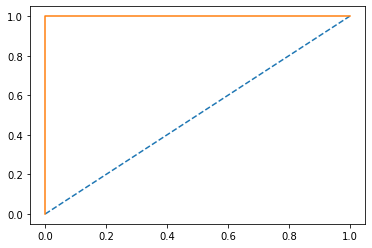

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')


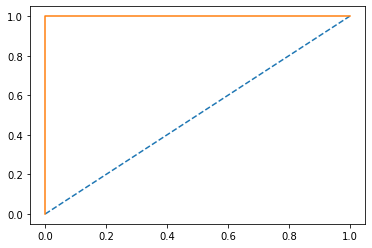

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')


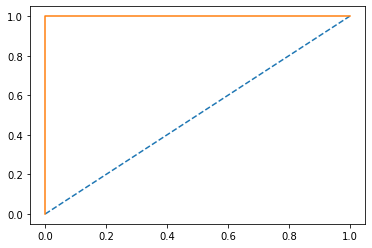

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')


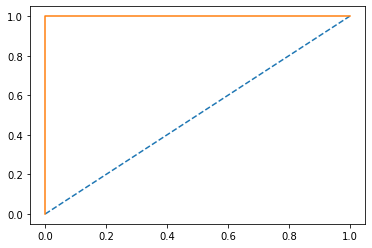

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')


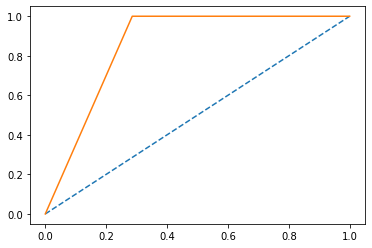

roc 0.8571428571428572
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1], device='cuda:0')


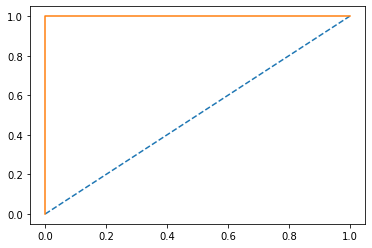

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')


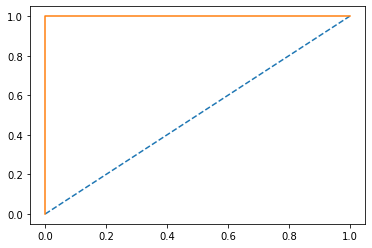

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')


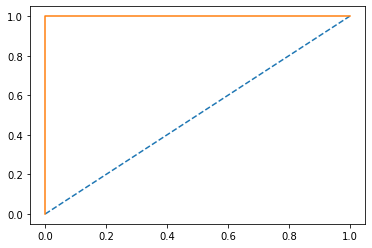

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')


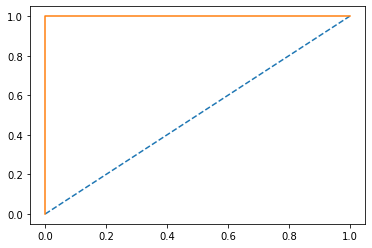

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')


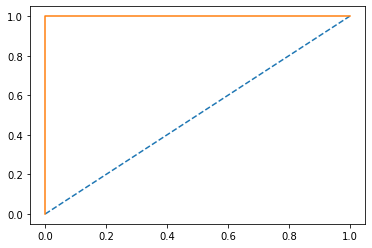

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')


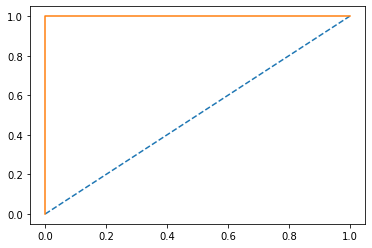

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')


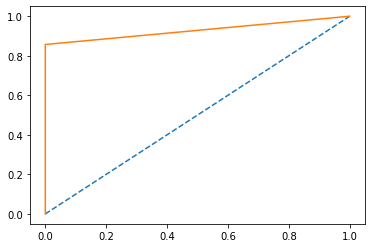

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')


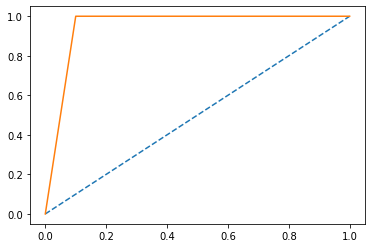

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')


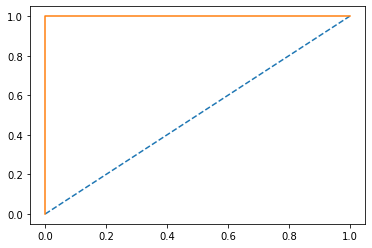

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1], device='cuda:0')


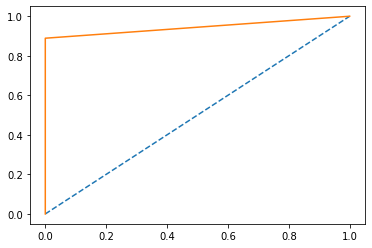

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')


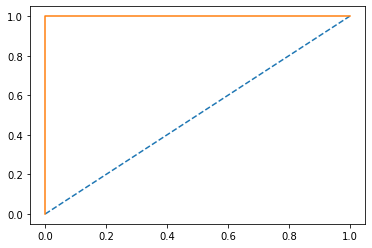

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')


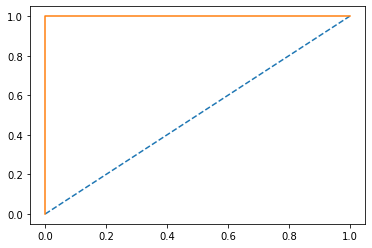

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')


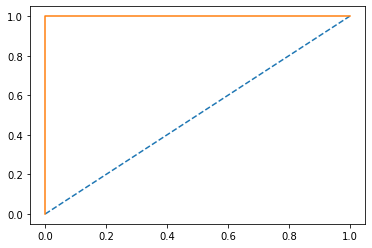

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')


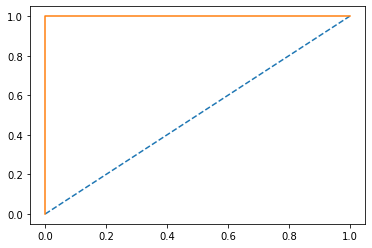

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')


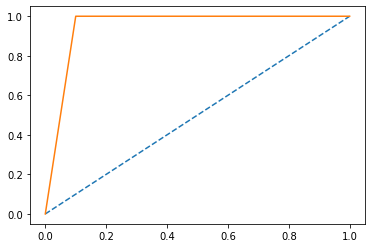

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0], device='cuda:0')


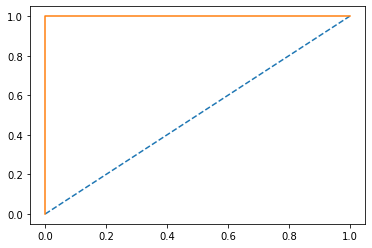

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')


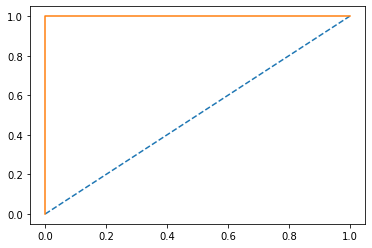

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')


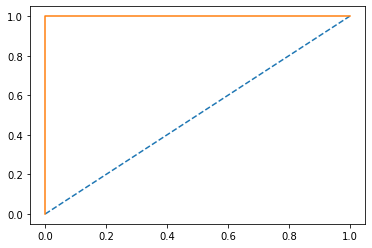

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')


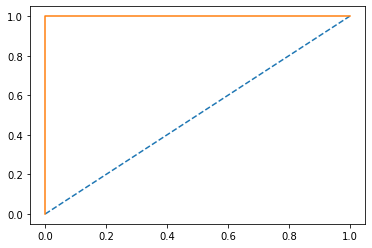

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')


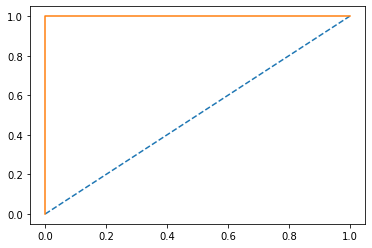

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')


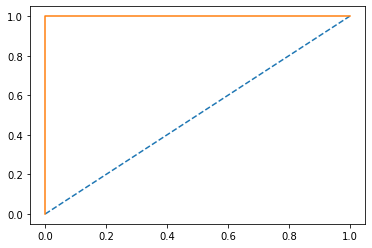

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')


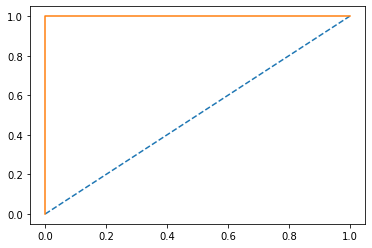

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')


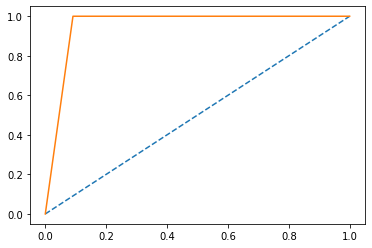

roc 0.9545454545454545
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')


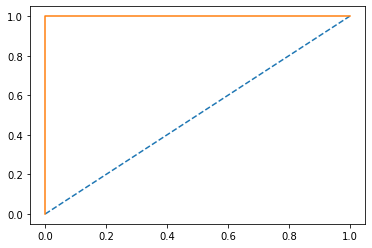

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')


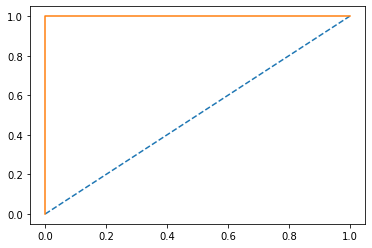

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


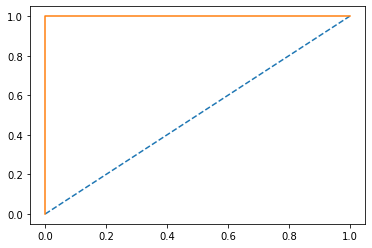

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')


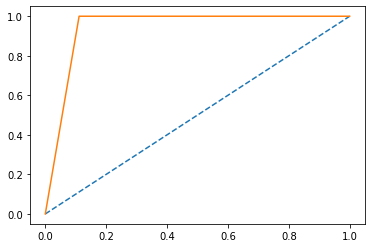

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')


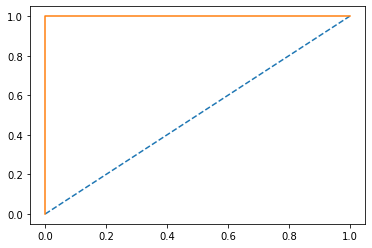

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')


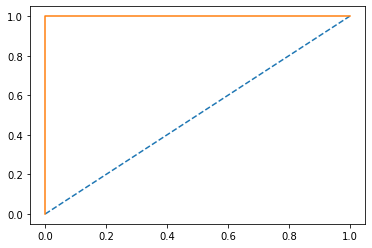

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')


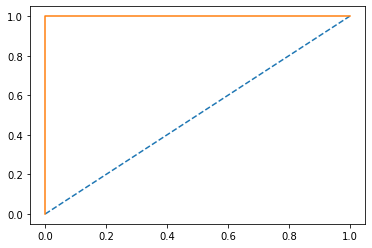

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')


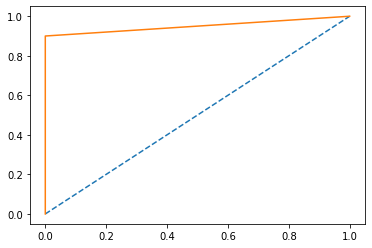

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


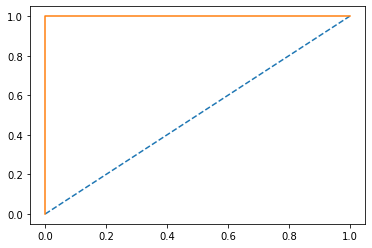

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')


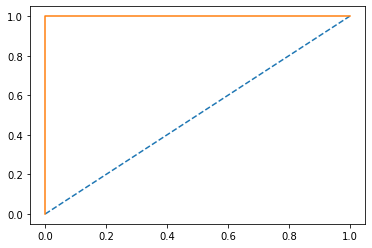

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')


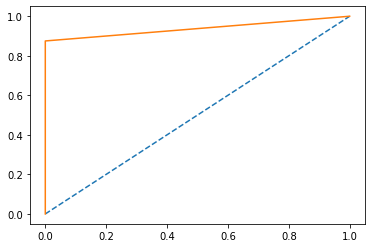

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')


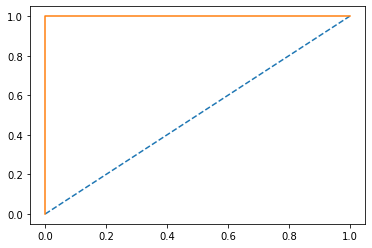

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')


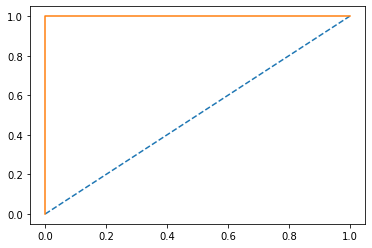

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')


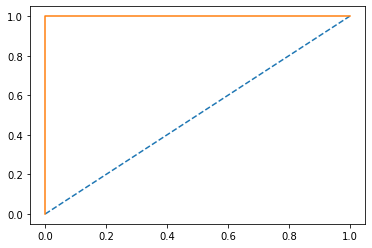

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')


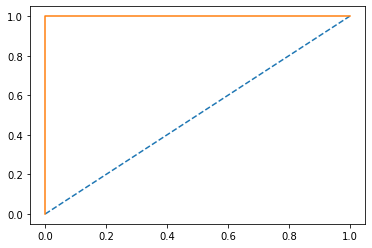

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')


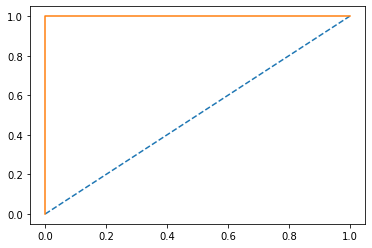

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')


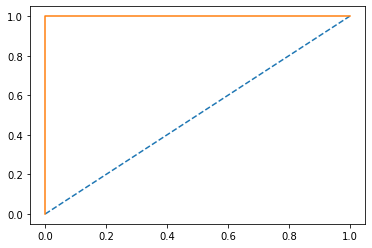

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')


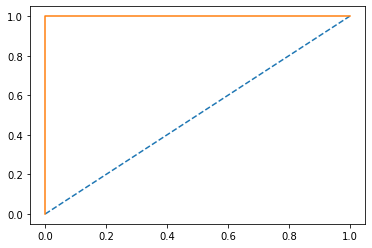

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


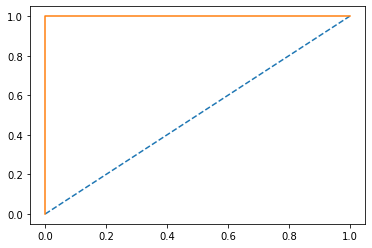

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')


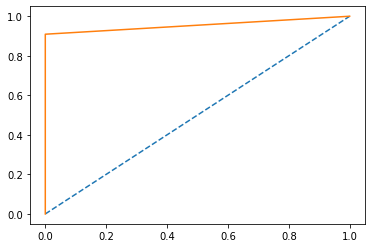

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


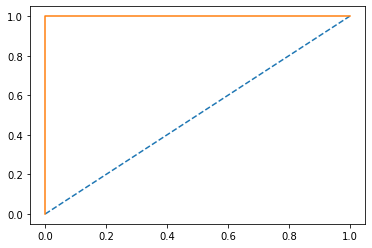

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')


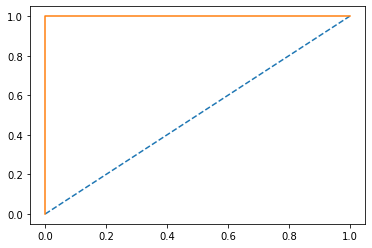

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')


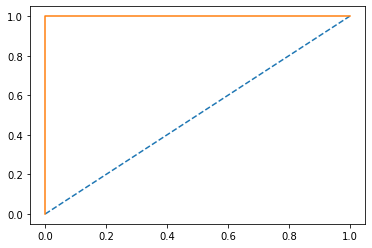

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


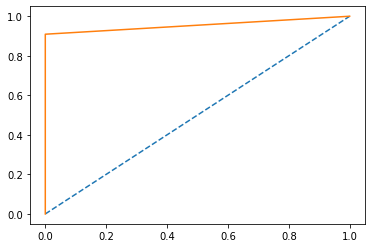

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')


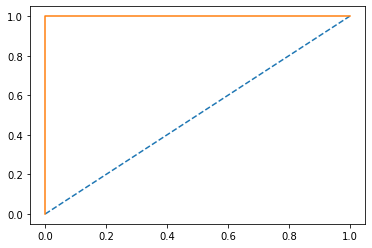

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0], device='cuda:0')


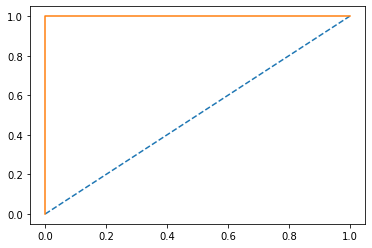

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')


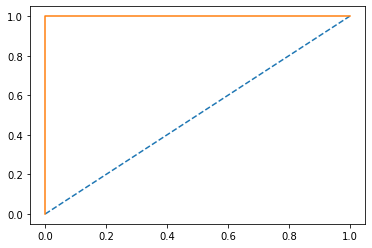

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')


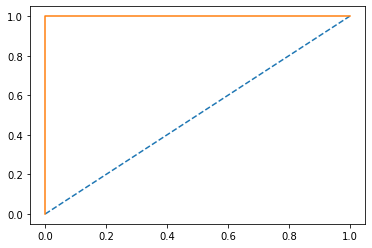

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')


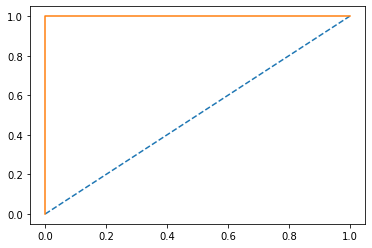

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')


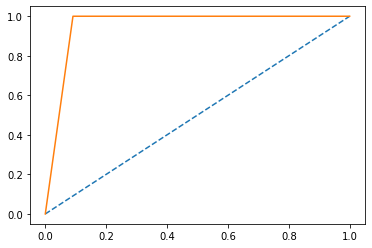

roc 0.9545454545454545
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')


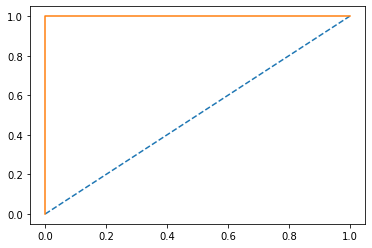

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')


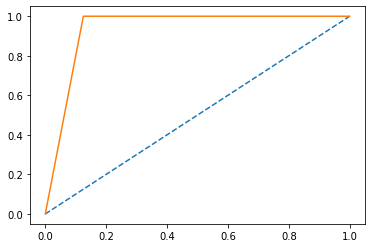

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')


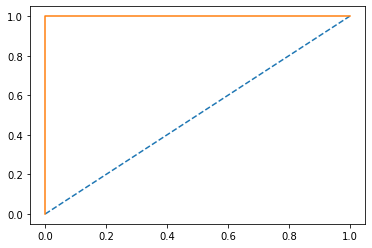

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')


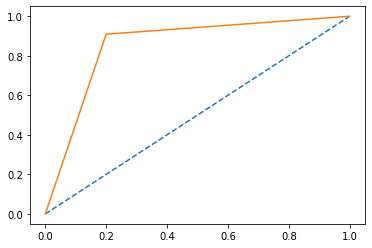

roc 0.8545454545454546
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')


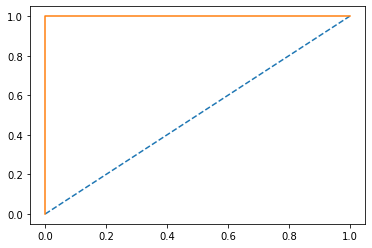

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')


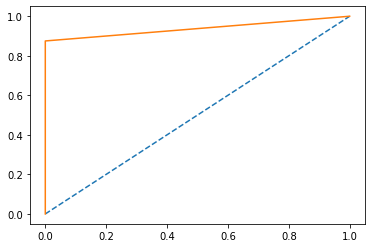

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')


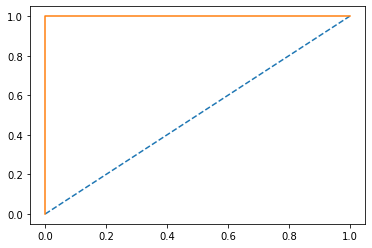

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


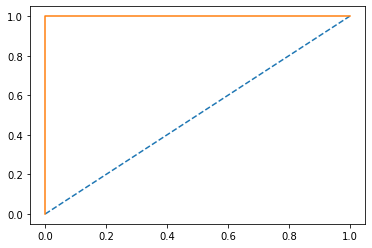

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


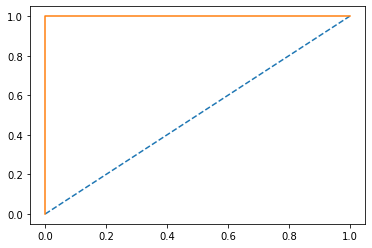

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')


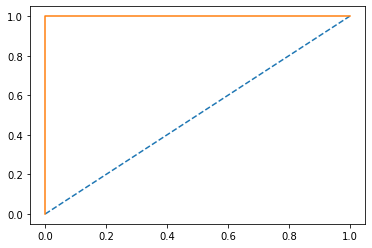

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')


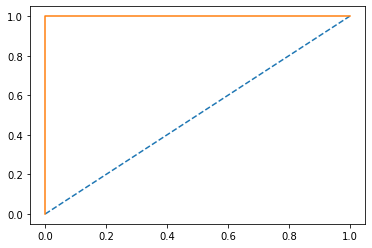

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')


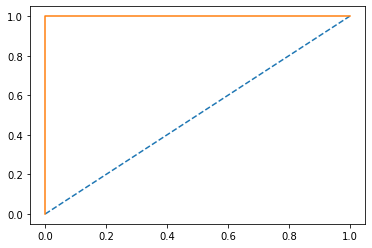

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')


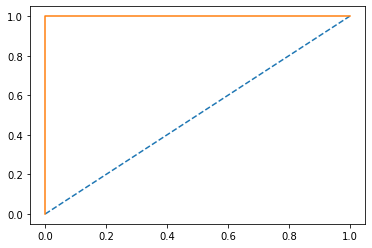

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')


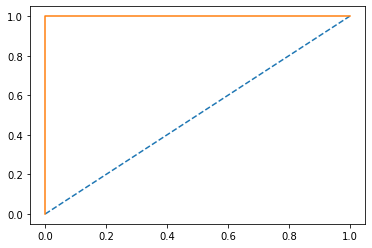

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')


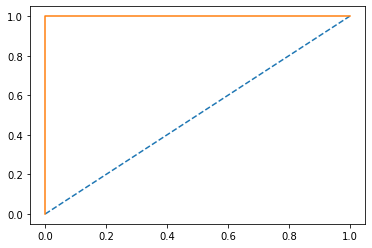

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')


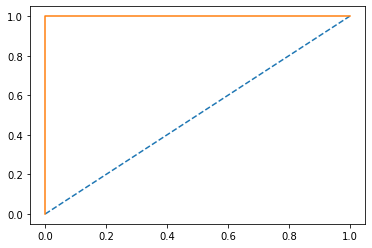

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')


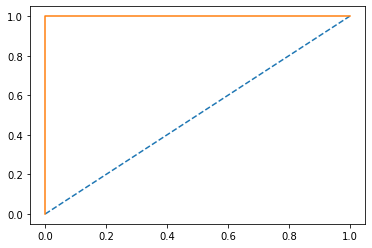

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')


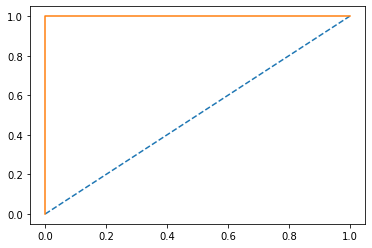

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')


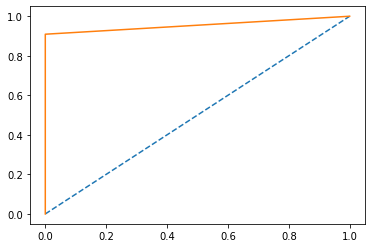

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')


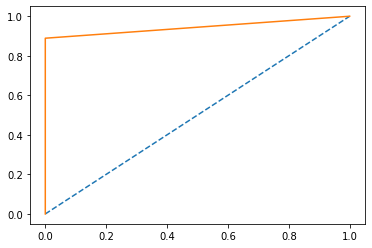

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')


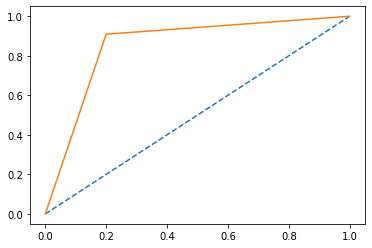

roc 0.8545454545454546
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')


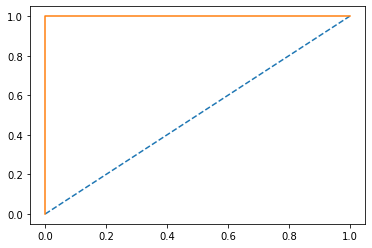

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')


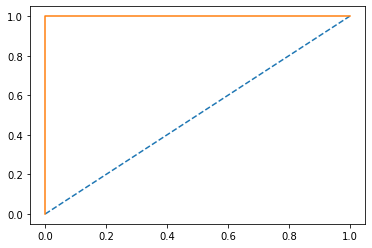

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')


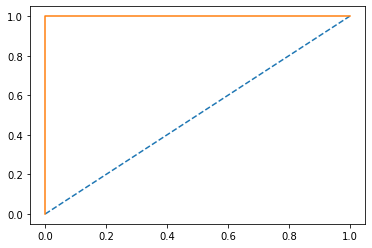

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


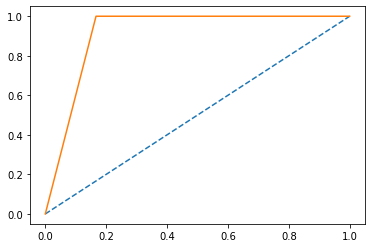

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')


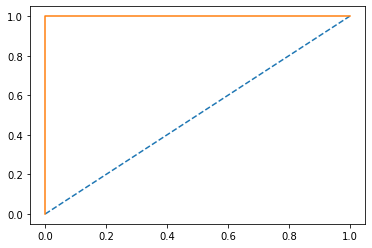

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')


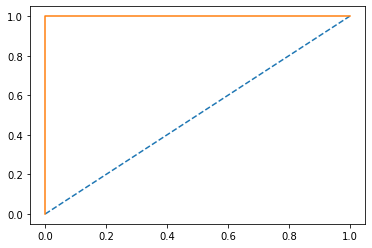

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')


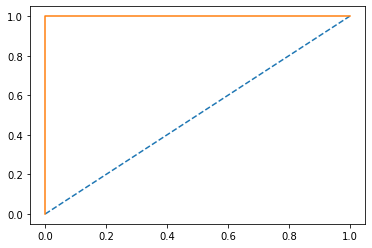

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')


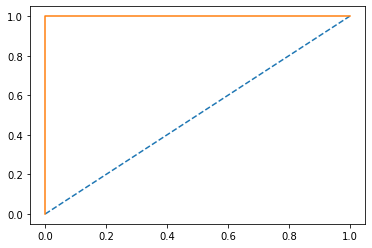

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')


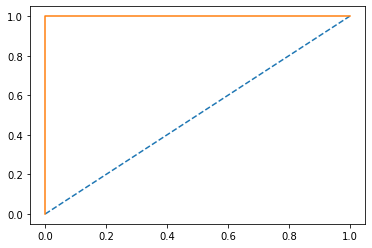

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')


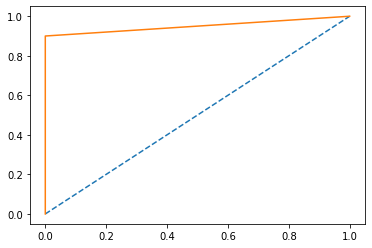

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')


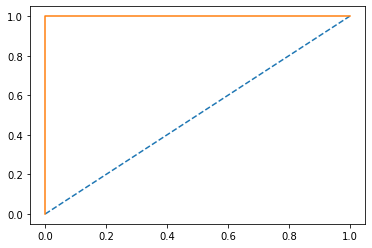

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')


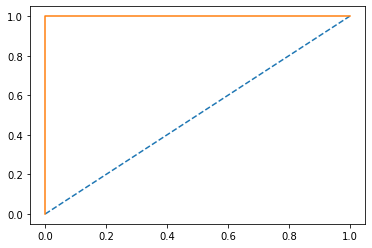

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')


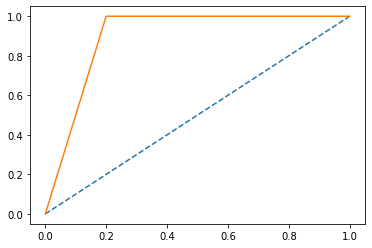

roc 0.9
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')


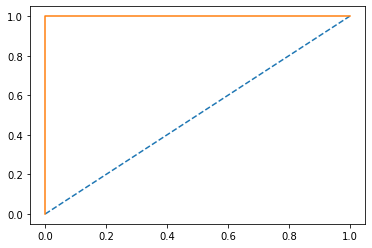

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0], device='cuda:0')


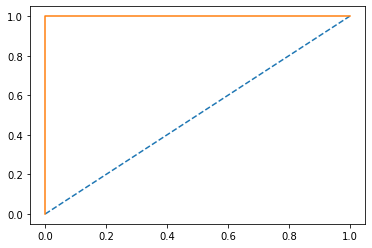

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')


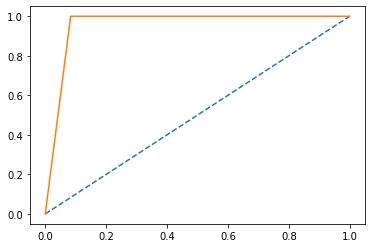

roc 0.9583333333333333
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')


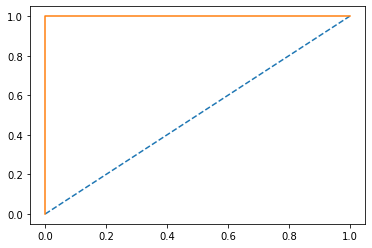

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')


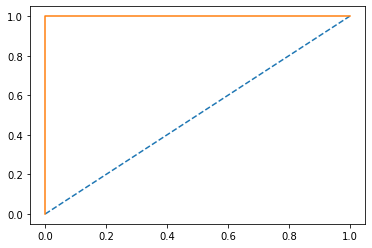

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')


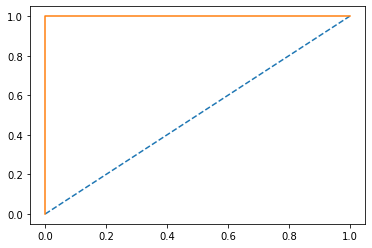

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')


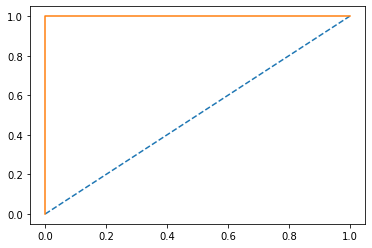

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')


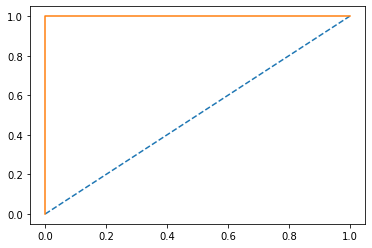

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')


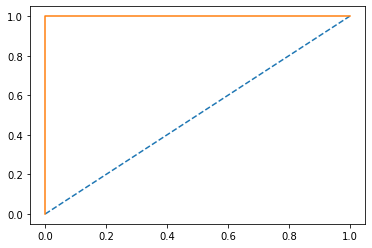

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')


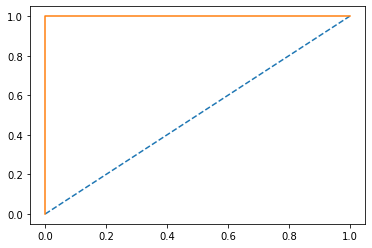

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


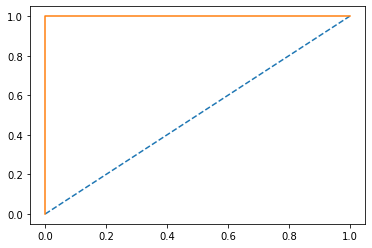

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


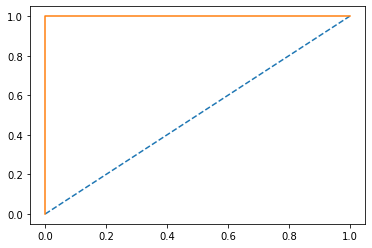

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], device='cuda:0')


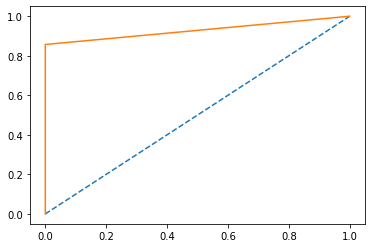

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')


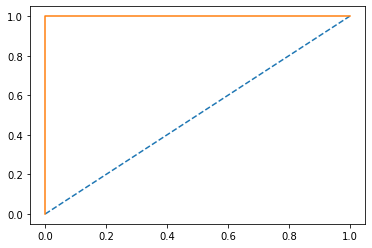

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')


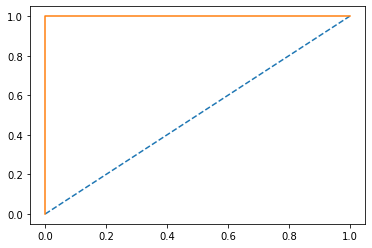

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')


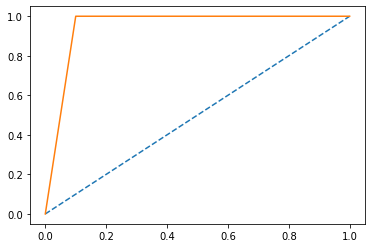

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')


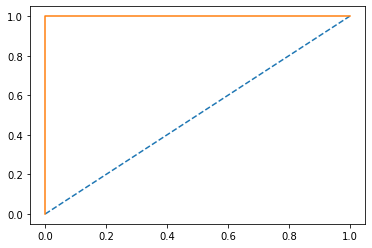

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1], device='cuda:0')


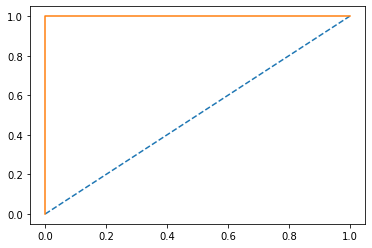

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')


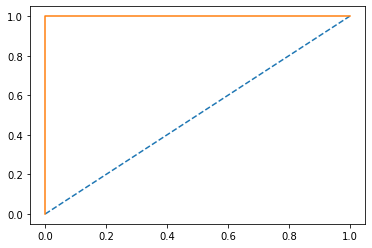

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')


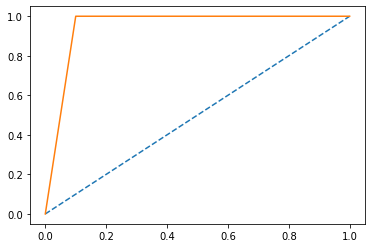

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


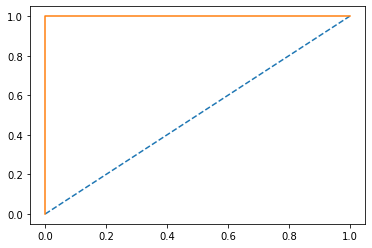

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')


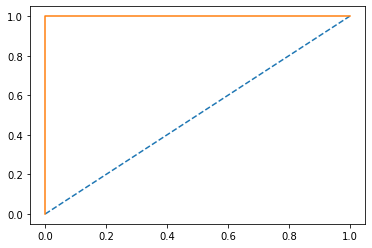

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')


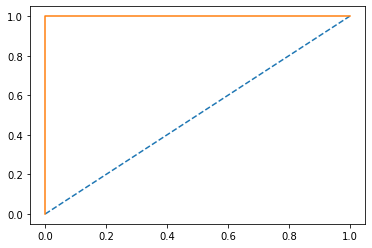

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')


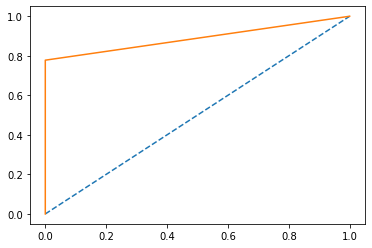

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1], device='cuda:0')


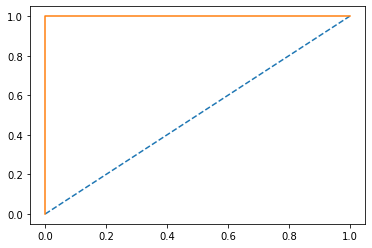

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')


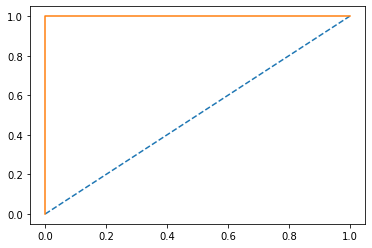

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')


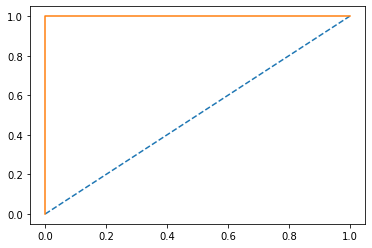

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')


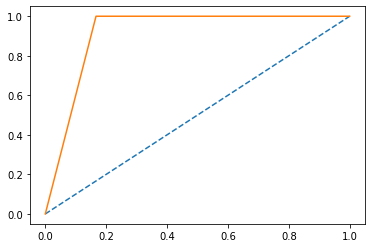

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')


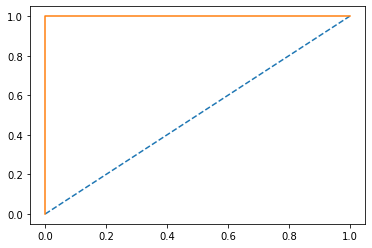

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')


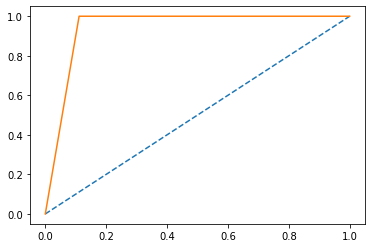

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')


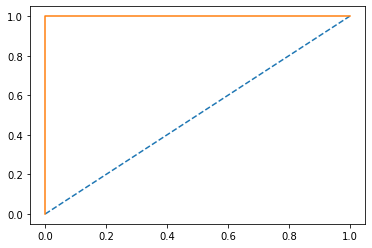

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')


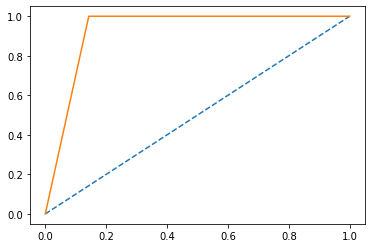

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')


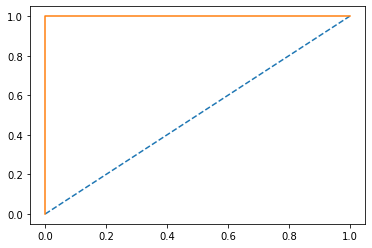

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')


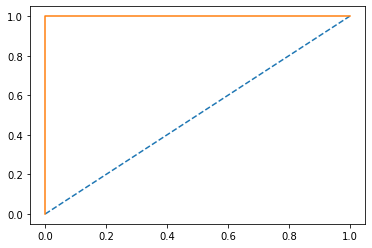

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')


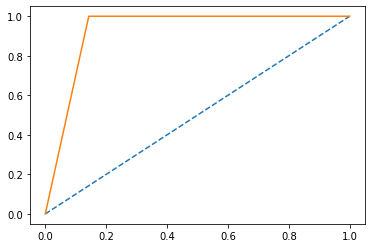

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1], device='cuda:0')


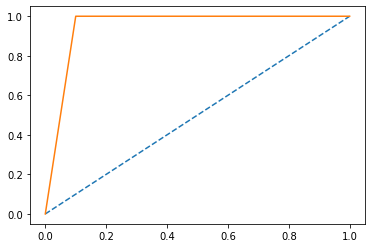

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


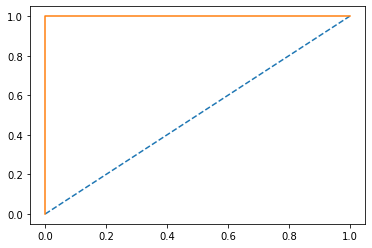

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')


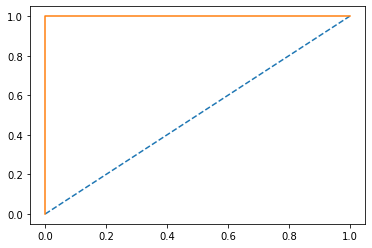

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


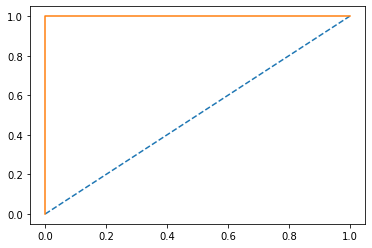

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


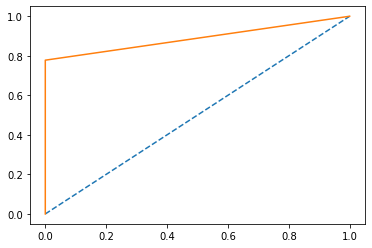

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')


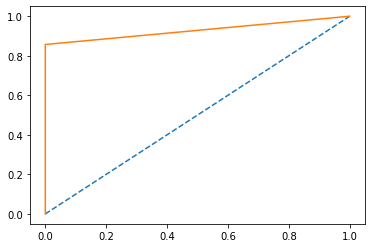

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')


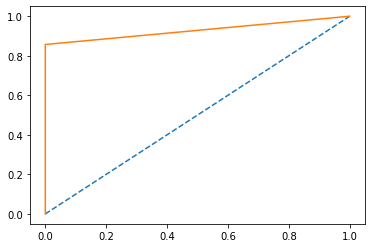

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')


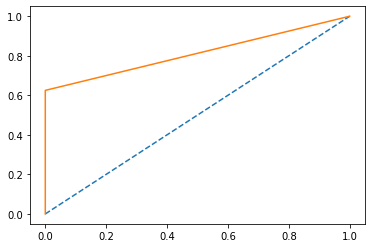

roc 0.8125
acc1 tensor(0.8125, device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


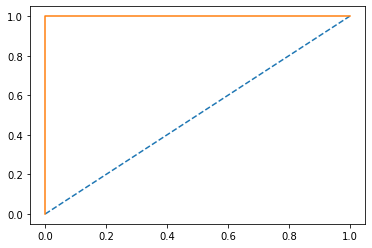

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1], device='cuda:0')


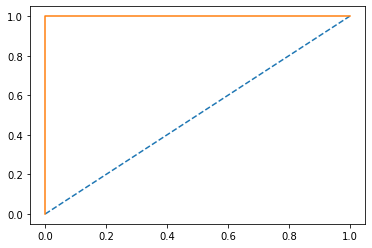

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')


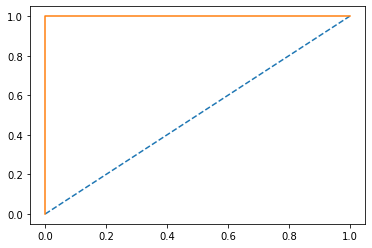

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')


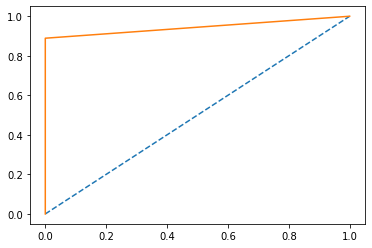

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')


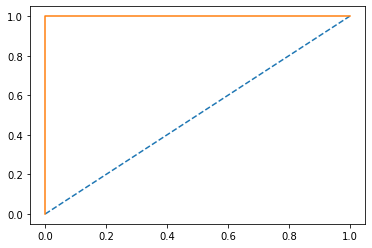

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')


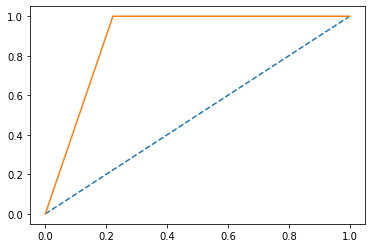

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


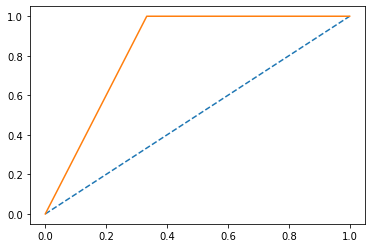

roc 0.8333333333333334
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')


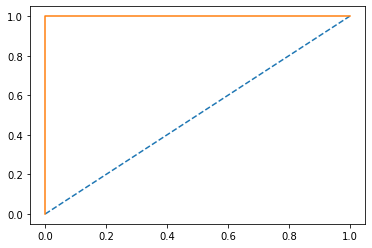

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')


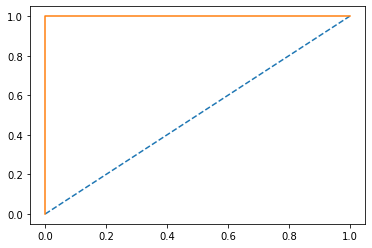

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1], device='cuda:0')


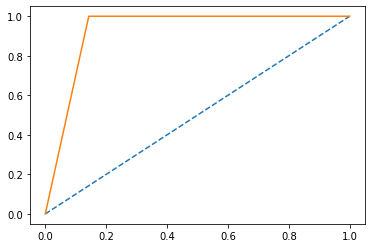

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')


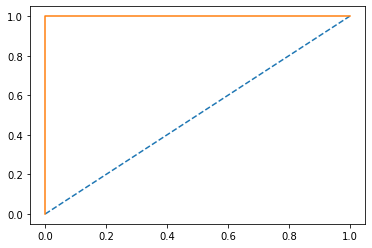

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')


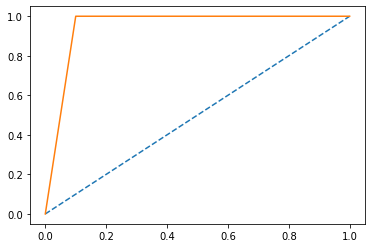

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')


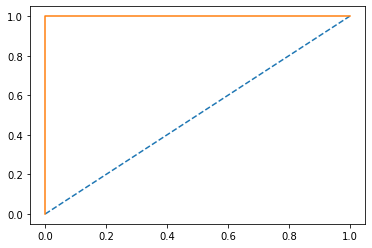

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1], device='cuda:0')


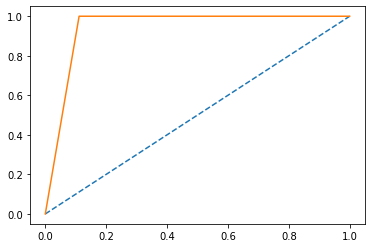

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1], device='cuda:0')


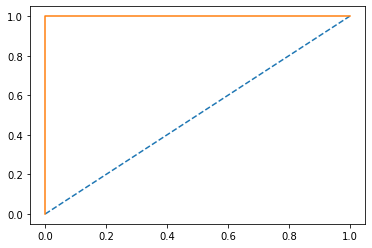

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')


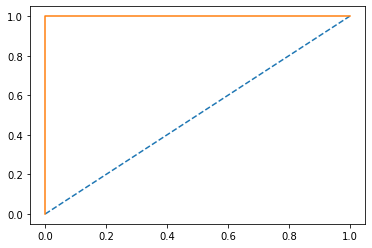

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')


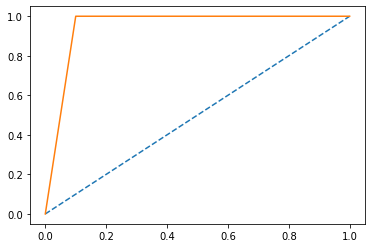

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')


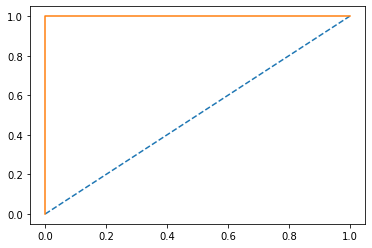

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')


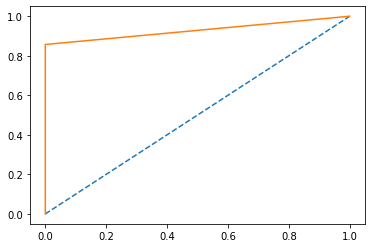

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')


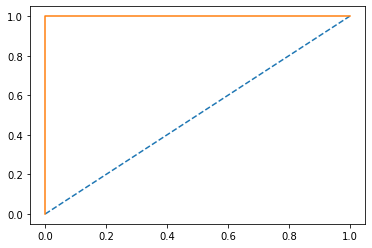

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')


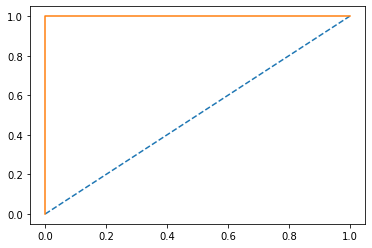

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')


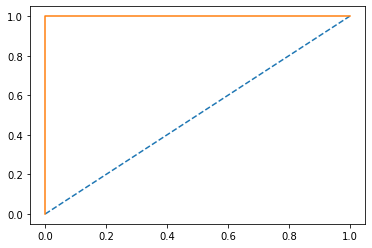

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')


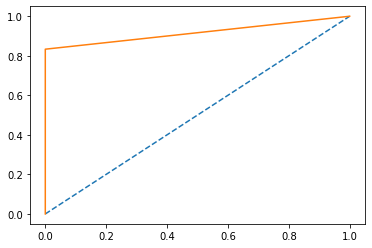

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1], device='cuda:0')


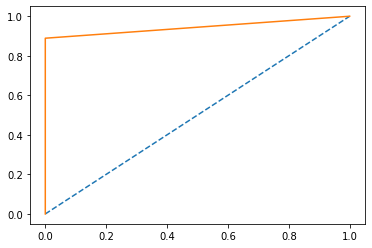

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')


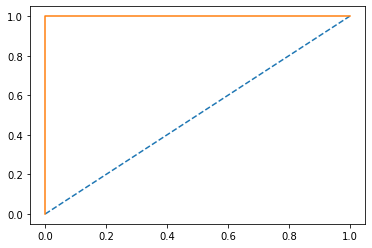

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')


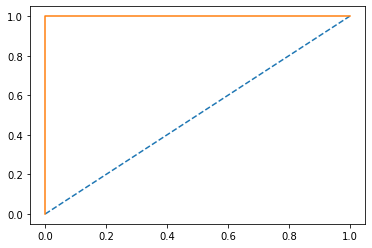

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')


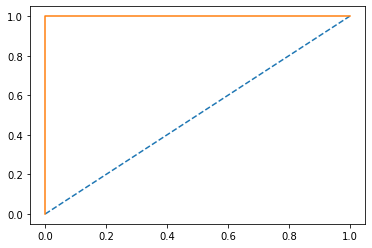

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')


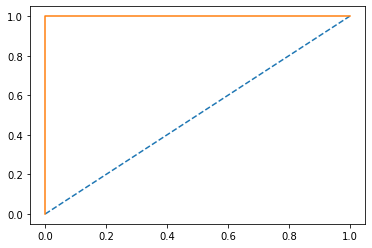

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0], device='cuda:0')


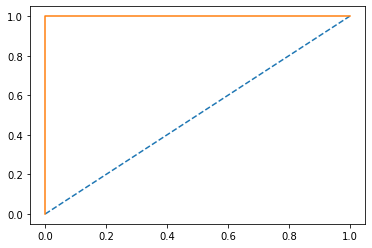

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')


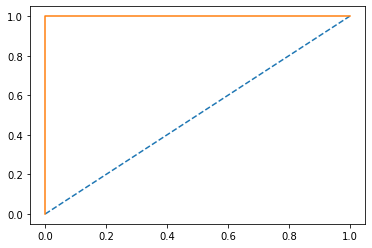

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')


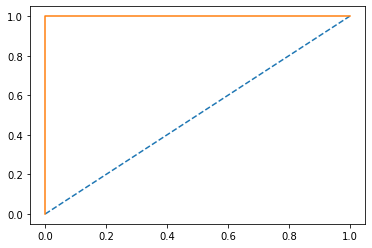

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')


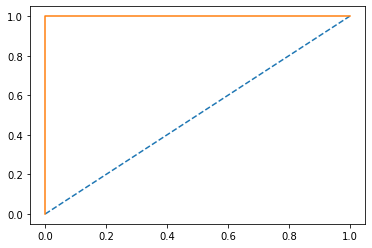

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


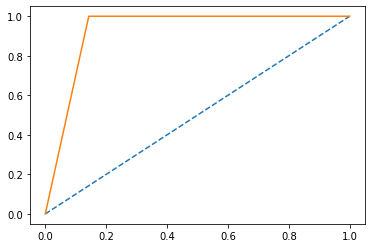

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')


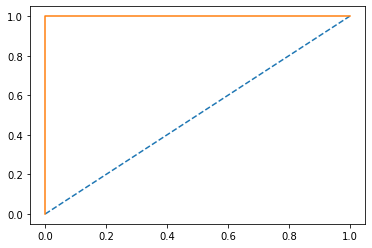

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')


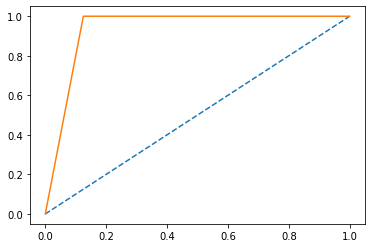

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')


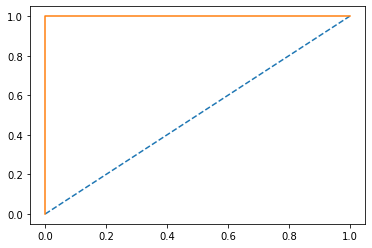

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')


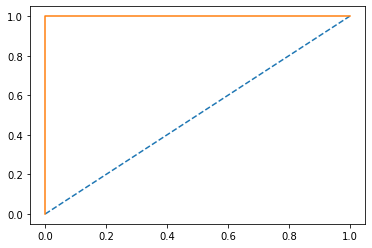

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')


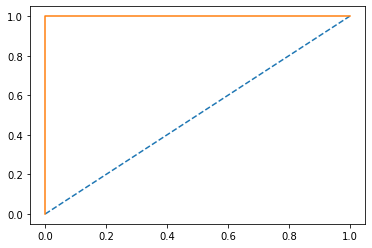

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')


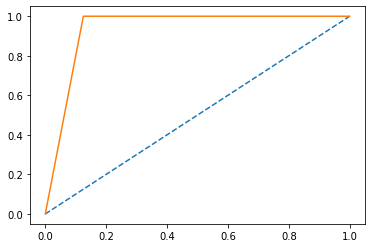

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')


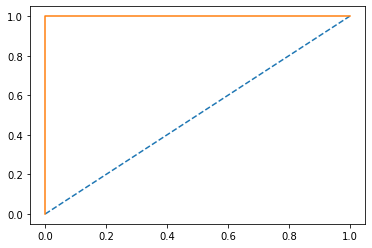

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')


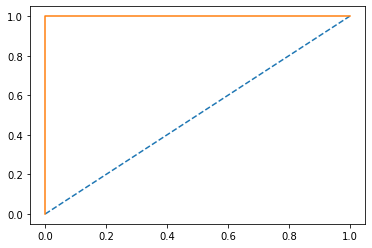

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')


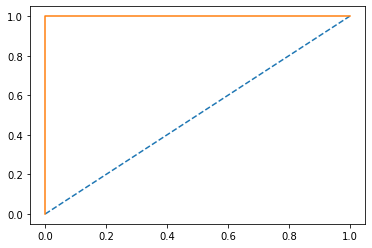

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')


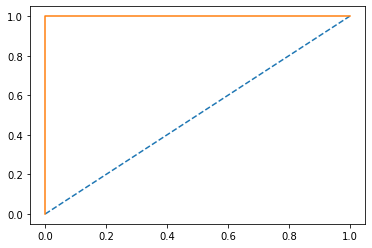

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')


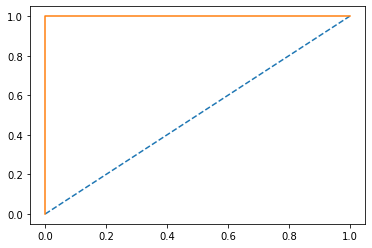

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')


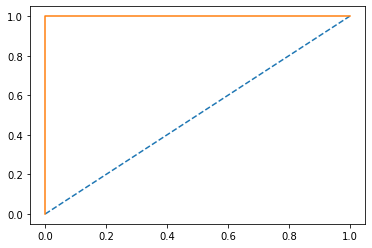

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')


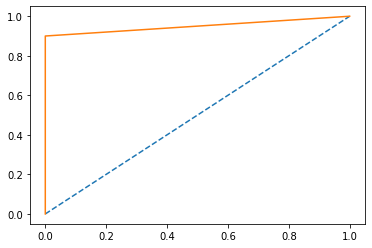

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')


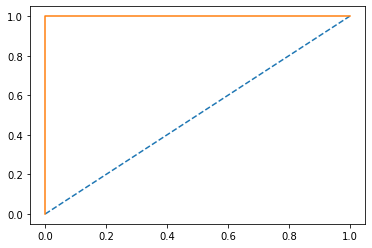

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1], device='cuda:0')


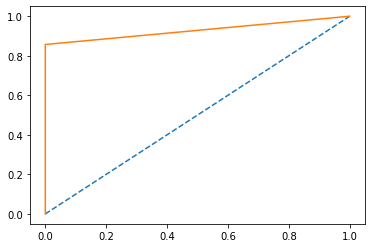

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')


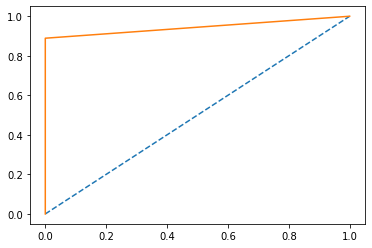

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')


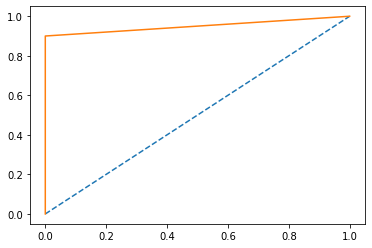

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0], device='cuda:0')


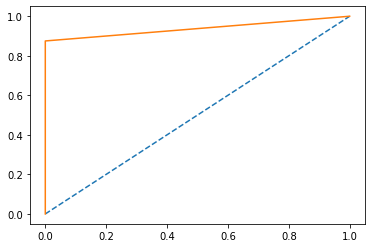

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')


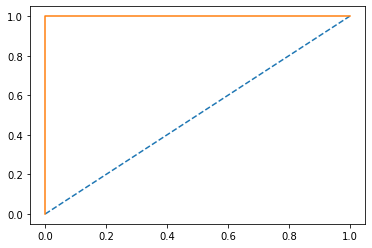

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0], device='cuda:0')


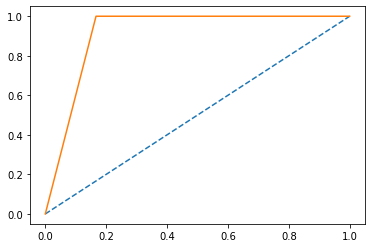

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')


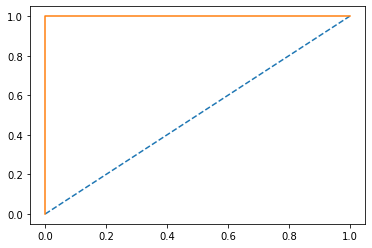

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')


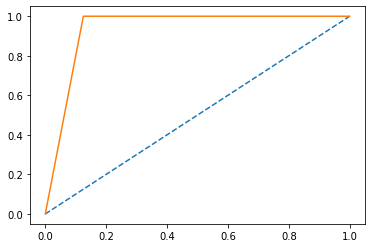

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')


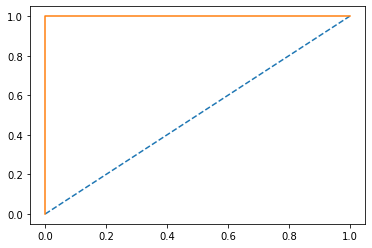

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')


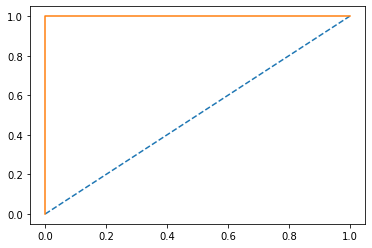

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')


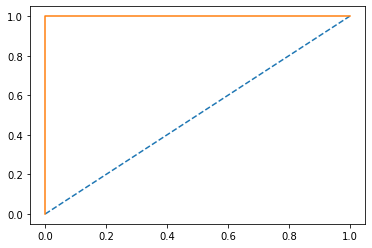

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')


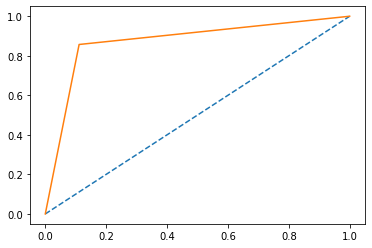

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


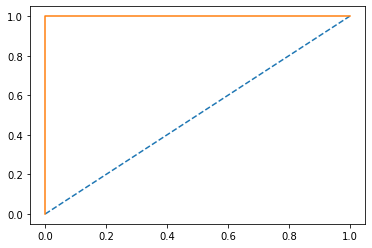

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')


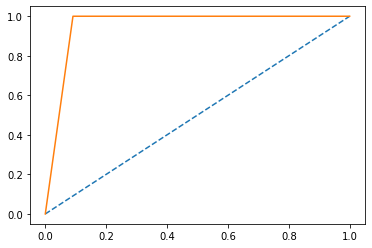

roc 0.9545454545454545
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')


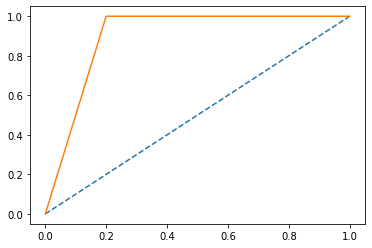

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')


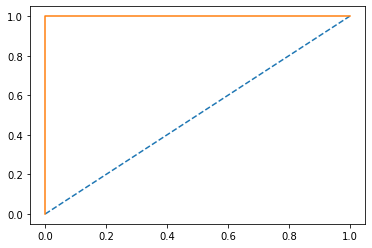

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')


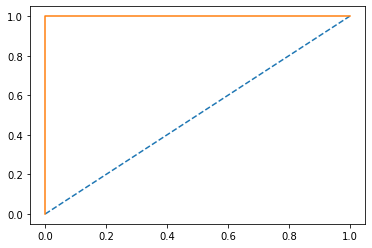

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')


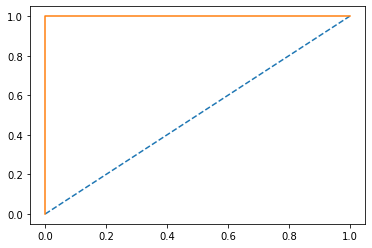

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')


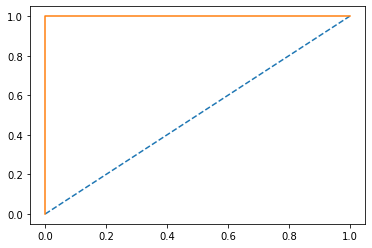

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')


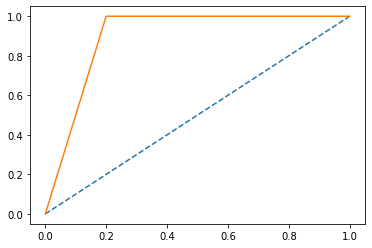

roc 0.9
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')


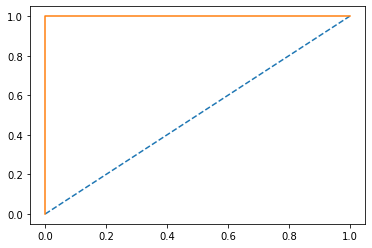

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')


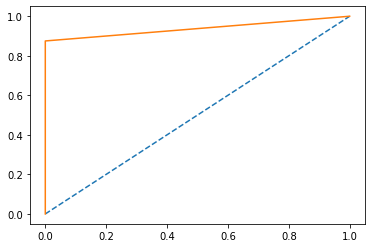

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')


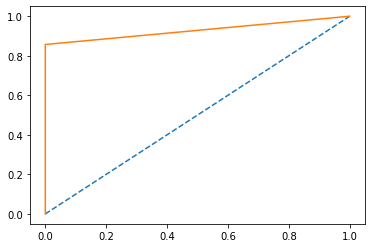

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')


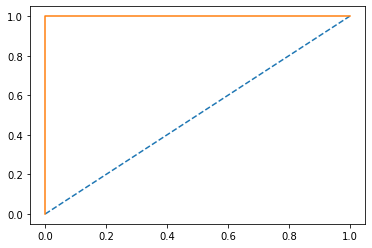

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')


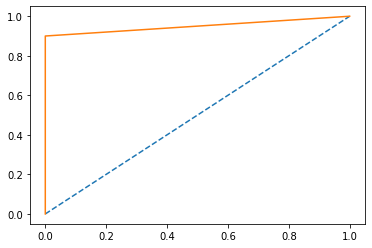

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')


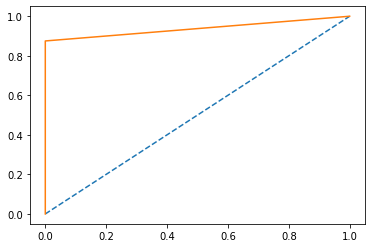

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1], device='cuda:0')


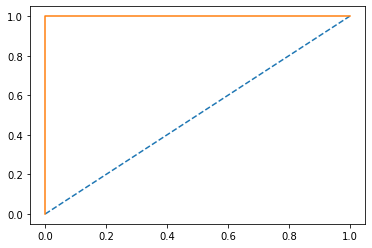

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0], device='cuda:0')


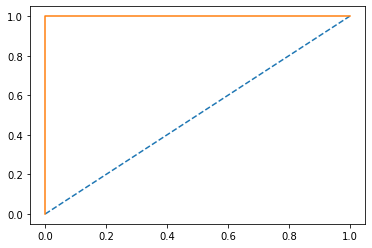

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')


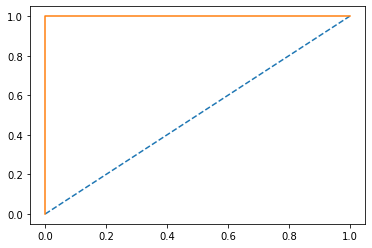

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')


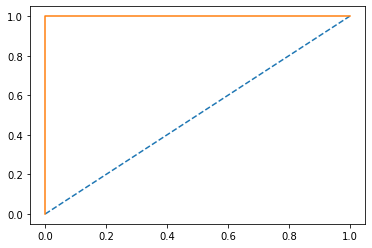

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')


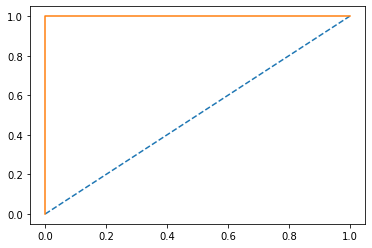

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')


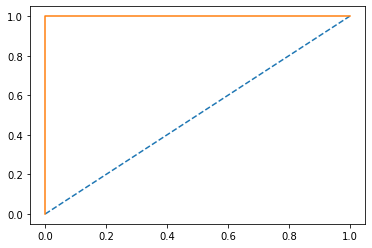

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


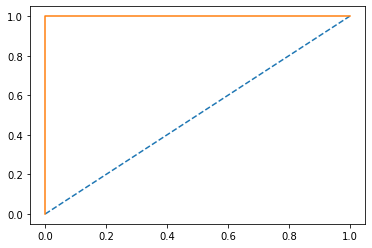

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')


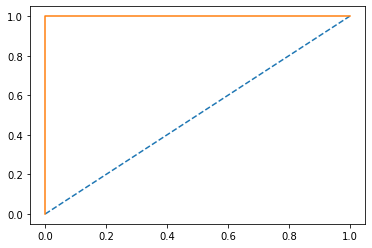

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


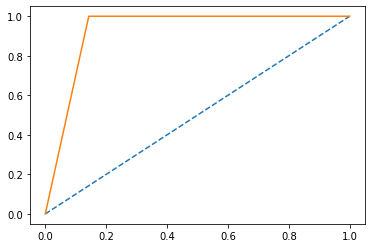

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')


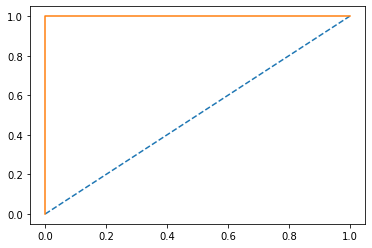

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')


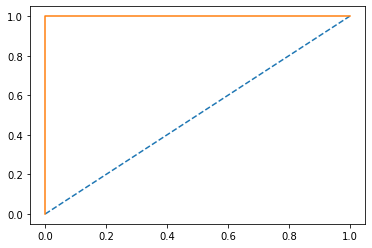

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')


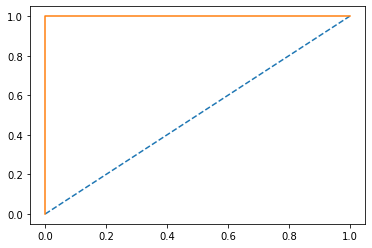

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')


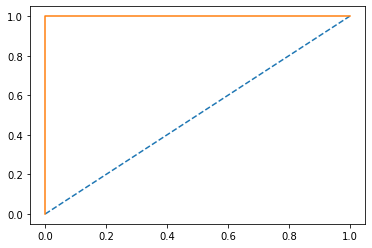

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')


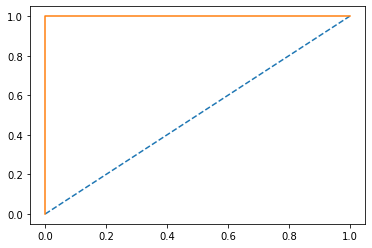

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')


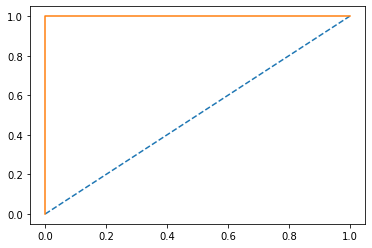

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')


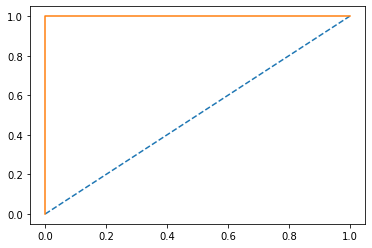

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')


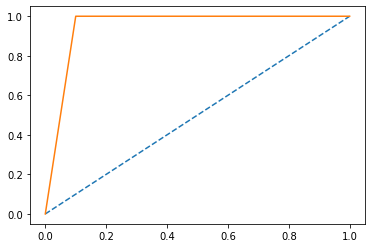

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')


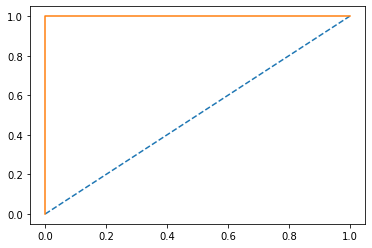

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0], device='cuda:0')


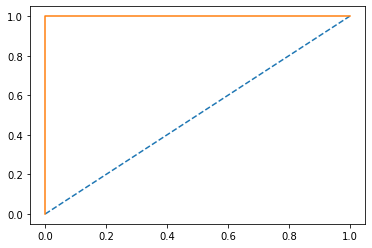

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')


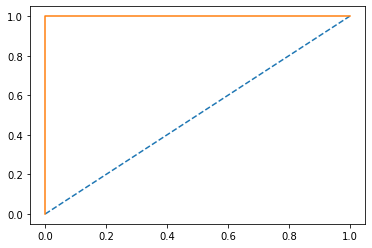

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')


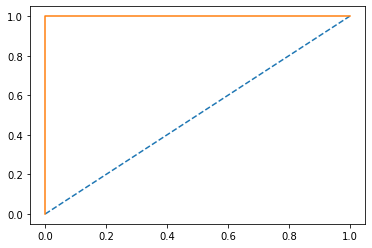

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1], device='cuda:0')


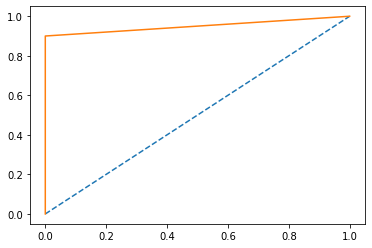

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1], device='cuda:0')


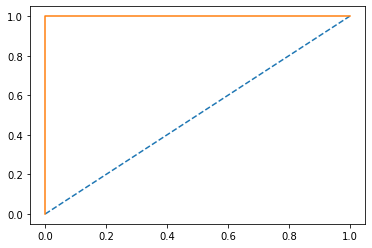

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


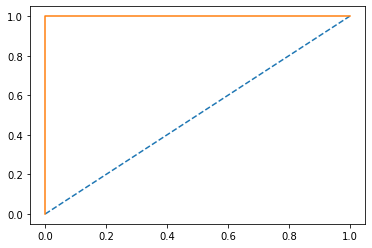

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')


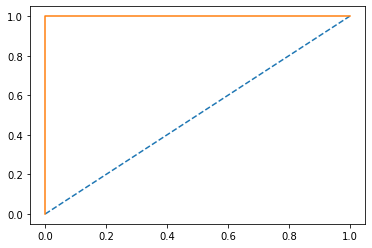

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')


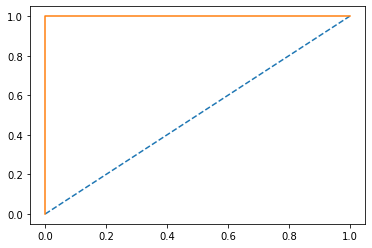

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1], device='cuda:0')


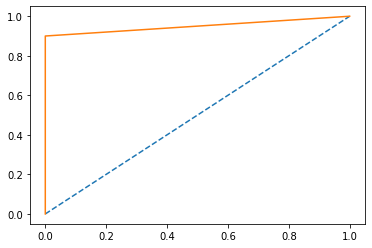

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')


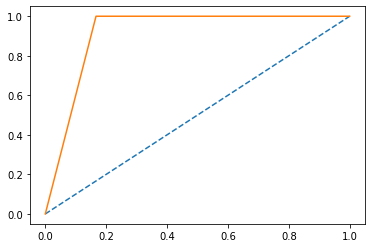

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')


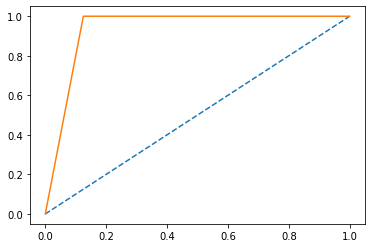

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')


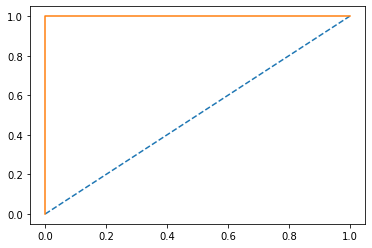

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')


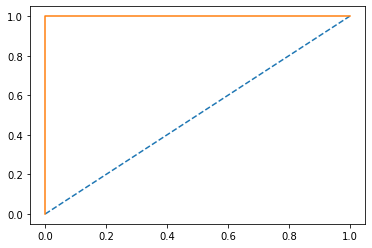

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')


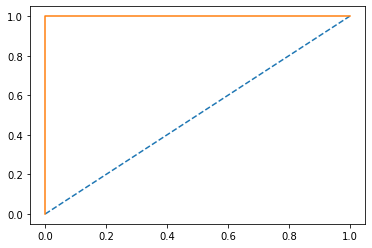

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


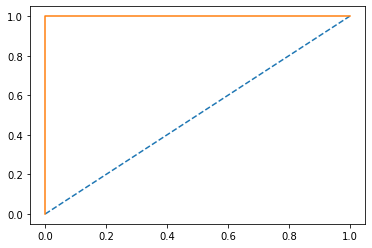

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')


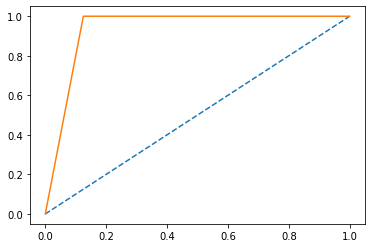

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')


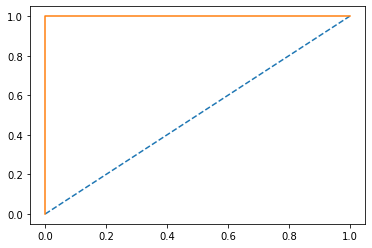

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')


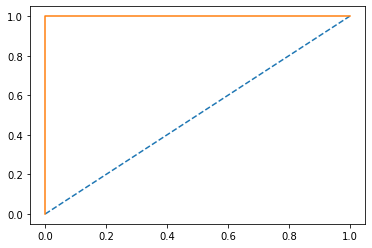

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')


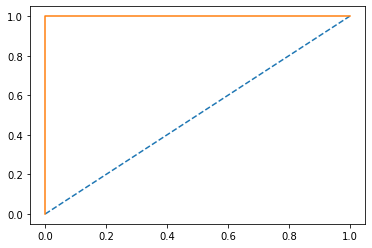

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1], device='cuda:0')


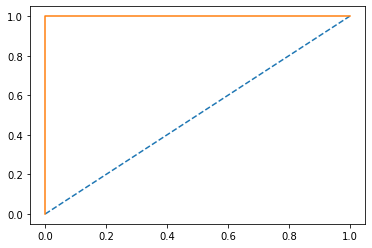

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')


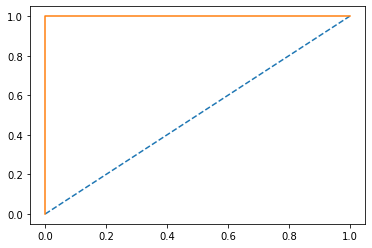

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1], device='cuda:0')


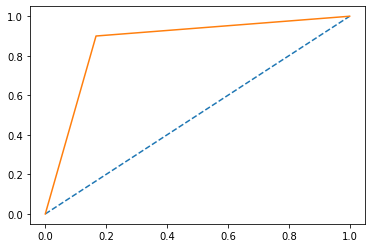

roc 0.8666666666666666
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')


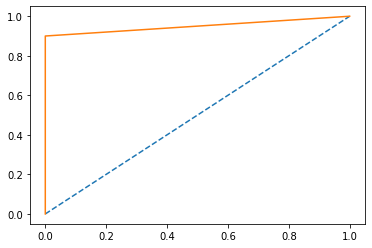

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')


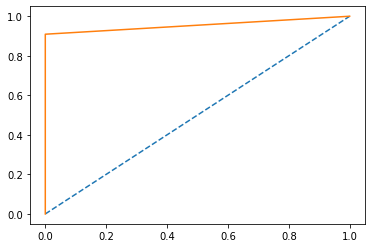

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1], device='cuda:0')


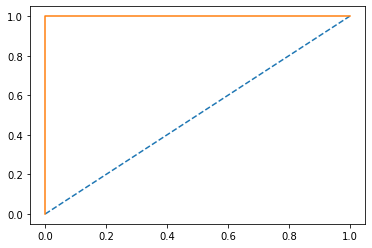

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


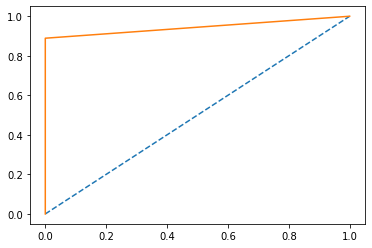

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')


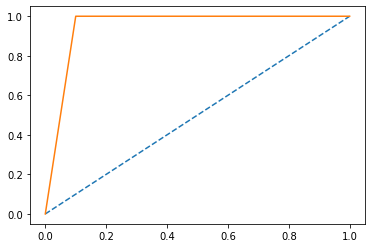

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


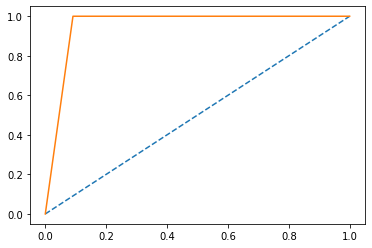

roc 0.9545454545454545
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')


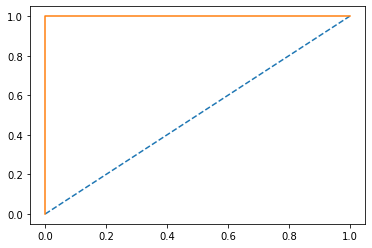

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')


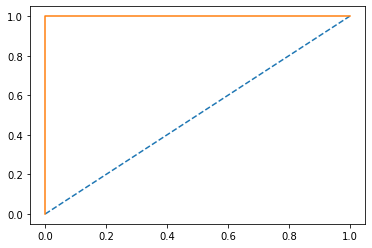

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


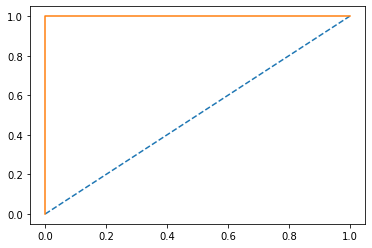

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')


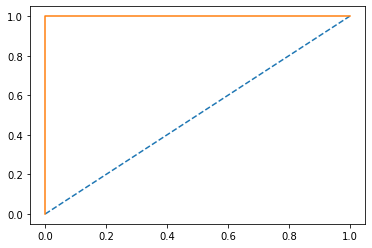

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')


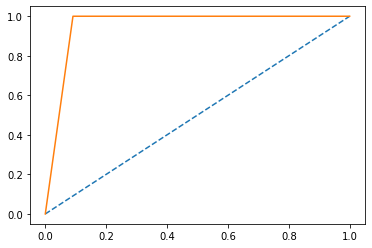

roc 0.9545454545454545
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')


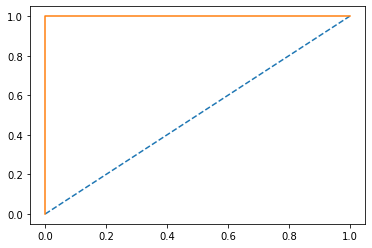

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')


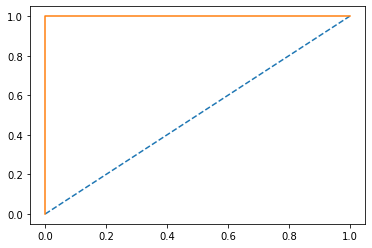

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')


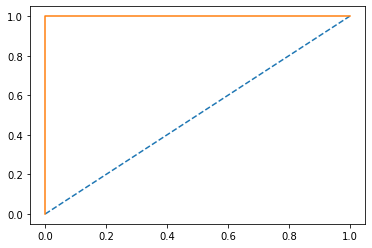

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')


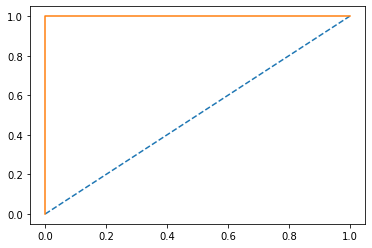

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0], device='cuda:0')


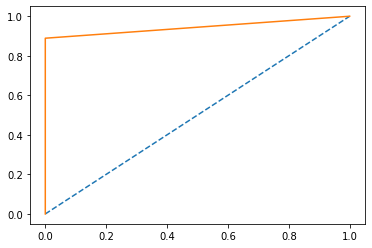

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1], device='cuda:0')


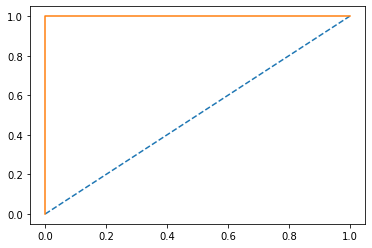

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')


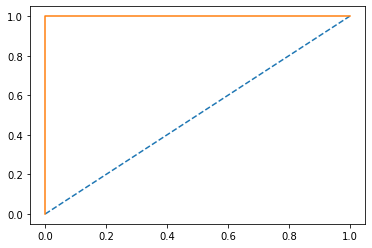

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1], device='cuda:0')


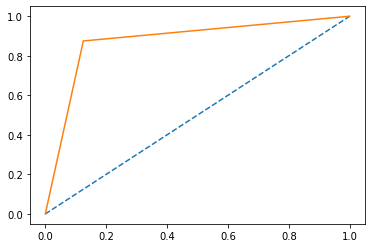

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


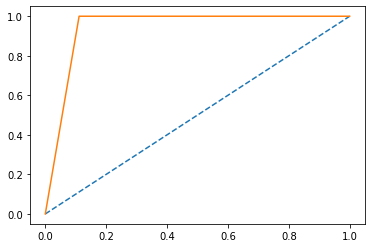

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0], device='cuda:0')


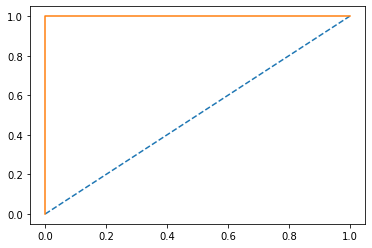

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')


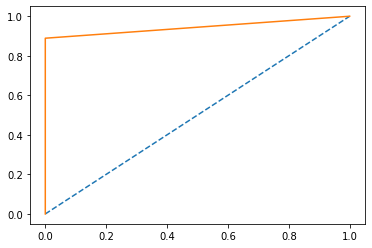

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')


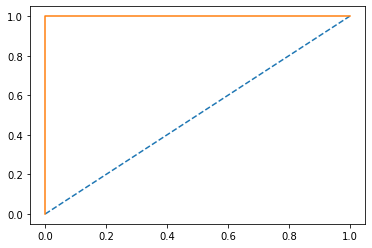

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')


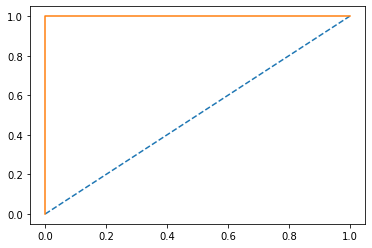

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')


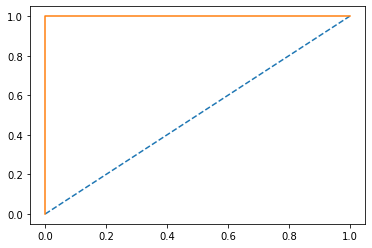

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')


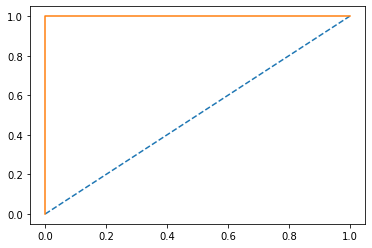

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1], device='cuda:0')


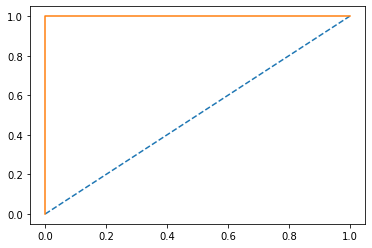

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0], device='cuda:0')


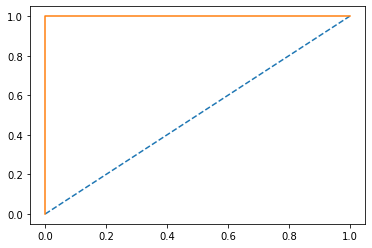

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')


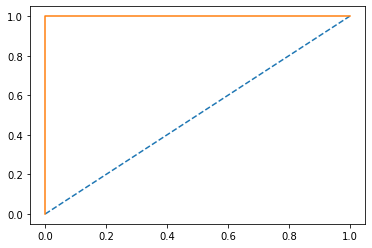

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')


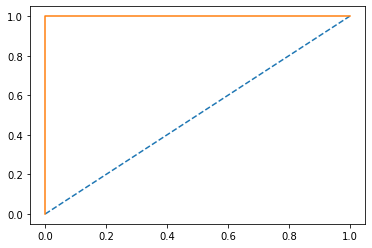

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0], device='cuda:0')


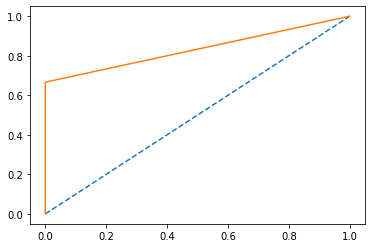

roc 0.8333333333333333
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1], device='cuda:0')


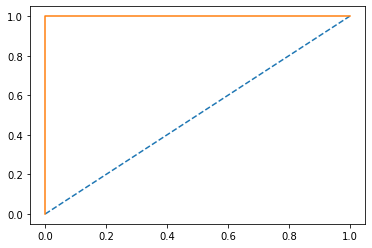

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')


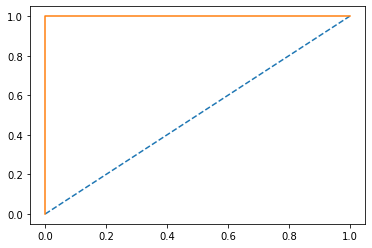

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')


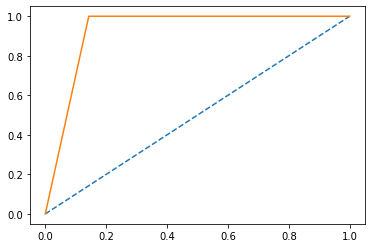

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')


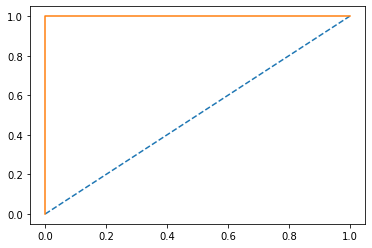

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')


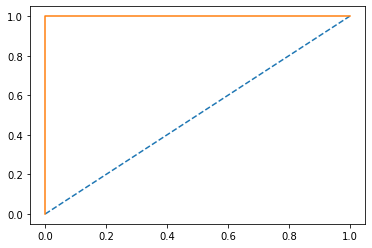

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')


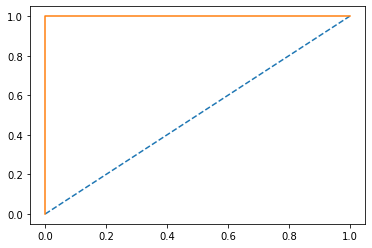

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


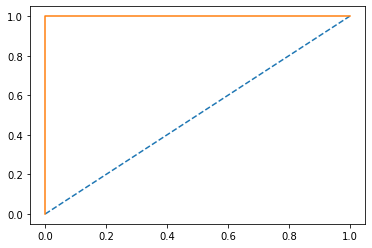

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')


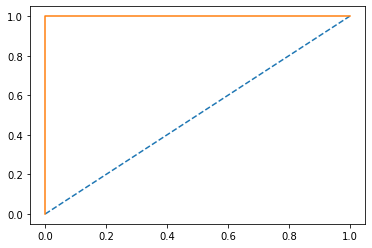

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')


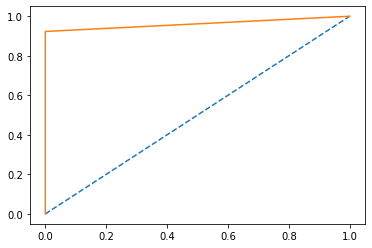

roc 0.9615384615384616
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')


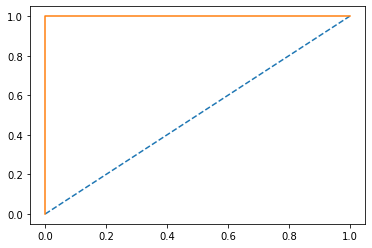

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0], device='cuda:0')


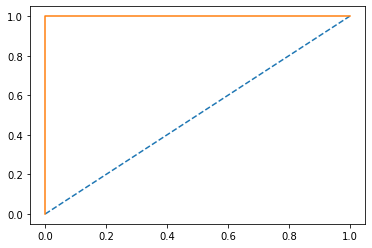

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')


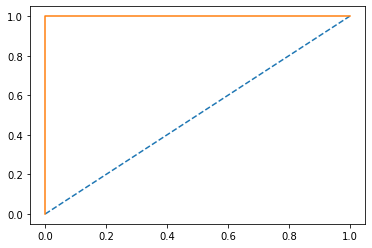

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')


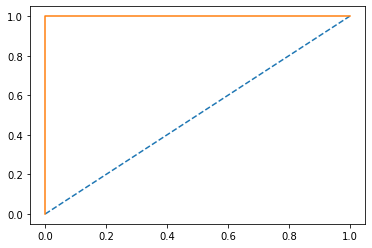

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')


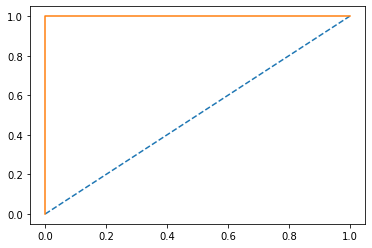

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1], device='cuda:0')


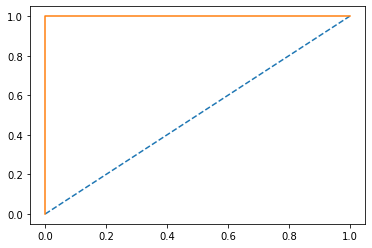

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')


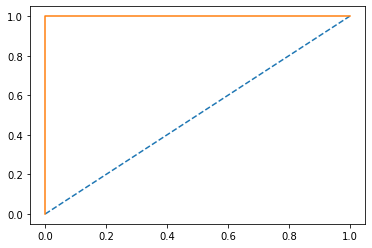

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')


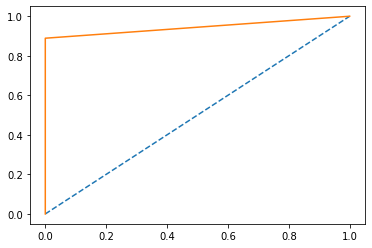

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')


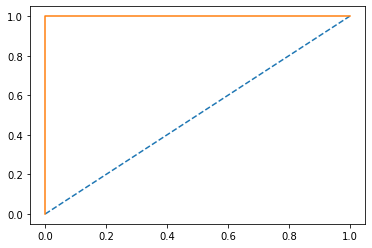

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')


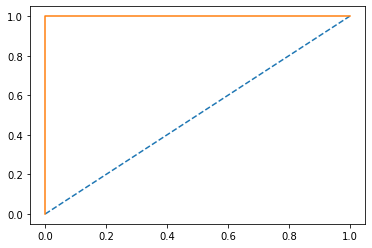

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0], device='cuda:0')


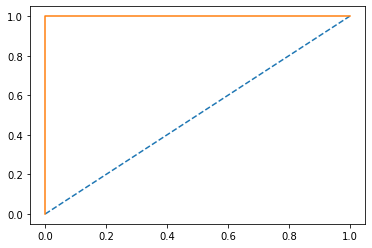

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')


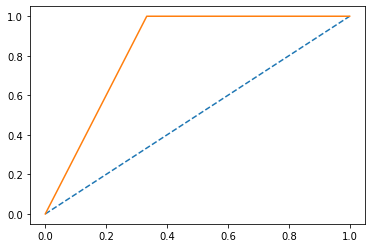

roc 0.8333333333333334
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')


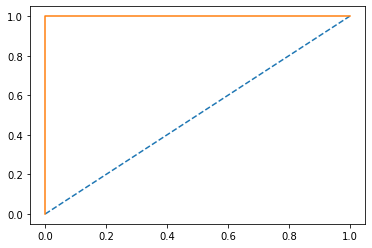

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')


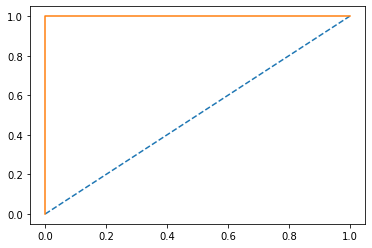

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


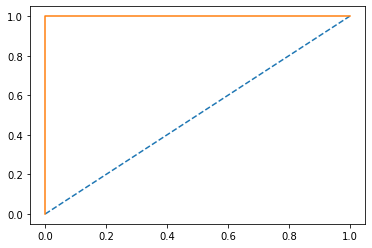

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0], device='cuda:0')


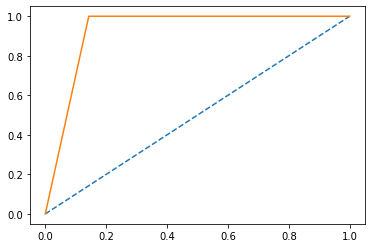

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0], device='cuda:0')


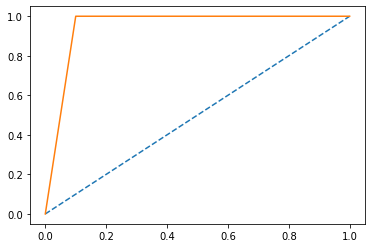

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')


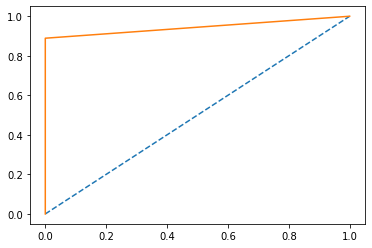

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1], device='cuda:0')


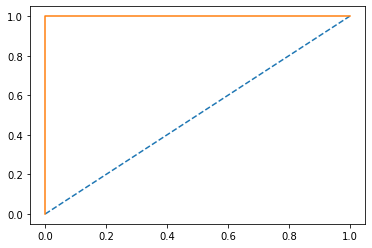

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1], device='cuda:0')


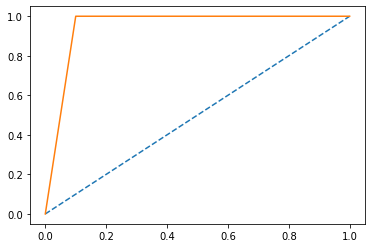

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')


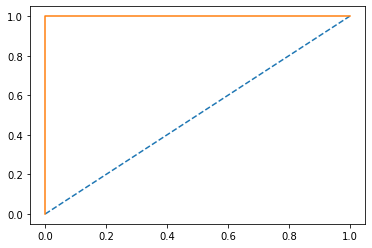

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')


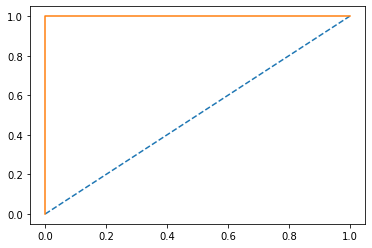

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0], device='cuda:0')


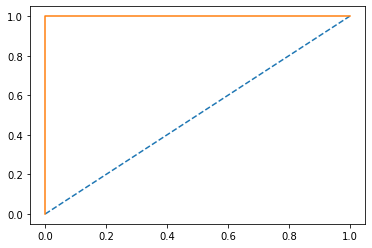

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


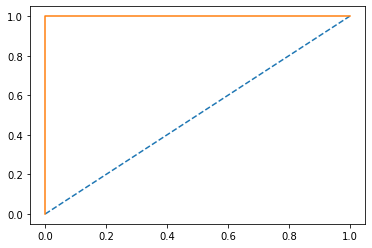

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')


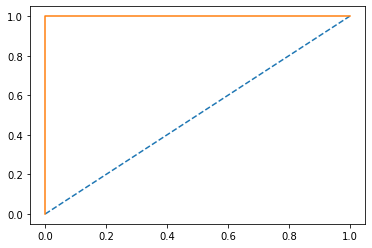

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0], device='cuda:0')


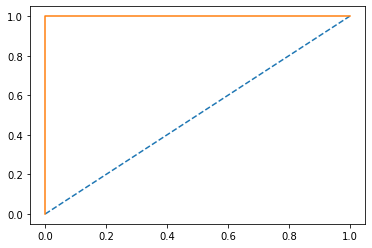

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')


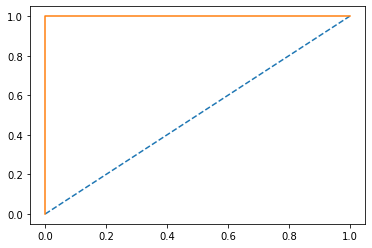

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')


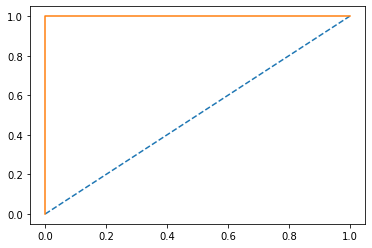

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')


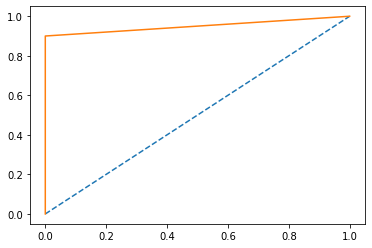

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')


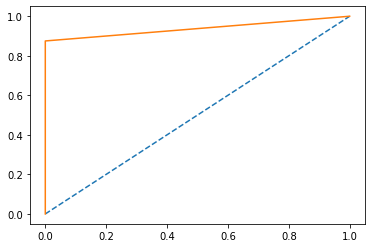

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], device='cuda:0')


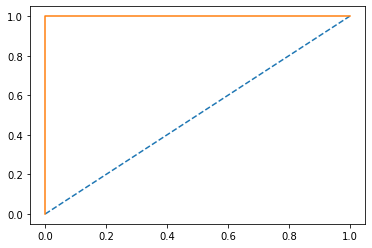

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1], device='cuda:0')


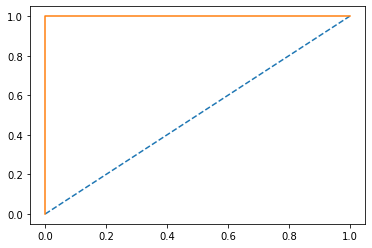

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


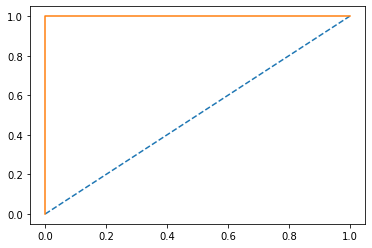

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


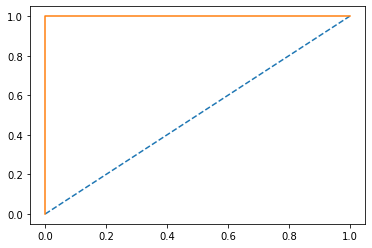

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')


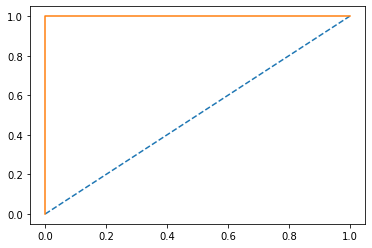

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1], device='cuda:0')


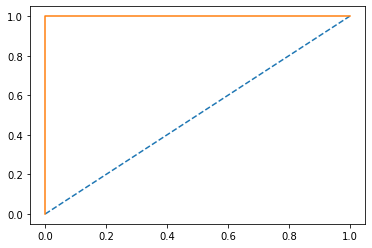

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')


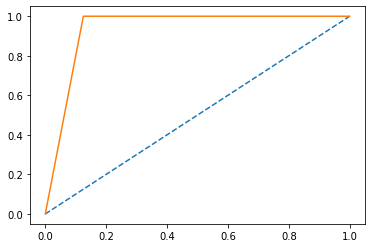

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0], device='cuda:0')


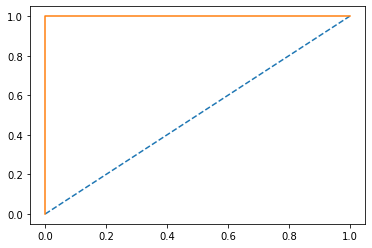

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1], device='cuda:0')


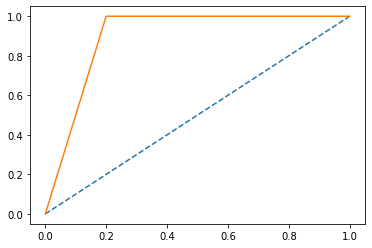

roc 0.9
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


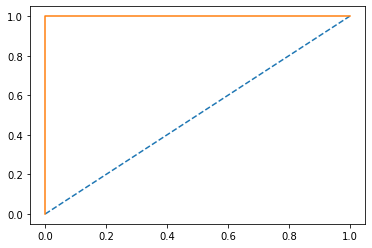

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


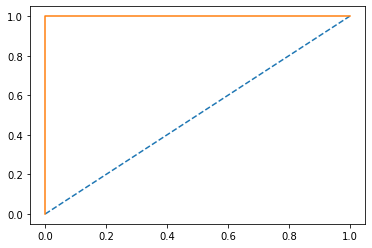

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0], device='cuda:0')


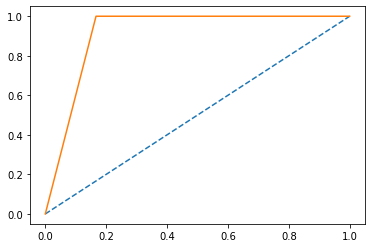

roc 0.9166666666666667
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')


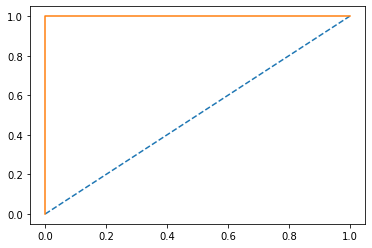

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')


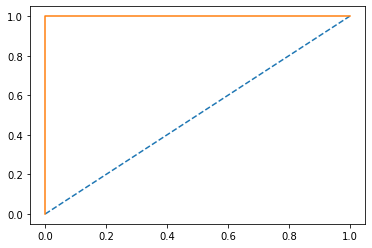

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')


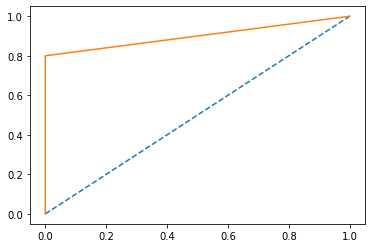

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')


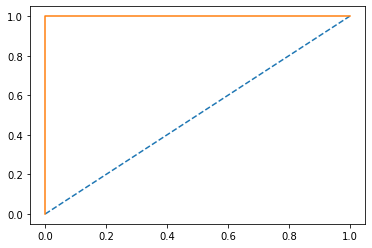

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0], device='cuda:0')


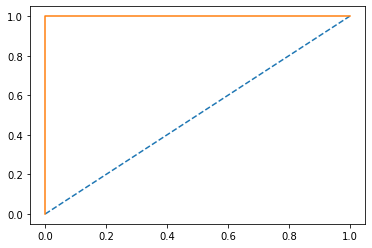

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')


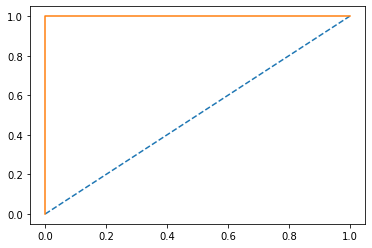

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


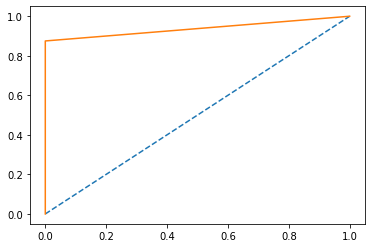

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0], device='cuda:0')


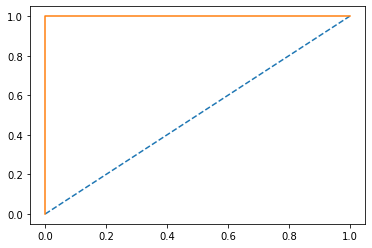

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1], device='cuda:0')


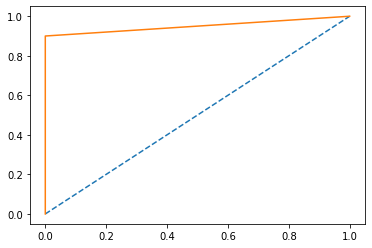

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


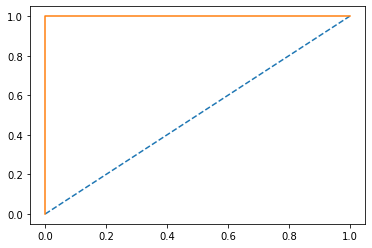

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')


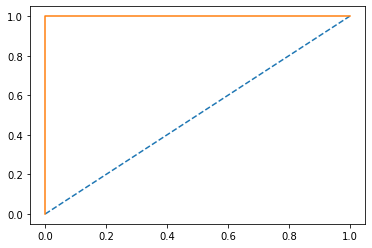

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1], device='cuda:0')


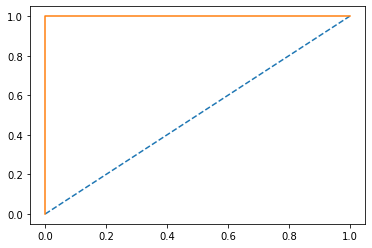

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1], device='cuda:0')


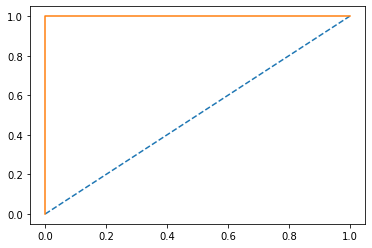

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')


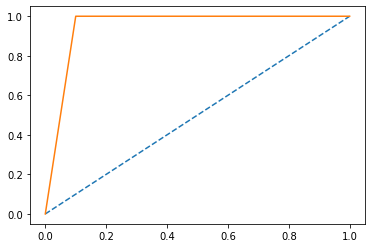

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1], device='cuda:0')


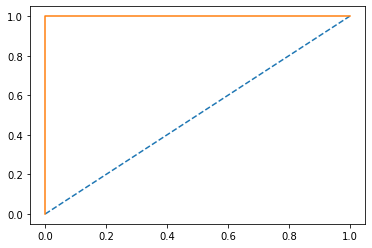

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')


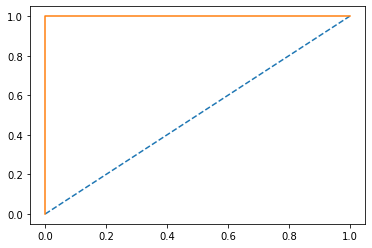

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')


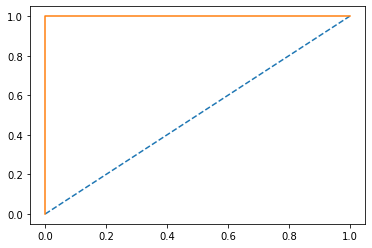

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')


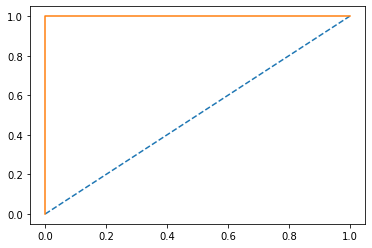

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1], device='cuda:0')


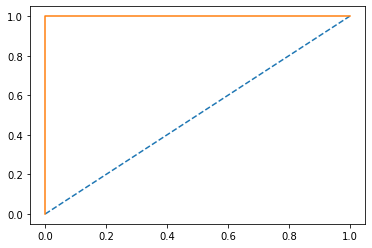

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1], device='cuda:0')


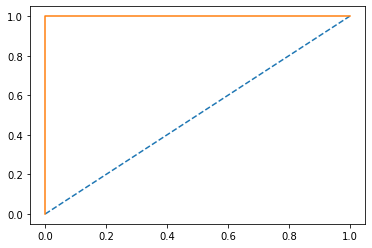

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')


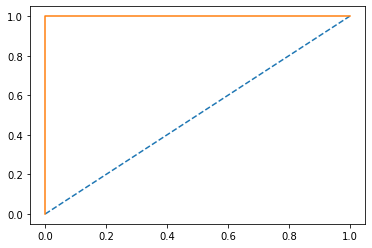

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')


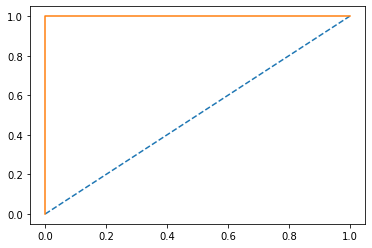

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


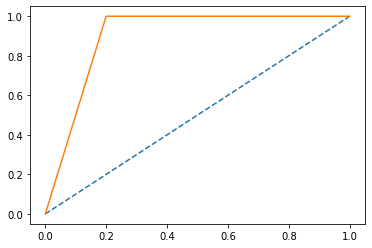

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')


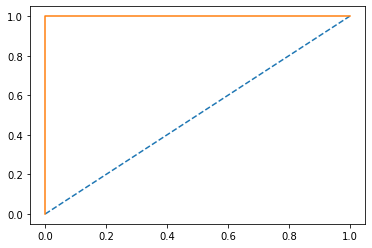

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


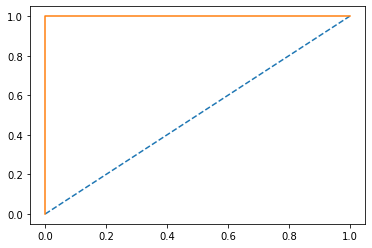

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


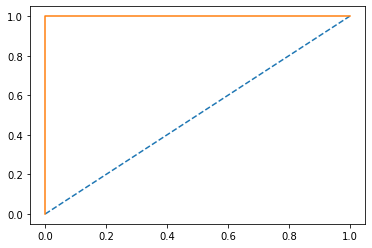

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0], device='cuda:0')


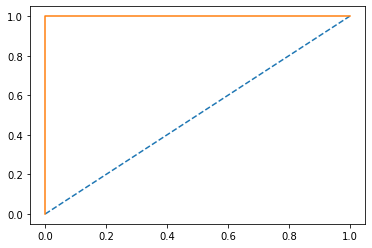

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0], device='cuda:0')


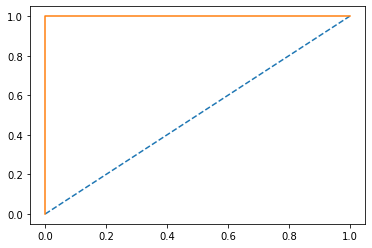

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')


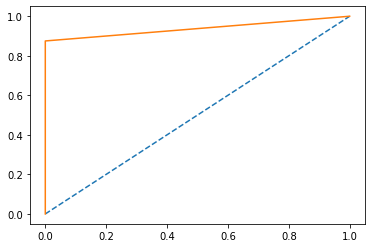

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')


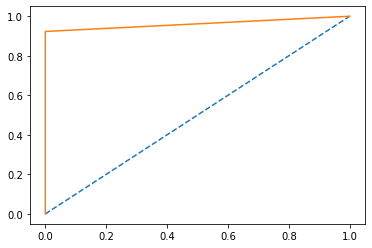

roc 0.9615384615384616
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0], device='cuda:0')


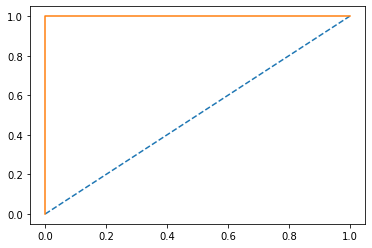

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')


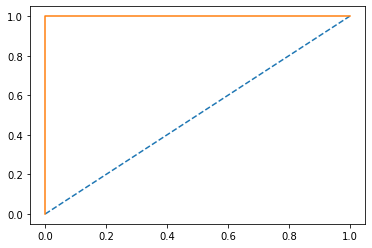

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')


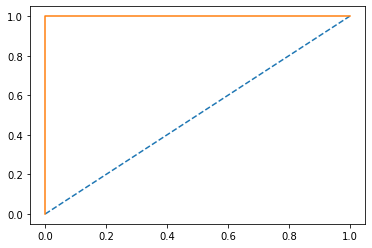

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')


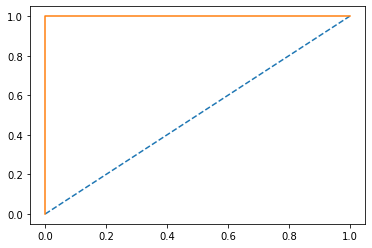

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0], device='cuda:0')


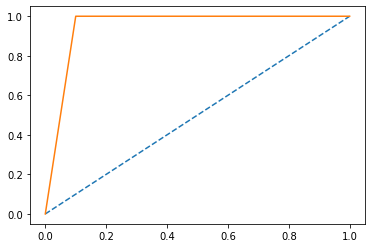

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0], device='cuda:0')


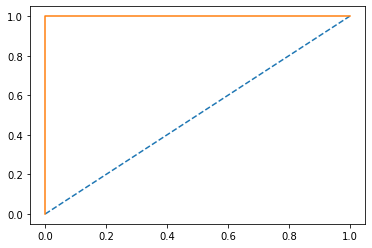

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')


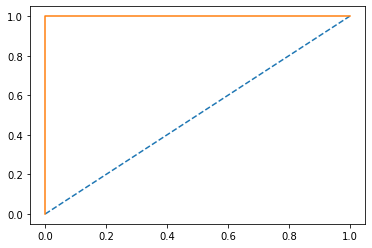

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')


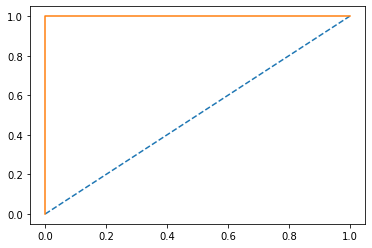

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1], device='cuda:0')


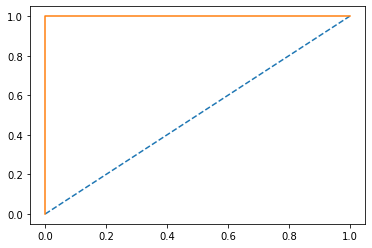

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')


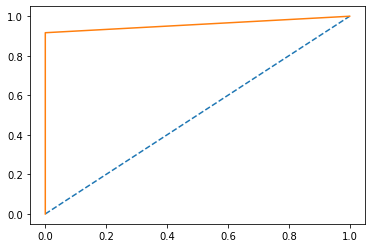

roc 0.9583333333333333
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')


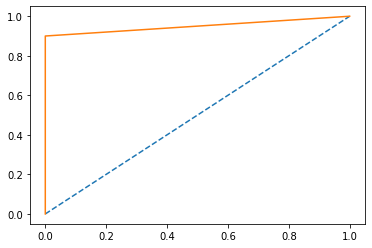

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1], device='cuda:0')


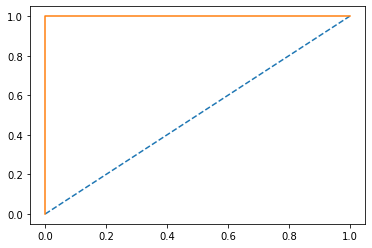

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')


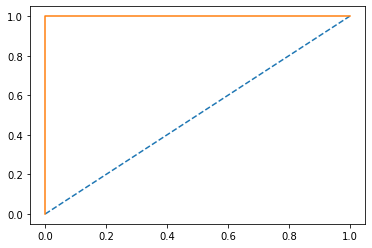

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0], device='cuda:0')


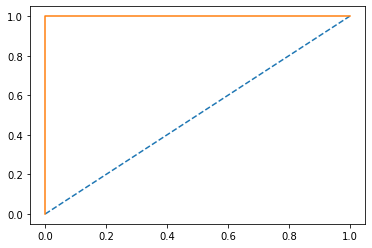

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1], device='cuda:0')


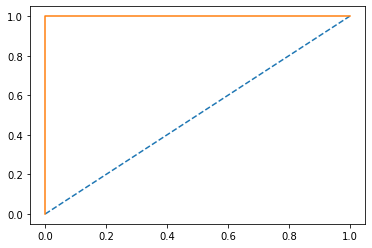

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')


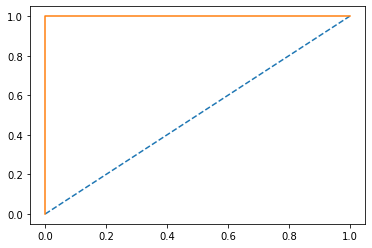

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1], device='cuda:0')


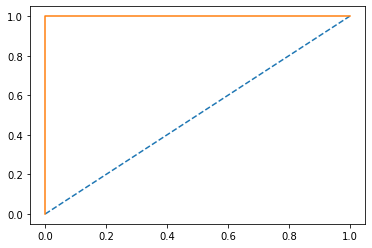

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')


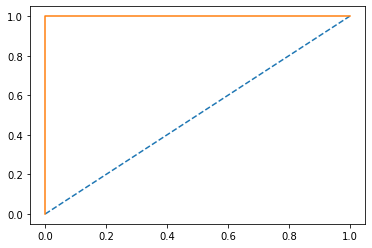

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0], device='cuda:0')


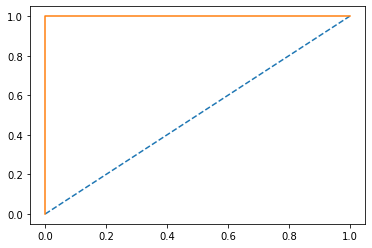

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


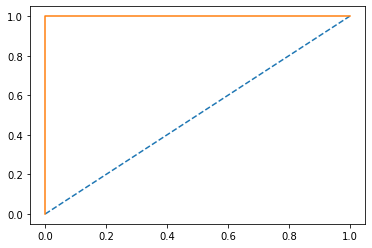

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


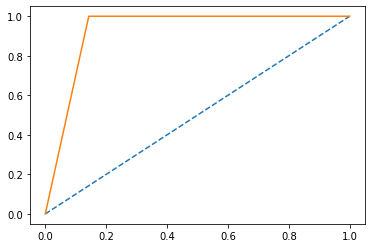

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')


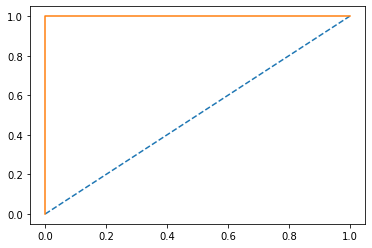

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0], device='cuda:0')


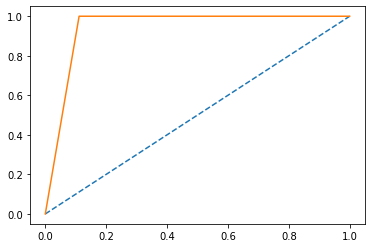

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')


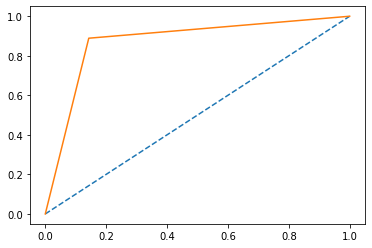

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0], device='cuda:0')


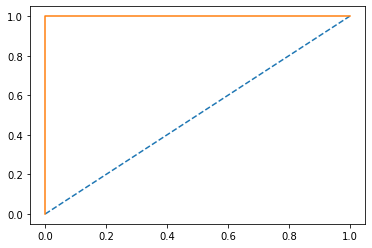

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')


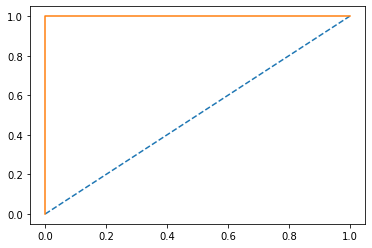

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')


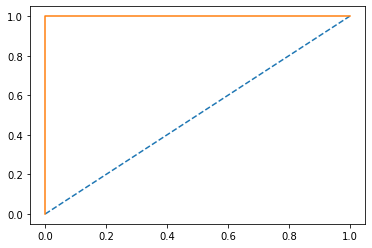

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1], device='cuda:0')


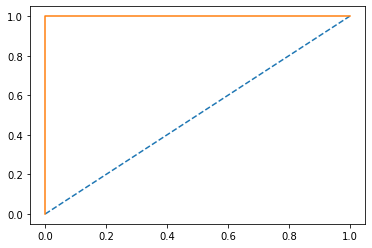

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')


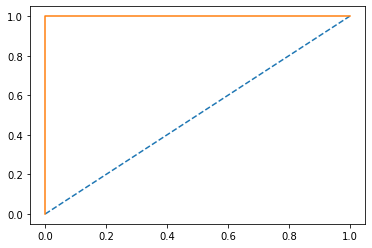

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')


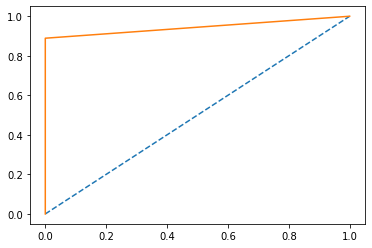

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1], device='cuda:0')


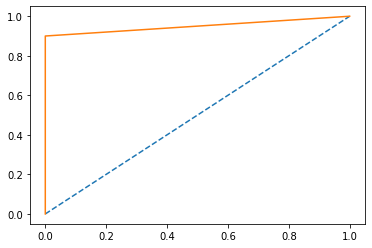

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1], device='cuda:0')


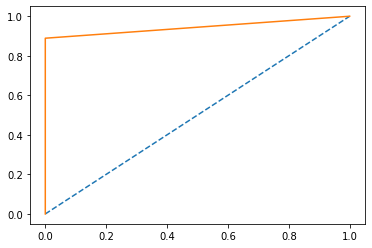

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1], device='cuda:0')


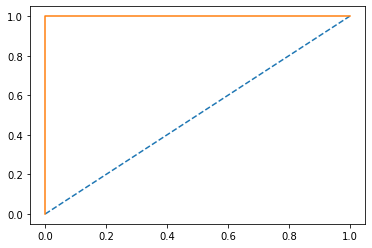

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0], device='cuda:0')


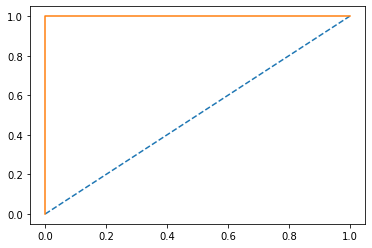

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')


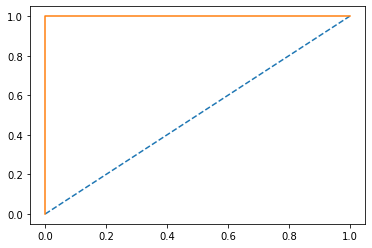

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')


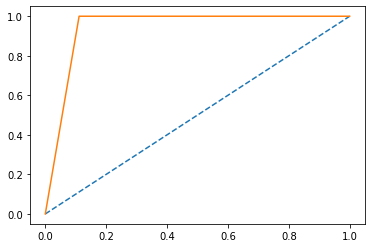

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')


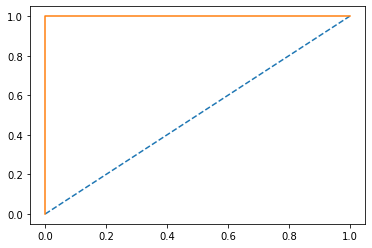

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


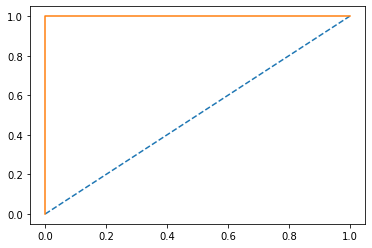

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], device='cuda:0')


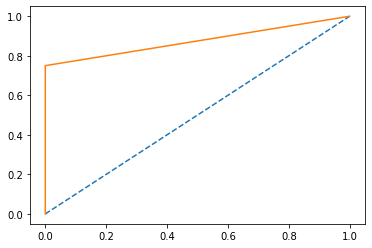

roc 0.875
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')


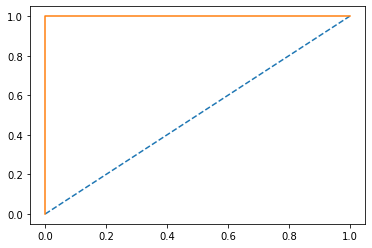

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1], device='cuda:0')


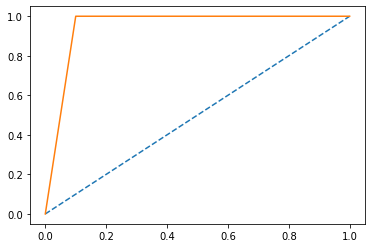

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')


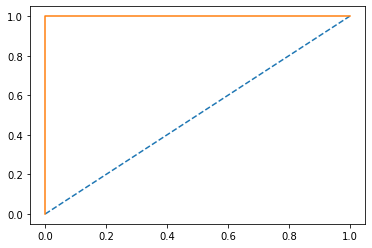

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1], device='cuda:0')


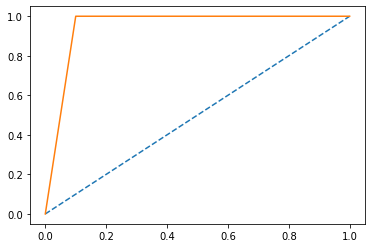

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')


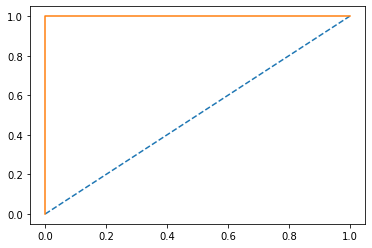

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


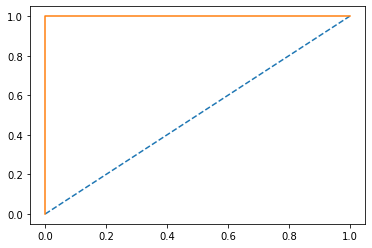

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0], device='cuda:0')


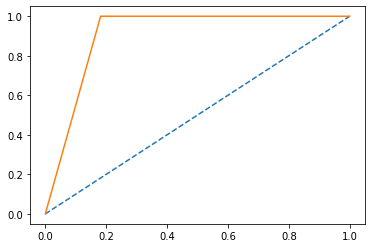

roc 0.9090909090909091
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0], device='cuda:0')


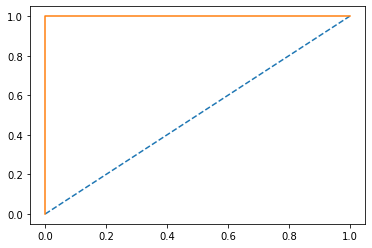

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')


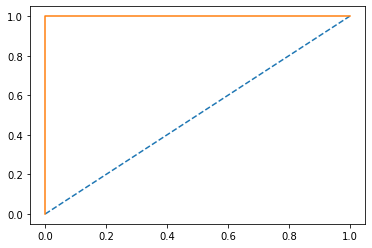

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0], device='cuda:0')


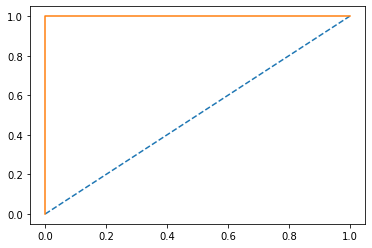

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0], device='cuda:0')


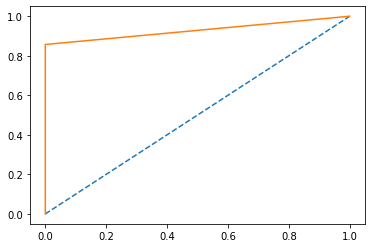

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0], device='cuda:0')


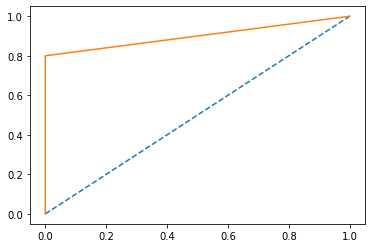

roc 0.9
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


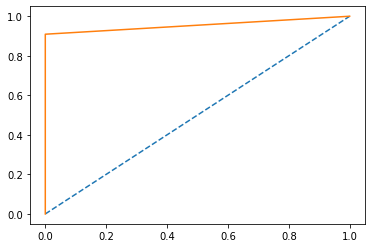

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


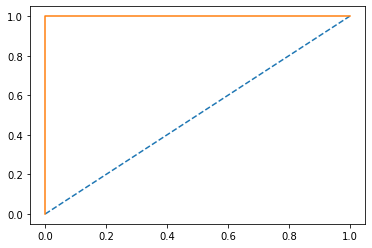

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')


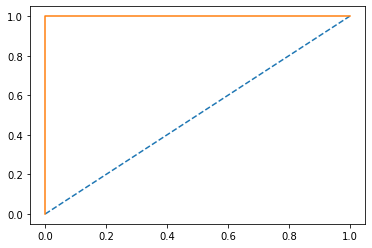

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0], device='cuda:0')


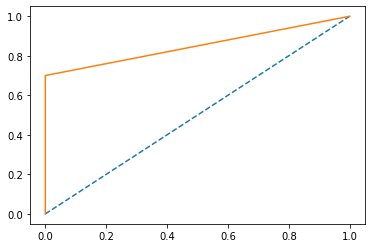

roc 0.85
acc1 tensor(0.8125, device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1], device='cuda:0')


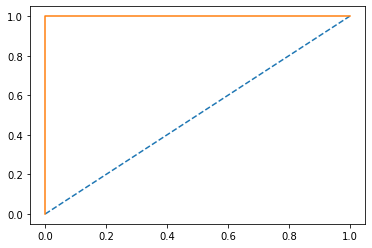

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')


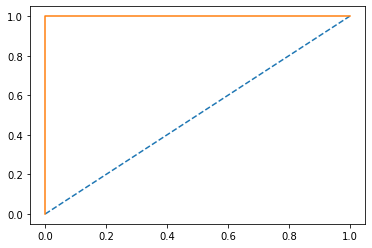

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1], device='cuda:0')


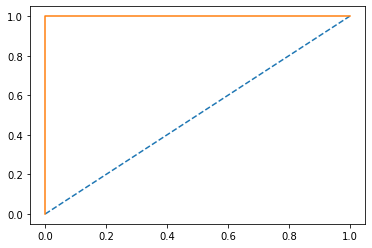

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1], device='cuda:0')


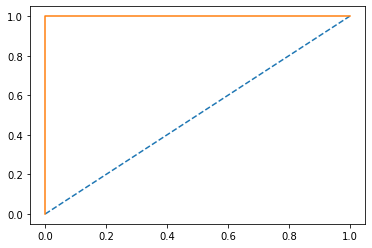

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1], device='cuda:0')


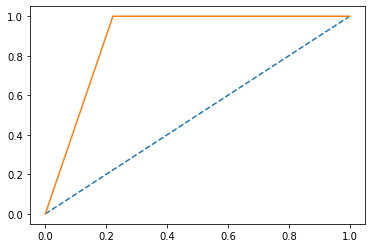

roc 0.8888888888888888
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0], device='cuda:0')


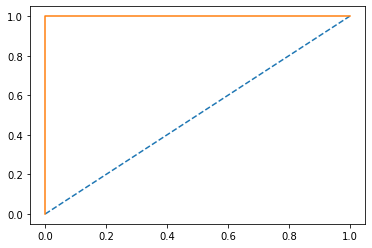

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1], device='cuda:0')


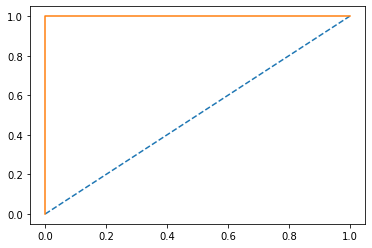

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1], device='cuda:0')


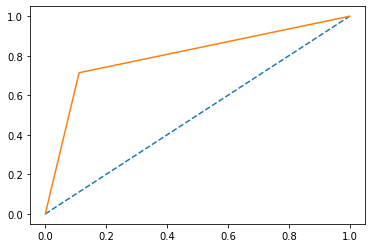

roc 0.8015873015873016
acc1 tensor(0.8125, device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')


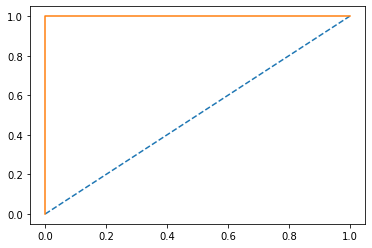

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1], device='cuda:0')


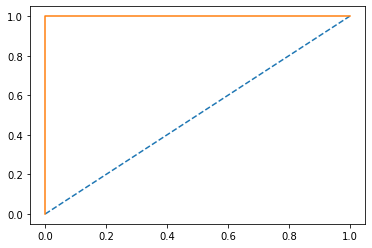

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0], device='cuda:0')


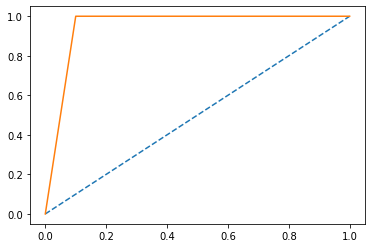

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0], device='cuda:0')


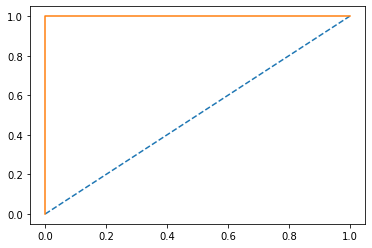

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')


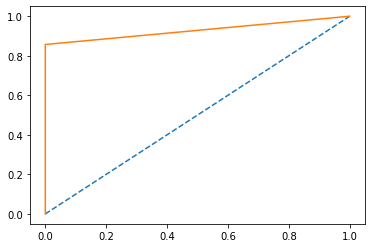

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')


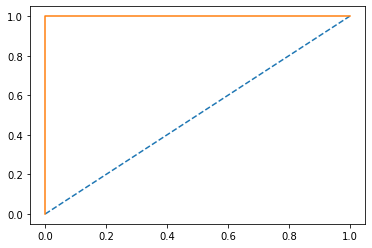

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


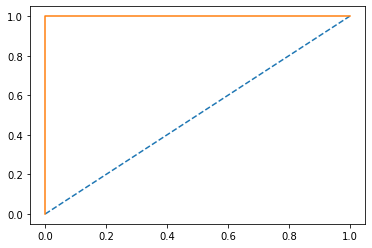

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


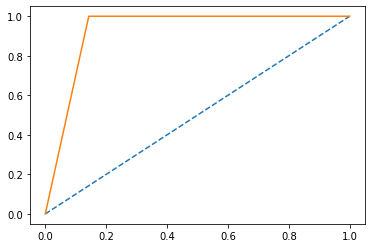

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0], device='cuda:0')


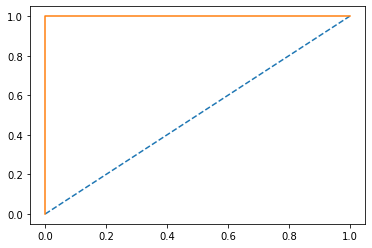

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1], device='cuda:0')


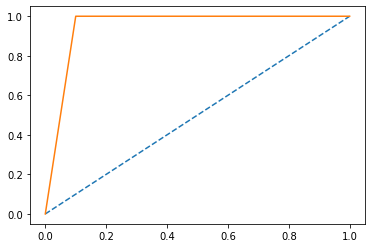

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0], device='cuda:0')


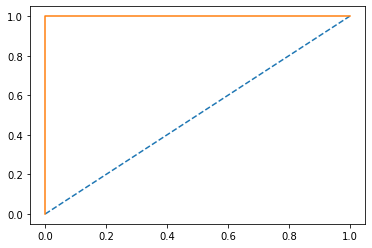

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0], device='cuda:0')


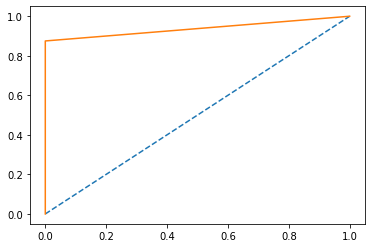

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1], device='cuda:0')


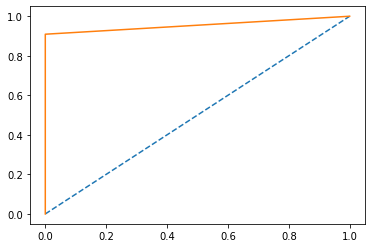

roc 0.9545454545454546
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')


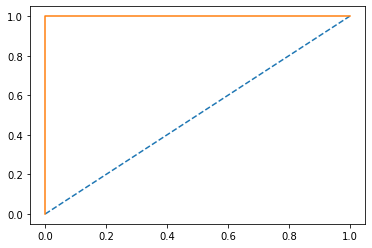

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')


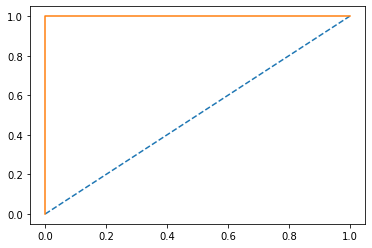

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1], device='cuda:0')


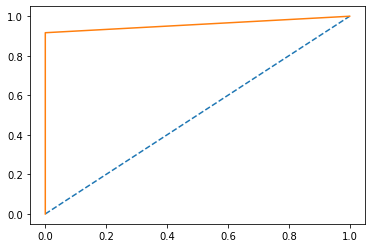

roc 0.9583333333333333
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1], device='cuda:0')


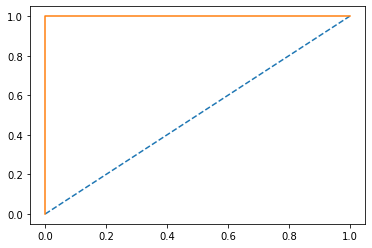

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0], device='cuda:0')


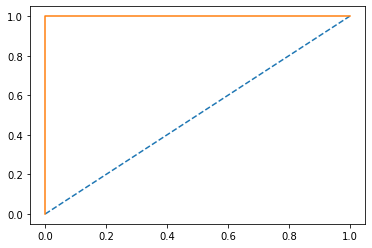

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')


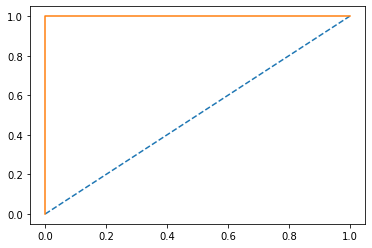

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1], device='cuda:0')


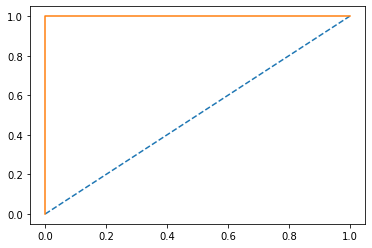

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1], device='cuda:0')


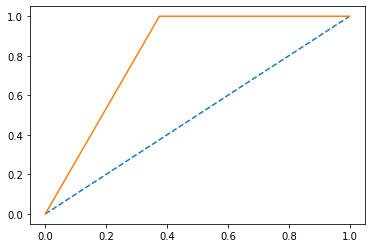

roc 0.8125
acc1 tensor(0.8125, device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1], device='cuda:0')


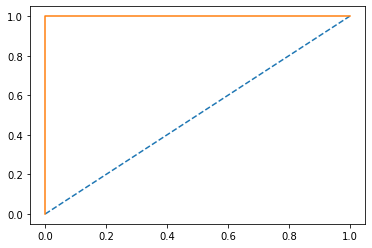

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1], device='cuda:0')


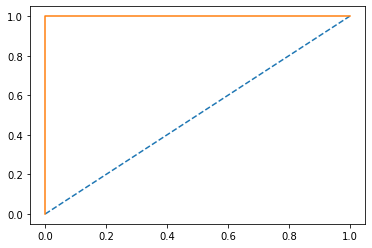

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0], device='cuda:0')


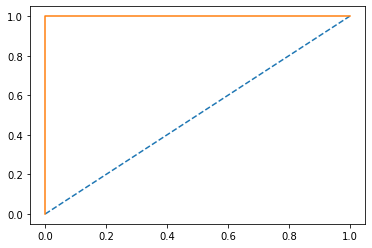

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0], device='cuda:0')


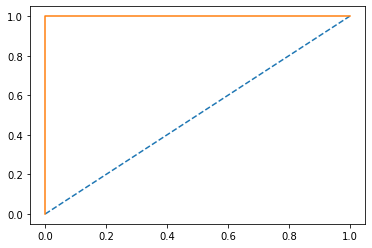

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1], device='cuda:0')


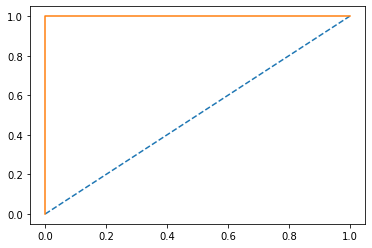

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1], device='cuda:0')


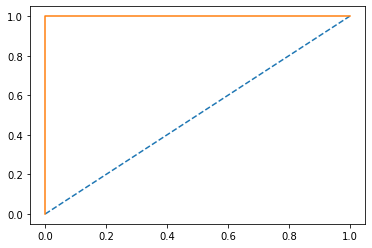

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1], device='cuda:0')


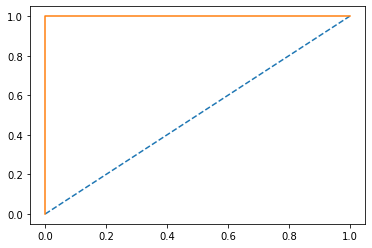

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0], device='cuda:0')


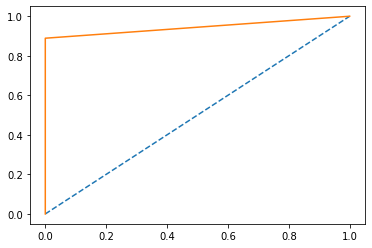

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')
prob tensor([0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1], device='cuda:0')


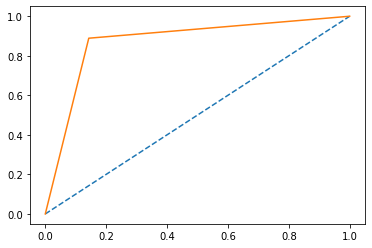

roc 0.873015873015873
acc1 tensor(0.8750, device='cuda:0')
pred tensor([1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1], device='cuda:0')


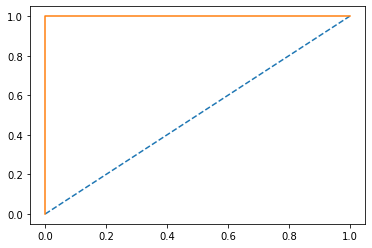

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')
prob tensor([1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1], device='cuda:0')


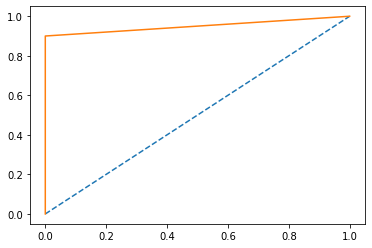

roc 0.95
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')
prob tensor([0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0], device='cuda:0')


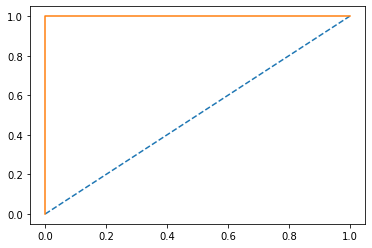

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0], device='cuda:0')


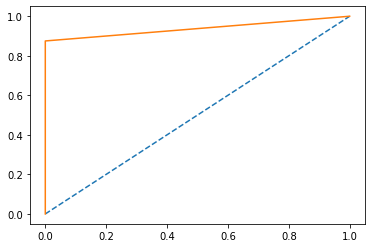

roc 0.9375
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


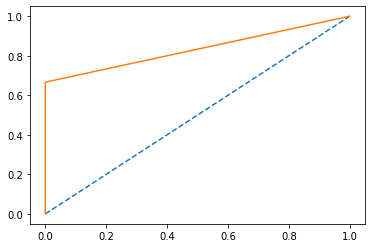

roc 0.8333333333333333
acc1 tensor(0.9375, device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1], device='cuda:0')


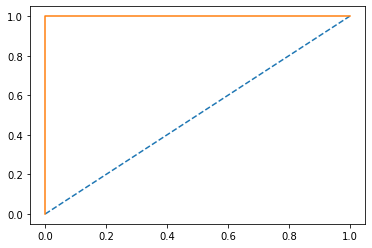

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


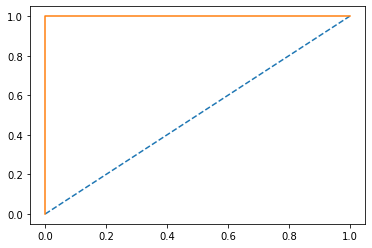

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1], device='cuda:0')


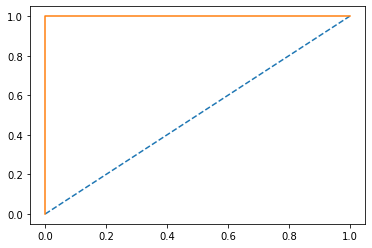

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1], device='cuda:0')


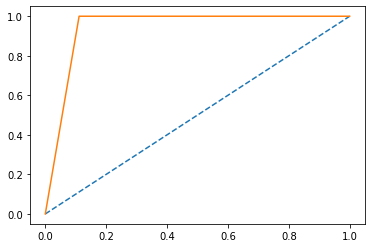

roc 0.9444444444444444
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0], device='cuda:0')


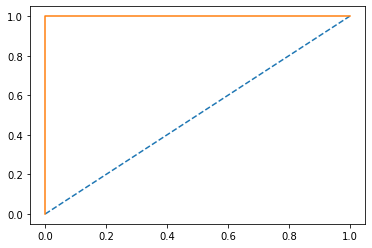

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1], device='cuda:0')


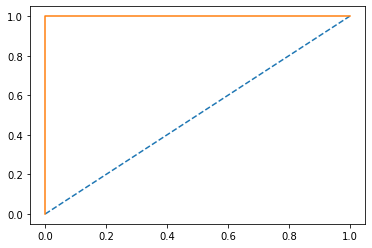

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')


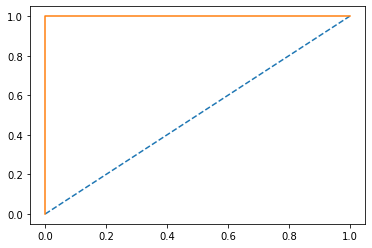

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


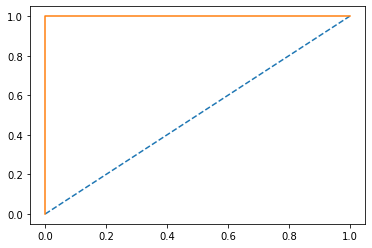

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0], device='cuda:0')


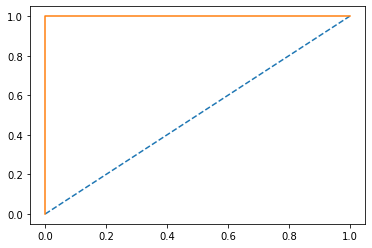

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0], device='cuda:0')


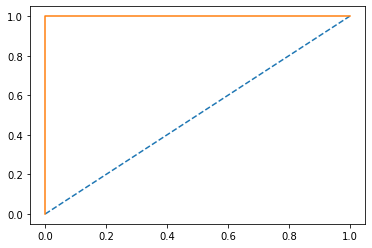

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0], device='cuda:0')


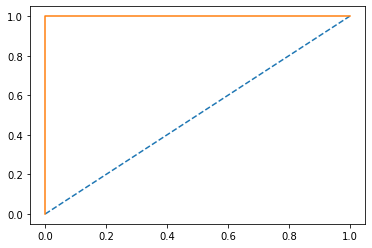

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')
prob tensor([1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0], device='cuda:0')


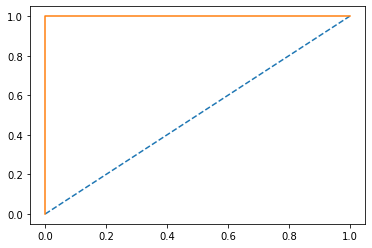

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0], device='cuda:0')


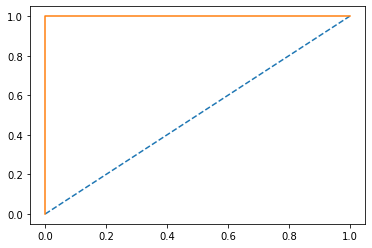

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1], device='cuda:0')


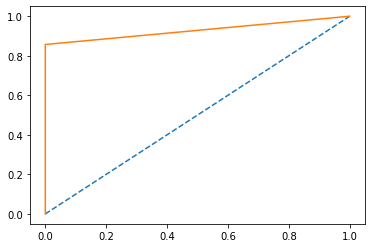

roc 0.9285714285714286
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0], device='cuda:0')


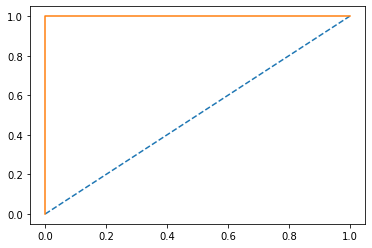

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')
prob tensor([1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0], device='cuda:0')


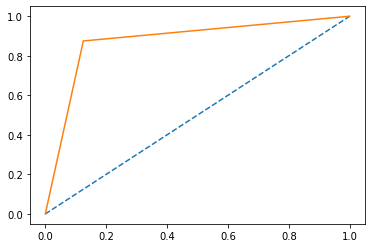

roc 0.875
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0], device='cuda:0')


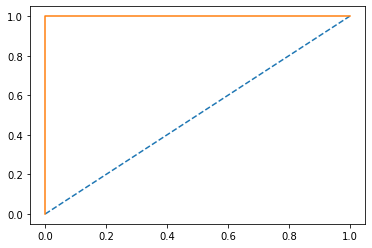

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')
prob tensor([1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0], device='cuda:0')


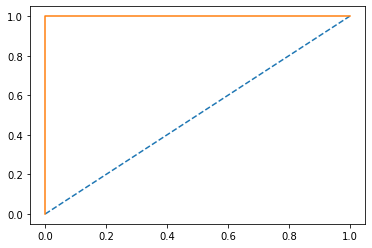

roc 1.0
acc1 tensor(1., device='cuda:0')
pred tensor([1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')
prob tensor([1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1], device='cuda:0')


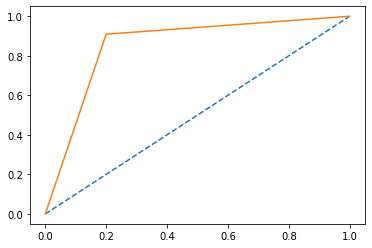

roc 0.8545454545454546
acc1 tensor(0.8750, device='cuda:0')
pred tensor([0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')
prob tensor([0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0], device='cuda:0')


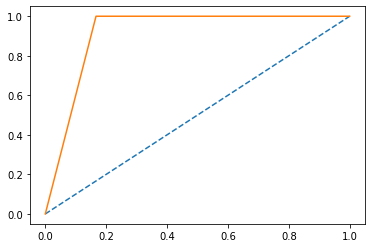

roc 0.9166666666666667
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')
prob tensor([0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0], device='cuda:0')


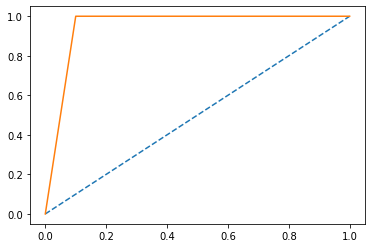

roc 0.9500000000000001
acc1 tensor(0.9375, device='cuda:0')
pred tensor([0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1], device='cuda:0')
prob tensor([0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1], device='cuda:0')


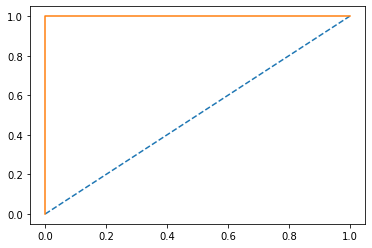

roc 1.0
acc1 tensor(1., device='cuda:0')


TypeError: ignored

In [ ]:
train(model, train_loader, val_loader, optimizer)

In [ ]:
import numpy as np
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from matplotlib import pyplot
import sklearn
from sklearn.metrics import roc_auc_score

from sklearn.metrics import f1_score

def multi_acc(y_pred, y_test):
  global second_iter, total_roc, number_of_iter
  pred = torch.log_softmax(y_pred, dim=1).argmax(dim=1)
  probs = torch.argmax(y_pred,axis=1)
  
  print('pred',pred)
  acc = (pred == y_test).sum().float() / float(y_test.size(0))
  print('prob',probs)
  
  fpr, tpr, thresholds = roc_curve(y_test.cpu().numpy(), probs.cpu().numpy())
  
  pyplot.plot([0, 1], [0, 1], linestyle='--')
  pyplot.plot(fpr, tpr)
  pyplot.show()
  second_iter+=1
  #roc_acc = roc_auc_score(y_test.cpu().numpy(),probs.cpu().numpy())
  #print(f1_score(y_test.cpu().numpy(),pred.cpu().numpy()))
  try:
    roc_auc= roc_auc_score(y_test.cpu().numpy(), probs.cpu().numpy())
    total_roc+=roc_auc
    print('roc',roc_auc)
    number_of_iter+=1
  except ValueError:
    pass
  
  return acc

import time

EPOCHS = 1
total_roc = 0
number_of_iter = 0
second_iter = 0


def train(model, train_loader, val_loader, optimizer):  
  total_step = len(train_loader)

  for epoch in range(EPOCHS):
    start = time.time()
    model.train()
    total_train_loss = 0
    total_train_acc  = 0
    for batch_idx, (pair_token_ids, mask_ids, seg_ids, y) in enumerate(train_loader):
      optimizer.zero_grad()
      pair_token_ids = pair_token_ids.to(device)
      mask_ids = mask_ids.to(device)
      seg_ids = seg_ids.to(device)
      labels = y.to(device)

      loss, prediction = model(pair_token_ids, 
                             token_type_ids=seg_ids, 
                             attention_mask=mask_ids, 
                             labels=labels).values()

      acc = multi_acc(prediction, labels)
      
      #roc_acc = roc_auc_score(labels,prediction,multi_class='ovr')
      #acc = sklearn.accuracy_score(labels,prediction)
      print('acc1',acc)
      loss.backward()
      optimizer.step()
      
      total_train_loss += loss.item()
      total_train_acc  += acc.item()
      

    train_acc  = total_train_acc/len(train_loader)
    train_loss = total_train_loss/len(train_loader)
    model.eval()
    total_val_acc  = 0
    total_val_loss = 0

    with torch.no_grad():
      for batch_idx, (pair_token_ids, mask_ids, seg_ids, y) in enumerate(val_loader):
        optimizer.zero_grad()
        pair_token_ids = pair_token_ids.to(device)
        mask_ids = mask_ids.to(device)
        seg_ids = seg_ids.to(device)
        labels = y.to(device)
        
        loss, prediction = model(pair_token_ids, 
                             token_type_ids=seg_ids, 
                             attention_mask=mask_ids, 
                             labels=labels).values()
        
        acc = multi_acc(prediction, labels)
        #acc = sklearn.accuracy_score(labels,prediction)
        total_val_loss += loss.item()
        total_val_acc  += acc.item()

    val_acc  = total_val_acc/len(val_loader)
    val_loss = total_val_loss/len(val_loader)
    end = time.time()
    hours, rem = divmod(end-start, 3600)
    minutes, seconds = divmod(rem, 60)

    print(f'Epoch {epoch+1}: train_loss: {train_loss:.4f} train_acc: {train_acc:.4f} | val_loss: {val_loss:.4f} val_acc: {val_acc:.4f}')
    print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
    print('roc',total_roc)
    print('num',number_of_iter)
    print('avg',total_roc/number_of_iter)
    print('second',total_roc/second_iter)

In [ ]:
train(model, train_loader, val_loader, optimizer)

The average ROC value while considering only the iterations with values: 0.5001083403025925

The avergae ROC value while considering all the iterations: 0.46704948878159613